# Indian Loan Default Prediction

## The Lifecycle In A Data Science Projects


### 1. Data Gathering
1. Problem Identification/problem understanding
2.	Data collection
3.	Train Val Test split
4.	Just look at the data/try to get a sense of the data/Understand the data
5.	Data cleaning

### 2.EDA

6.	Univariate Analysis
7.	Bi-variate Analysis
8.	Explore Numerical features
9.	Explore Categorical features

### 3.Feature Engineering

10.	Handing Missing values
11.	Handling Outliers
12. Feature transformation
13. Categorical Feature Encoding
14.	Feature scaling
15.	Imbalanced dataset

### 4.Model building

### 5.Feature Selection
16.	Feature Importance
17.	Feature Selection

### 6.Model Evaluation

### 7.Model Saving

### 8.Model Deployment

### 1.Problem Identification/problem understanding

#### Here the problem/challenge is to predict whether a customer will default the loan or not given the relevent parameters

### 2.Data collection

#### The dataset is taken from Kaggle 
https://www.kaggle.com/datasets/subhamjain/loan-prediction-based-on-customer-behavior?datasetId=1532161&sortBy=voteCount&select=Training+Data.csv

In [1]:
## Importing the required libraries

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from sklearn.utils import shuffle

# to ignore warnings
import warnings
warnings.filterwarnings('ignore')

# setting the plot style 
# plt.style.use('ggplot')
sns.set_style('darkgrid')

# To display all the columns of the dataframe
pd.pandas.set_option('display.max_columns',None)

### 3.Train Test split

#### It's a very good practice to split the data into train and test sets as soon as you get the data to avoid overfitting of the model and data leakage.

#### Remember that you want to use the test set only at the very end of your project, once you have a classifier that you are ready to launch

In [2]:
# Load the data

df = pd.read_csv('../Data/Indian_Loan_Default_Prediction/Indian_Loan_Defaut.csv')

In [3]:
df

,Id,Income,Age,Experience,Married/Single,House_Ownership,Car_Ownership,Profession,CITY,STATE,CURRENT_JOB_YRS,CURRENT_HOUSE_YRS,Risk_Flag
0,1,1303834,23,3,single,rented,no,Mechanical_engineer,Rewa,Madhya_Pradesh,3,13,0
1,2,7574516,40,10,single,rented,no,Software_Developer,Parbhani,Maharashtra,9,13,0
2,3,3991815,66,4,married,rented,no,Technical_writer,Alappuzha,Kerala,4,10,0
3,4,6256451,41,2,single,rented,yes,Software_Developer,Bhubaneswar,Odisha,2,12,1
4,5,5768871,47,11,single,rented,no,Civil_servant,Tiruchirappalli[10],Tamil_Nadu,3,14,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
251995,251996,8154883,43,13,single,rented,no,Surgeon,Kolkata,West_Bengal,6,11,0
251996,251997,2843572,26,10,single,rented,no,Army_officer,Rewa,Madhya_Pradesh,6,11,0
251997,251998,4522448,46,7,single,rented,no,Design_Engineer,Kalyan-Dombivli,Maharashtra,7,12,0
251998,251999,6507128,45,0,single,rented,no,Graphic_Designer,Pondicherry,Puducherry,0,10,0


### Initial thoughts and few question :

By the look of the dataset and initial observation we know we have to predict whether a customer will default the loan or not given the relevent parameters

We want to find the answers for the below few questions by the end of EDA

1. What are the few distinctions between the 2 category of customers default/non-default in terms of the given parameters?
2. Seems we have data from India so from which region/state customers defaulting more and from which region/state customers defaulting less?
3. And which age group customers defaulting more or defaulting less?
4. And how each feature is contributing in analyzing the customer churn behaviour?

In [4]:
df.shape

(252000, 13)

In [5]:
# From the initial observations we can drop ['Id'] 
# because this feature won't be having any predictive power over the target variable. it is just a unique identifier of rows.

In [6]:
df.drop(['Id'],axis = 1,inplace=True)

In [7]:
# Renaming the 'Risk_Flag' feature to 'target' for the ease of analysis

df.rename(columns = {'Risk_Flag':'target'}, inplace = True)

In [8]:
df

,Income,Age,Experience,Married/Single,House_Ownership,Car_Ownership,Profession,CITY,STATE,CURRENT_JOB_YRS,CURRENT_HOUSE_YRS,target
0,1303834,23,3,single,rented,no,Mechanical_engineer,Rewa,Madhya_Pradesh,3,13,0
1,7574516,40,10,single,rented,no,Software_Developer,Parbhani,Maharashtra,9,13,0
2,3991815,66,4,married,rented,no,Technical_writer,Alappuzha,Kerala,4,10,0
3,6256451,41,2,single,rented,yes,Software_Developer,Bhubaneswar,Odisha,2,12,1
4,5768871,47,11,single,rented,no,Civil_servant,Tiruchirappalli[10],Tamil_Nadu,3,14,1
...,...,...,...,...,...,...,...,...,...,...,...,...
251995,8154883,43,13,single,rented,no,Surgeon,Kolkata,West_Bengal,6,11,0
251996,2843572,26,10,single,rented,no,Army_officer,Rewa,Madhya_Pradesh,6,11,0
251997,4522448,46,7,single,rented,no,Design_Engineer,Kalyan-Dombivli,Maharashtra,7,12,0
251998,6507128,45,0,single,rented,no,Graphic_Designer,Pondicherry,Puducherry,0,10,0


In [9]:
df.target.value_counts()

0    221004
1     30996
Name: target, dtype: int64

In [10]:
# sampling 2000 instances from the original dataset for each testing, validation sets and the rest will be traing set

test_df = df.sample(n=2000,random_state=5)
new_df = df.drop(test_df.index)
val_df = new_df.sample(n=2000,random_state=5)
train_df = new_df.drop(val_df.index)

total_train_df = new_df.drop(val_df.index)

In [11]:
# resetting the index of train, val and test datasets

train_df = train_df.reset_index(drop=True)
total_train_df = total_train_df.reset_index(drop=True)
test_df = test_df.reset_index(drop=True)
val_df = val_df.reset_index(drop=True)

In [12]:
train_df

,Income,Age,Experience,Married/Single,House_Ownership,Car_Ownership,Profession,CITY,STATE,CURRENT_JOB_YRS,CURRENT_HOUSE_YRS,target
0,1303834,23,3,single,rented,no,Mechanical_engineer,Rewa,Madhya_Pradesh,3,13,0
1,7574516,40,10,single,rented,no,Software_Developer,Parbhani,Maharashtra,9,13,0
2,3991815,66,4,married,rented,no,Technical_writer,Alappuzha,Kerala,4,10,0
3,6256451,41,2,single,rented,yes,Software_Developer,Bhubaneswar,Odisha,2,12,1
4,5768871,47,11,single,rented,no,Civil_servant,Tiruchirappalli[10],Tamil_Nadu,3,14,1
...,...,...,...,...,...,...,...,...,...,...,...,...
247995,8154883,43,13,single,rented,no,Surgeon,Kolkata,West_Bengal,6,11,0
247996,2843572,26,10,single,rented,no,Army_officer,Rewa,Madhya_Pradesh,6,11,0
247997,4522448,46,7,single,rented,no,Design_Engineer,Kalyan-Dombivli,Maharashtra,7,12,0
247998,6507128,45,0,single,rented,no,Graphic_Designer,Pondicherry,Puducherry,0,10,0


In [13]:
total_train_df

,Income,Age,Experience,Married/Single,House_Ownership,Car_Ownership,Profession,CITY,STATE,CURRENT_JOB_YRS,CURRENT_HOUSE_YRS,target
0,1303834,23,3,single,rented,no,Mechanical_engineer,Rewa,Madhya_Pradesh,3,13,0
1,7574516,40,10,single,rented,no,Software_Developer,Parbhani,Maharashtra,9,13,0
2,3991815,66,4,married,rented,no,Technical_writer,Alappuzha,Kerala,4,10,0
3,6256451,41,2,single,rented,yes,Software_Developer,Bhubaneswar,Odisha,2,12,1
4,5768871,47,11,single,rented,no,Civil_servant,Tiruchirappalli[10],Tamil_Nadu,3,14,1
...,...,...,...,...,...,...,...,...,...,...,...,...
247995,8154883,43,13,single,rented,no,Surgeon,Kolkata,West_Bengal,6,11,0
247996,2843572,26,10,single,rented,no,Army_officer,Rewa,Madhya_Pradesh,6,11,0
247997,4522448,46,7,single,rented,no,Design_Engineer,Kalyan-Dombivli,Maharashtra,7,12,0
247998,6507128,45,0,single,rented,no,Graphic_Designer,Pondicherry,Puducherry,0,10,0


In [14]:
val_df

,Income,Age,Experience,Married/Single,House_Ownership,Car_Ownership,Profession,CITY,STATE,CURRENT_JOB_YRS,CURRENT_HOUSE_YRS,target
0,9142815,26,3,married,rented,yes,Technology_specialist,Berhampore,West_Bengal,3,12,0
1,3545959,28,6,single,rented,no,Magistrate,Mangalore,Karnataka,6,13,0
2,9962662,79,19,single,rented,no,Microbiologist,Amritsar,Punjab,7,11,0
3,7752698,71,15,single,rented,no,Microbiologist,Agartala,Tripura,9,14,1
4,223199,76,8,single,rented,no,Surveyor,Adoni,Andhra_Pradesh,3,14,1
...,...,...,...,...,...,...,...,...,...,...,...,...
1995,4142958,60,2,single,rented,no,Surveyor,Erode[17],Tamil_Nadu,2,11,0
1996,8072596,52,1,single,rented,yes,Computer_operator,Delhi_city,Delhi,1,13,0
1997,5623318,31,13,single,rented,yes,Fashion_Designer,Thane,Maharashtra,13,11,0
1998,7361429,58,2,single,rented,no,Web_designer,Thiruvananthapuram,Kerala,2,12,1


In [15]:
test_df

,Income,Age,Experience,Married/Single,House_Ownership,Car_Ownership,Profession,CITY,STATE,CURRENT_JOB_YRS,CURRENT_HOUSE_YRS,target
0,3486482,28,15,single,rented,yes,Industrial_Engineer,Vijayawada,Andhra_Pradesh,10,10,0
1,8356848,54,2,single,rented,no,Dentist,Nangloi_Jat,Delhi,2,12,1
2,2822929,29,5,single,rented,yes,Chemical_engineer,Tiruvottiyur,Tamil_Nadu,5,10,0
3,1850597,55,12,single,norent_noown,no,Consultant,Nandyal,Andhra_Pradesh,12,10,0
4,4277458,41,8,single,rented,no,Civil_engineer,Kumbakonam,Tamil_Nadu,8,11,0
...,...,...,...,...,...,...,...,...,...,...,...,...
1995,3607368,27,19,single,rented,yes,Technician,Barasat,West_Bengal,13,11,1
1996,6983206,79,10,single,rented,yes,Economist,"Khora,_Ghaziabad",Uttar_Pradesh,3,14,0
1997,2310597,30,6,single,rented,no,Technology_specialist,Pondicherry,Puducherry,6,13,0
1998,6509681,30,10,single,rented,yes,Industrial_Engineer,Nadiad,Gujarat,10,10,0


### 4.Explore the data/try to get a sense of the data

In [16]:
# head() - prints the first 5 rows/records

train_df.head()

,Income,Age,Experience,Married/Single,House_Ownership,Car_Ownership,Profession,CITY,STATE,CURRENT_JOB_YRS,CURRENT_HOUSE_YRS,target
0,1303834,23,3,single,rented,no,Mechanical_engineer,Rewa,Madhya_Pradesh,3,13,0
1,7574516,40,10,single,rented,no,Software_Developer,Parbhani,Maharashtra,9,13,0
2,3991815,66,4,married,rented,no,Technical_writer,Alappuzha,Kerala,4,10,0
3,6256451,41,2,single,rented,yes,Software_Developer,Bhubaneswar,Odisha,2,12,1
4,5768871,47,11,single,rented,no,Civil_servant,Tiruchirappalli[10],Tamil_Nadu,3,14,1


In [17]:
# prints the shape of the dataframe (rows, columns)

train_df.shape

(248000, 12)

In [18]:
# Prints the no.of rows, no.of colunmns, and each columns datatype and the no.of non-null values in each column

train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 248000 entries, 0 to 247999
Data columns (total 12 columns):
 #   Column             Non-Null Count   Dtype 
---  ------             --------------   ----- 
 0   Income             248000 non-null  int64 
 1   Age                248000 non-null  int64 
 2   Experience         248000 non-null  int64 
 3   Married/Single     248000 non-null  object
 4   House_Ownership    248000 non-null  object
 5   Car_Ownership      248000 non-null  object
 6   Profession         248000 non-null  object
 7   CITY               248000 non-null  object
 8   STATE              248000 non-null  object
 9   CURRENT_JOB_YRS    248000 non-null  int64 
 10  CURRENT_HOUSE_YRS  248000 non-null  int64 
 11  target             248000 non-null  int64 
dtypes: int64(6), object(6)
memory usage: 22.7+ MB


#### Note : Its a very good practice to understand what each column represents / means by reading documents provided my subject matter expert or discusing with the domain expert if not do some reaserch. So that we can have an idea of how important each column/feature is and how to deal with thosemoving forward

#### -- Here we don't have much info from kaggle. we just have to understand by observing each columns data

1. Income - Income of the user (in INR assuming)
2. Age - Age of the user
3. Experience - Professional experience of the user in years
4. Married/Single - Whether the user is married or single
5. House_Ownership - Owned or rented or neither
6. Car_Ownership - Does the person own a car
7. Profession - Profession
8. CITY - City of residence
9. STATE - State of residence
10. CURRENT_JOB_YRS - Years of experience in the current job
11. CURRENT_HOUSE_YRS - Number of years in the current residence
12. target - Defaulted on a loan

#### -- And this data set is having 12 no.of features (including "target" ) and we must try to understand what each feature means so that it will be helpfull for us to do the better feature selection

In [19]:
# prints the list of collumns, yes its not exactly a list but Index type

train_df.columns

Index(['Income', 'Age', 'Experience', 'Married/Single', 'House_Ownership',
       'Car_Ownership', 'Profession', 'CITY', 'STATE', 'CURRENT_JOB_YRS',
       'CURRENT_HOUSE_YRS', 'target'],
      dtype='object')

In [20]:
train_df.isnull().sum()

Income               0
Age                  0
Experience           0
Married/Single       0
House_Ownership      0
Car_Ownership        0
Profession           0
CITY                 0
STATE                0
CURRENT_JOB_YRS      0
CURRENT_HOUSE_YRS    0
target               0
dtype: int64

In [21]:
# prints the no.of null values in each feature
# prints the % of null values in each feature

total = train_df.isnull().sum().sort_values(ascending=False)
percent = np.round_(((train_df.isnull().sum()/train_df.isnull().count())*100),decimals=1).sort_values(ascending=False)
missing_data = pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])
missing_data

,Total,Percent
Income,0,0.0
Age,0,0.0
Experience,0,0.0
Married/Single,0,0.0
House_Ownership,0,0.0
Car_Ownership,0,0.0
Profession,0,0.0
CITY,0,0.0
STATE,0,0.0
CURRENT_JOB_YRS,0,0.0


In [22]:
# prints the no.of unique values in each column

train_df.nunique().sort_values(ascending=False)

Income               41370
CITY                   317
Age                     59
Profession              51
STATE                   29
Experience              21
CURRENT_JOB_YRS         15
CURRENT_HOUSE_YRS        5
House_Ownership          3
Married/Single           2
Car_Ownership            2
target                   2
dtype: int64

In [23]:
# prints the count of category frequency of the column

train_df['House_Ownership'].value_counts()

rented          228205
owned            12724
norent_noown      7071
Name: House_Ownership, dtype: int64

In [24]:
train_df['Married/Single'].value_counts()

single     222666
married     25334
Name: Married/Single, dtype: int64

In [25]:
train_df['Car_Ownership'].value_counts()

no     173266
yes     74734
Name: Car_Ownership, dtype: int64

In [26]:
train_df['Profession'].value_counts().sort_values(ascending=False)

Physician                     5853
Statistician                  5707
Web_designer                  5315
Psychologist                  5309
Computer_hardware_engineer    5286
Drafter                       5279
Magistrate                    5275
Fashion_Designer              5209
Air_traffic_controller        5197
Comedian                      5182
Industrial_Engineer           5165
Mechanical_engineer           5139
Chemical_engineer             5128
Technical_writer              5106
Graphic_Designer              5091
Hotel_Manager                 5090
Financial_Analyst             5085
Flight_attendant              5052
Biomedical_Engineer           5039
Secretary                     4985
Petroleum_Engineer            4967
Software_Developer            4967
Police_officer                4952
Computer_operator             4902
Politician                    4865
Microbiologist                4811
Technician                    4786
Artist                        4776
Lawyer              

In [27]:
train_df['STATE'].value_counts().sort_values(ascending=False)

Uttar_Pradesh        27962
Maharashtra          25126
Andhra_Pradesh       24911
West_Bengal          23092
Bihar                19466
Tamil_Nadu           16248
Madhya_Pradesh       13908
Karnataka            11669
Gujarat              11258
Rajasthan             9024
Jharkhand             8831
Haryana               7779
Telangana             7380
Assam                 6966
Kerala                5718
Delhi                 5390
Punjab                4650
Odisha                4579
Chhattisgarh          3773
Uttarakhand           1849
Jammu_and_Kashmir     1751
Puducherry            1402
Mizoram                841
Manipur                837
Himachal_Pradesh       813
Tripura                795
Uttar_Pradesh[5]       732
Chandigarh             648
Sikkim                 602
Name: STATE, dtype: int64

### Observations :

1. From above we can see that the data types are represented properly and also no null values 
2. Its big dataset (2,52,000), and we took 2000 samples for each val,test sets.
3. From above we can also see that Union territories are condidered as states ['Chandigarh','Delhi','Puducherry','Jammu_and_Kashmir']
4. and we see a duplicate state Uttar_Pradesh and Uttar_Pradesh[5], needs further analysis and cleaning

In [28]:
# sampling the train data for better vizualizations and for faster model training

In [29]:
train_df.loc[train_df['target']==1]

,Income,Age,Experience,Married/Single,House_Ownership,Car_Ownership,Profession,CITY,STATE,CURRENT_JOB_YRS,CURRENT_HOUSE_YRS,target
3,6256451,41,2,single,rented,yes,Software_Developer,Bhubaneswar,Odisha,2,12,1
4,5768871,47,11,single,rented,no,Civil_servant,Tiruchirappalli[10],Tamil_Nadu,3,14,1
14,9420838,48,6,single,rented,no,Technical_writer,Madurai,Tamil_Nadu,6,10,1
17,3666346,56,12,single,rented,no,Politician,Bhusawal,Maharashtra,12,11,1
41,9760667,63,17,single,rented,no,Chartered_Accountant,Khandwa,Madhya_Pradesh,13,12,1
...,...,...,...,...,...,...,...,...,...,...,...,...
247969,9600165,68,13,single,rented,yes,Secretary,Loni,Uttar_Pradesh,13,14,1
247974,1244622,35,15,single,rented,no,Psychologist,Alwar,Rajasthan,3,11,1
247978,1330613,63,19,single,rented,no,Engineer,Purnia[26],Bihar,13,12,1
247982,1796713,47,2,single,rented,no,Technician,Kolhapur,Maharashtra,2,12,1


In [30]:
target_1_df = train_df.loc[train_df['target']==1].sample(n=2000,random_state=5)

In [31]:
target_0_df = train_df.loc[train_df['target']==0].sample(n=2000,random_state=5)

In [32]:
target_1_df

,Income,Age,Experience,Married/Single,House_Ownership,Car_Ownership,Profession,CITY,STATE,CURRENT_JOB_YRS,CURRENT_HOUSE_YRS,target
210911,1677705,42,14,single,rented,no,Industrial_Engineer,Bikaner,Rajasthan,13,14,1
187775,700444,24,0,single,rented,no,Consultant,Thiruvananthapuram,Kerala,0,11,1
80700,6064204,62,14,married,rented,no,Lawyer,Thane,Maharashtra,10,10,1
9565,8542806,31,12,married,rented,no,Civil_servant,Vadodara,Gujarat,6,13,1
231926,6648791,76,0,single,rented,yes,Civil_engineer,New_Delhi,Delhi,0,10,1
...,...,...,...,...,...,...,...,...,...,...,...,...
34494,2628971,30,19,single,rented,no,Consultant,Guntur[13],Andhra_Pradesh,7,14,1
106349,8832725,64,5,single,rented,no,Biomedical_Engineer,Pondicherry,Puducherry,5,11,1
78965,612456,54,16,single,rented,no,Financial_Analyst,Agartala,Tripura,9,11,1
227551,748888,25,13,single,rented,no,Petroleum_Engineer,Lucknow,Uttar_Pradesh,6,13,1


In [33]:
target_0_df

,Income,Age,Experience,Married/Single,House_Ownership,Car_Ownership,Profession,CITY,STATE,CURRENT_JOB_YRS,CURRENT_HOUSE_YRS,target
73289,6917119,44,20,married,rented,yes,Physician,South_Dumdum,West_Bengal,8,11,0
166888,732443,65,4,single,rented,no,Physician,Karnal,Haryana,4,14,0
99501,3367858,41,5,single,rented,no,Technical_writer,Deoghar,Jharkhand,5,11,0
178852,8442438,23,17,single,norent_noown,no,Mechanical_engineer,Hindupur,Andhra_Pradesh,3,14,0
16916,4011175,71,5,single,rented,yes,Computer_hardware_engineer,Kurnool[18],Andhra_Pradesh,5,13,0
...,...,...,...,...,...,...,...,...,...,...,...,...
134004,8237019,76,8,single,rented,yes,Hotel_Manager,Unnao,Uttar_Pradesh,8,12,0
246064,6450772,69,4,single,rented,no,Civil_engineer,Kollam,Kerala,3,12,0
89819,754014,69,2,single,rented,no,Software_Developer,Deoghar,Jharkhand,2,13,0
64190,5615027,23,14,single,rented,yes,Civil_engineer,Dehradun,Uttarakhand,14,14,0


In [34]:
train_df = shuffle(pd.concat([target_0_df,target_1_df]))

In [35]:
train_df = train_df.reset_index(drop=True)
train_df

,Income,Age,Experience,Married/Single,House_Ownership,Car_Ownership,Profession,CITY,STATE,CURRENT_JOB_YRS,CURRENT_HOUSE_YRS,target
0,7848654,55,9,single,rented,no,Software_Developer,Patna,Bihar,9,13,0
1,5548741,73,18,single,rented,no,Industrial_Engineer,Bettiah[33],Bihar,4,13,1
2,7727737,41,11,single,rented,no,Civil_servant,Giridih,Jharkhand,3,11,0
3,7428533,59,1,single,rented,no,Firefighter,Agartala,Tripura,1,12,1
4,1768758,70,18,single,rented,yes,Analyst,Mehsana,Gujarat,11,14,0
...,...,...,...,...,...,...,...,...,...,...,...,...
3995,2936274,49,4,single,rented,no,Design_Engineer,Pondicherry,Puducherry,4,10,1
3996,6744134,56,13,single,rented,yes,Police_officer,Unnao,Uttar_Pradesh,8,14,1
3997,8236972,21,7,single,rented,no,Designer,Munger,Bihar,4,13,1
3998,1067890,41,14,single,rented,yes,Air_traffic_controller,Sambalpur,Odisha,3,12,1


## EDA Exploratory Data Analysis

1. EDA can be leveraged to check for outliers, patterns, and trends in the given data.
2. EDA helps to find meaningful patterns in data.
3. EDA provides in-depth insights into the data sets to solve our business problems.
4. EDA gives a clue to impute missing values in the dataset 

In [36]:
# Extracting numerical column names

numerical_features = train_df.select_dtypes(include=np.number).columns
print(numerical_features)
print(len(numerical_features))

Index(['Income', 'Age', 'Experience', 'CURRENT_JOB_YRS', 'CURRENT_HOUSE_YRS',
       'target'],
      dtype='object')
6


In [37]:
# Extracting categorical features

categorical_features = train_df.select_dtypes(include='object').columns
print(categorical_features)
print(len(categorical_features))

Index(['Married/Single', 'House_Ownership', 'Car_Ownership', 'Profession',
       'CITY', 'STATE'],
      dtype='object')
6


In [38]:
# prints the no.of null values in each feature
# prints the % of null values in each feature

total = train_df.isnull().sum().sort_values(ascending=False)
percent = np.round_(((train_df.isnull().sum()/train_df.isnull().count())*100),decimals=2).sort_values(ascending=False)
missing_data = pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])
missing_data

,Total,Percent
Income,0,0.0
Age,0,0.0
Experience,0,0.0
Married/Single,0,0.0
House_Ownership,0,0.0
Car_Ownership,0,0.0
Profession,0,0.0
CITY,0,0.0
STATE,0,0.0
CURRENT_JOB_YRS,0,0.0


In [39]:
zeros_count = {}

for col in train_df.columns:
    if col == 'target':
        continue
    count = (train_df[col] == 0).sum()
    zeros_count[col]=count
df_zeros = pd.DataFrame.from_dict(zeros_count,orient='index',columns=['zeros'])
df_zeros['Percent'] = (df_zeros['zeros']/len(train_df))*100
df_zeros.sort_values(by=['zeros'],ascending=False)

# See there are 'Zeros' in 'Experience' and 'CURRENT_JOB_YRS' faetures

,zeros,Percent
Experience,191,4.775
CURRENT_JOB_YRS,191,4.775
Income,0,0.000
Age,0,0.000
Married/Single,0,0.000
House_Ownership,0,0.000
Car_Ownership,0,0.000
Profession,0,0.000
CITY,0,0.000
STATE,0,0.000


In [40]:
## The zeros for those features are accepteble/valid. so we will leave those.

### Statistics summary
#### Statistical summary gives a high-level idea to identify whether the data has any outliers, data entry error, distribution of data such as the data is normally distributed or left/right skewed

In [41]:
# statistical summary of the data (only for Numerical features)

train_df[['Income', 'Age', 'Experience', 'CURRENT_JOB_YRS', 'CURRENT_HOUSE_YRS']].describe().T

,count,mean,std,min,25%,50%,75%,max
Income,4000.0,5.009125e+06,2.883429e+06,10310.0,2503612.0,5075716.5,7552502.25,9992133.0
Age,4000.0,4.922625e+01,1.734067e+01,21.0,33.0,49.0,64.00,79.0
Experience,4000.0,9.798250e+00,6.026411e+00,0.0,5.0,10.0,15.00,20.0
CURRENT_JOB_YRS,4000.0,6.260000e+00,3.718314e+00,0.0,3.0,6.0,9.00,14.0
CURRENT_HOUSE_YRS,4000.0,1.199100e+01,1.400146e+00,10.0,11.0,12.0,13.00,14.0


### Observations :

The below obsevations are done with entire data

These are very high level and approx observations. we must do further analysis.

1. Avg income of customers is ~50LPA with std of 28L ranging from ~(10k-1cr). with quantle values seems close to uniform dist.
2. Avg Age of customers is ~50 with std of 17 ranging from ~(21-79). with quantle values seems close to uniform dist.
3. Avg working Experience of customers is ~10 yrs with std of 6 yrs ranging from (0-20). with quantle values seems close to normal dist.
4. Avg Experience in current job of customers is 6.3 yrs with std of 3.6 yrs ranging from (0-14). with quantle values seems slghtly right skewed.
5. Avg no.of years that the customer living in current residence is  ~12 with std of 1.3 ranging from (10-14). with quantle values seems close to normal dist.

In [42]:
train_df['target'].value_counts(normalize=True)

# See the dataset is heavily imbalanced (we have only 12% of the defaulters data and rest 88% is non-defaulters data)
# the model will be baised to non-default category if we give feed this data directly to it. we need to handle this imbalanced later.

0    0.5
1    0.5
Name: target, dtype: float64

In [43]:
fig = px.bar(x=train_df['target'].value_counts().index, y=train_df['target'].value_counts().values,
             text = train_df['target'].value_counts(),color=['blue', 'red'],opacity=0.8)
fig.show()

fig = px.pie(train_df, values=train_df['target'].value_counts().values, names=['Not defaulted','defaulted'], title='target',opacity=0.8)
fig.show()

### Univariate Analysis of Numerical_features

In [44]:
train_df[numerical_features].nunique().sort_values(ascending=False)

Income               2994
Age                    59
Experience             21
CURRENT_JOB_YRS        15
CURRENT_HOUSE_YRS       5
target                  2
dtype: int64

In [45]:
## Numerical variables are usually of 2 type
## 1. Continous variable and Discrete Variables

discrete_features = [feature for feature in numerical_features if len(train_df[feature].unique())<25]
print("Discrete Variables Count: {}".format(len(discrete_features)))

Discrete Variables Count: 4


In [46]:
discrete_features

['Experience', 'CURRENT_JOB_YRS', 'CURRENT_HOUSE_YRS', 'target']

In [47]:
train_df[discrete_features].head()

,Experience,CURRENT_JOB_YRS,CURRENT_HOUSE_YRS,target
0,9,9,13,0
1,18,4,13,1
2,11,3,11,0
3,1,1,12,1
4,18,11,14,0


In [48]:
continuous_features=[feature for feature in numerical_features if feature not in discrete_features]
print("Continuous feature Count {}".format(len(continuous_features)))

Continuous feature Count 2


In [49]:
train_df[continuous_features].head()

,Income,Age
0,7848654,55
1,5548741,73
2,7727737,41
3,7428533,59
4,1768758,70


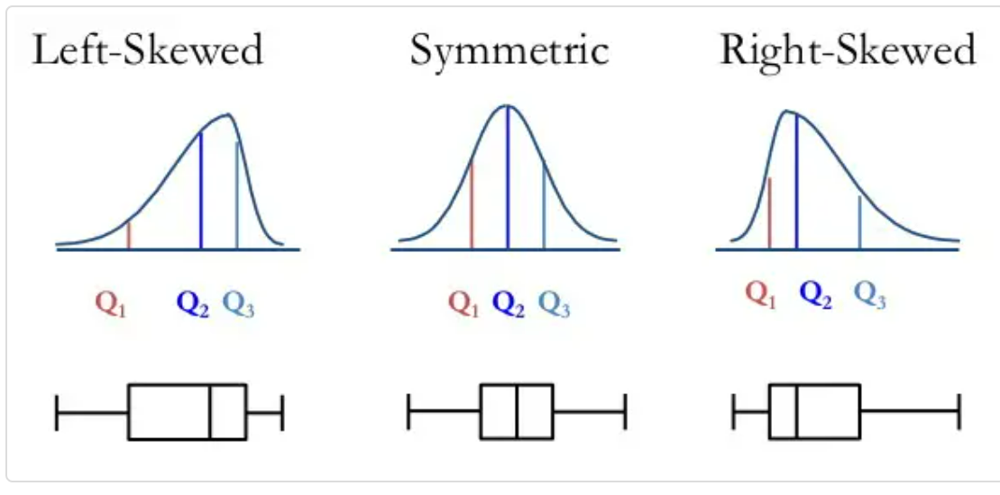

Box plots visually show the distribution of numerical data and skewness through displaying the data quartiles (or percentiles) and averages.

1. When the median is closer to the bottom of the box, and if the whisker is shorter on the lower end of the box, then the distribution is positively skewed (skewed right).

2. When the median is closer to the top of the box, and if the whisker is shorter on the upper end of the box, then the distribution is negatively skewed (skewed left).

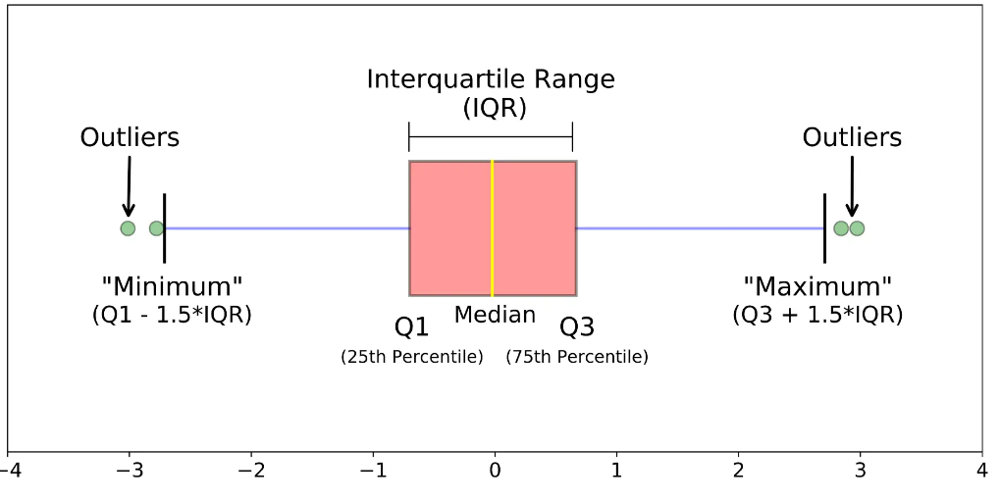

1. If the skewness is between -0.5 and 0.5, the data is fairly symmetrical. If the skewness is between -1 and – 0.5 or between 0.5 and 1, the data are moderately skewed. If the skewness is less than -1 or greater than 1, the data are highly skewed.

2. When the value of the skewness is negative, the tail of the distribution is longer towards the left hand side of the curve. and vice-versa

### Univariate/Bivariate distributions

In [50]:
def plot_comparison(data, col, title):
    fig, ax = plt.subplots(3, 1, sharex=True, figsize=[18,18])
    sns.histplot(data=train_df, x=col, kde=True, ax=ax[0], color = 'cornflowerblue')
    ax[0].set_title('Histogram + KDE')
    sns.boxenplot(x=col, ax=ax[1], color = 'cornflowerblue')
    ax[1].set_title('Boxplot')
    sns.violinplot(x=col, saturation=1, ax=ax[2], color = 'cornflowerblue', bw=.15, cut=0)
    ax[2].set_title('Violin plot')
    fig.suptitle(title, fontsize=16)
    plt.show()

Income
Skew : -0.02
no.of zeros : 0
% of zeros : 0.0
no.of nulls : 0
% of nulls : 0.0


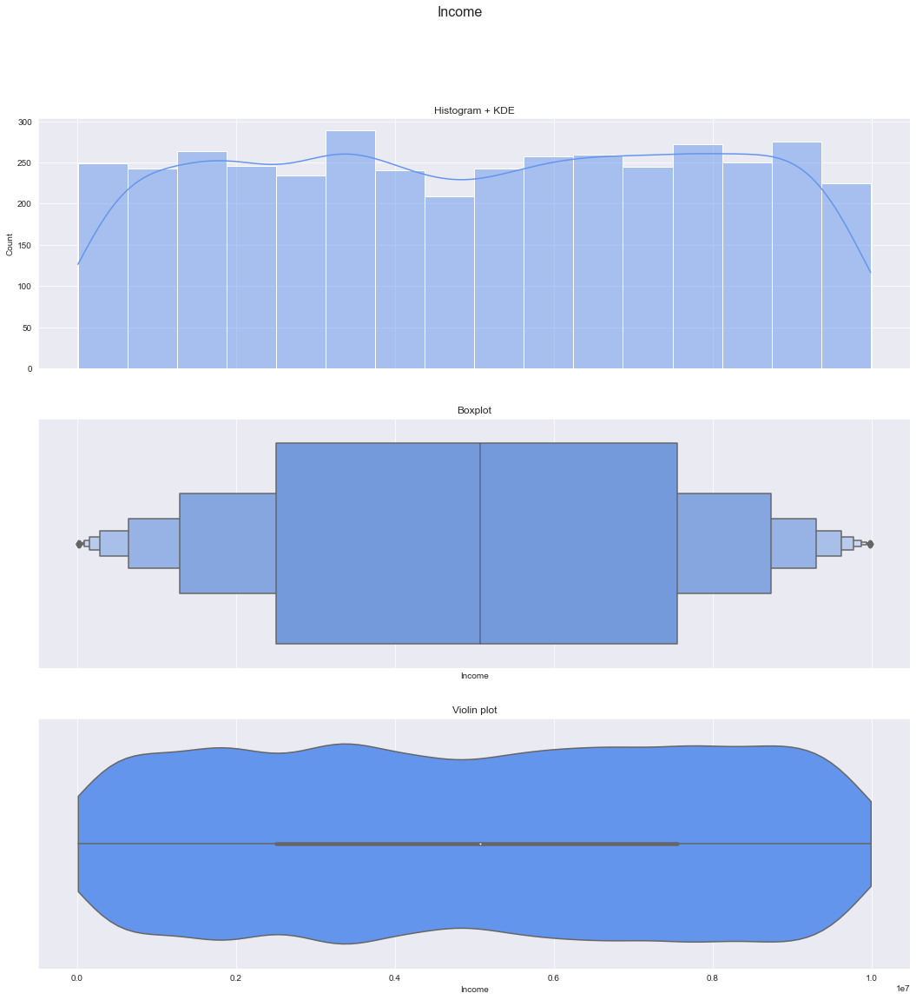

Age
Skew : 0.03
no.of zeros : 0
% of zeros : 0.0
no.of nulls : 0
% of nulls : 0.0


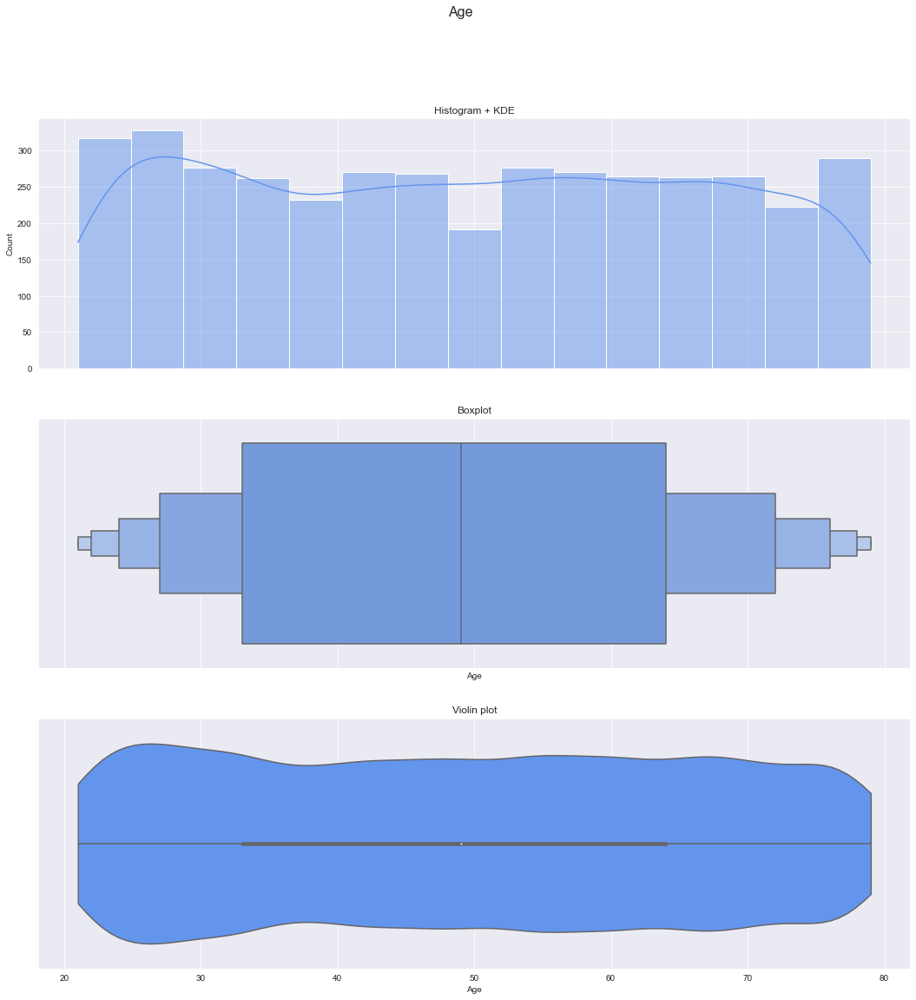

In [51]:
for col in continuous_features:
    print(col)
    print('Skew :', round(train_df[col].skew(), 2))
    print('no.of zeros :',(train_df[col]==0).sum())
    print('% of zeros :',np.round_((train_df[col]==0).sum()/len(train_df)*100,decimals=2))
    print('no.of nulls :',train_df[col].isna().sum())
    print('% of nulls :',np.round_(train_df[col].isna().sum()/len(train_df)*100,decimals=2))
    plot_comparison(train_df, train_df[col], col)

Income
no.of nulls : 0
% of nulls : 0.0
Skew : -0.02


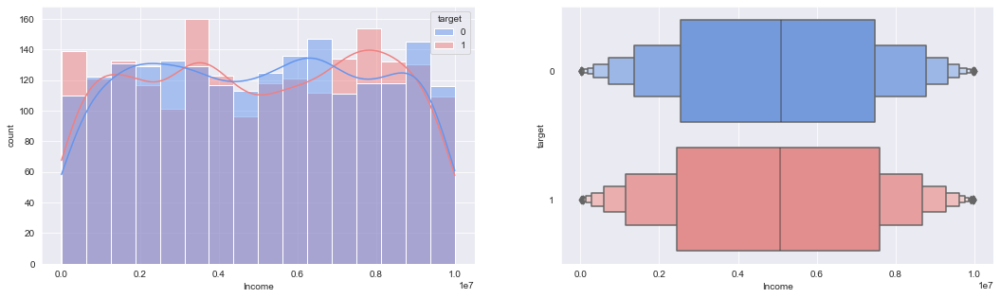

Age
no.of nulls : 0
% of nulls : 0.0
Skew : 0.03


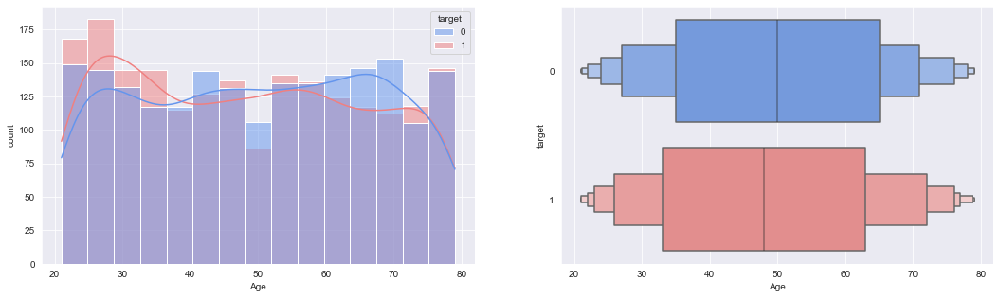

In [52]:
for col in continuous_features:
    print(col)
    print('no.of nulls :',train_df[col].isna().sum())
    print('% of nulls :',np.round_(train_df[col].isna().sum()/len(train_df)*100,decimals=2))
    print('Skew :', round(train_df[col].skew(), 2))
    plt.figure(figsize = (18,5))
    plt.subplot(1, 2, 1)
    sns.histplot(data=train_df, x=col, kde=True,hue='target',palette=['cornflowerblue','lightcoral'])
    plt.xlabel(col)
    plt.ylabel('count')
    plt.subplot(1, 2, 2)
    sns.boxenplot(data=train_df, x=col, y='target', order=[0,1],orient='h',palette=['cornflowerblue','lightcoral'])
    plt.show()

Income
Skew : -0.02


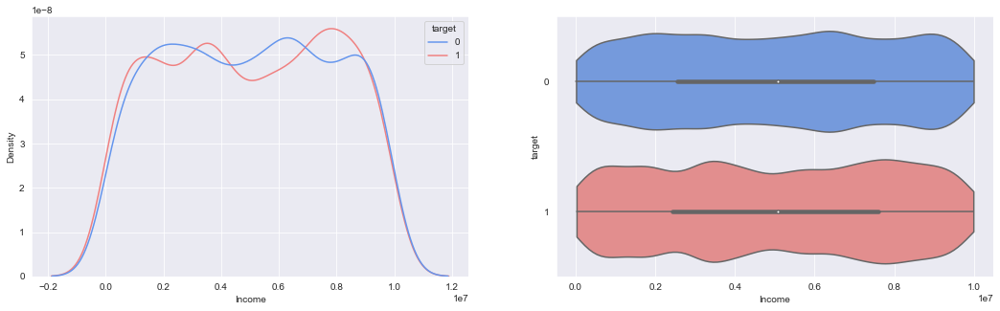

Age
Skew : 0.03


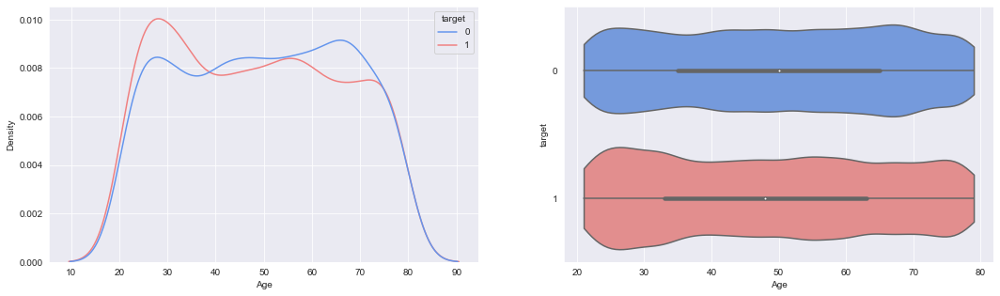

In [53]:
for col in continuous_features:
    print(col)
    print('Skew :', round(train_df[col].skew(), 2))
    plt.figure(figsize = (18,5))
    plt.subplot(1, 2, 1)
    sns.kdeplot(data=train_df, x=col,hue='target',palette=['cornflowerblue','lightcoral'])
    plt.xlabel(col)
    plt.ylabel('Density')
    plt.subplot(1, 2, 2)
    #sns.violinplot(x=train_df[col],saturation=1)
    sns.violinplot(data=train_df, x=col, y='target', order=[0,1],orient='h',palette=['cornflowerblue','lightcoral'], bw=.15,cut=0)
    plt.show()

#### If you want to check whether feature is guassian or normal distributed
#### Q-Q plot

In [54]:
import scipy.stats as stat
import pylab 

Income
Skew : -0.02
0.0


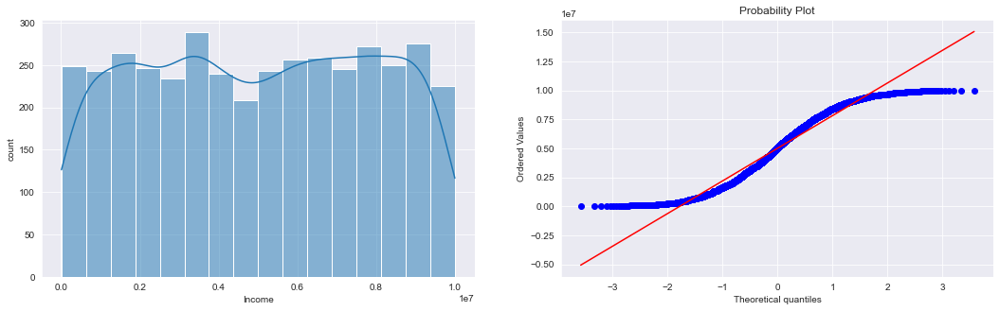

Age
Skew : 0.03
0.0


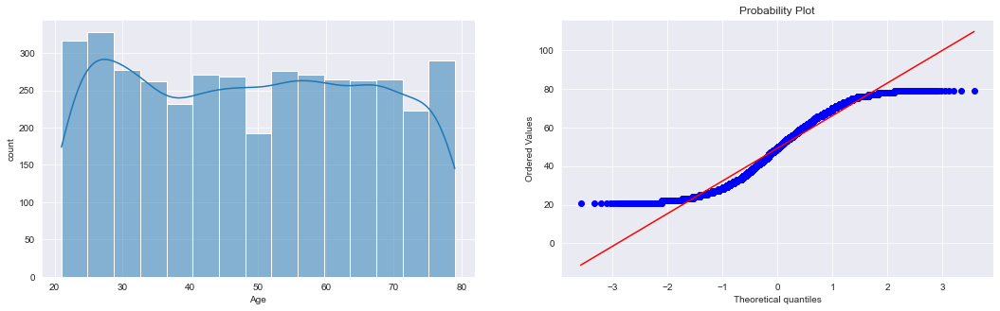

In [55]:
for col in continuous_features:
    print(col)
    print('Skew :', round(train_df[col].skew(), 2))
    _, p = stat.normaltest(train_df[col].to_numpy())
    print(p)
    plt.figure(figsize = (18,5))
    plt.subplot(1, 2, 1)
    sns.histplot(data=train_df, x=col, kde=True)
    plt.xlabel(col)
    plt.ylabel('count')
    plt.subplot(1, 2, 2)
    stat.probplot(train_df[col],dist='norm',plot=pylab)
    plt.show()

### Observations :

1. we can clearly see that both 'Income' and 'Age' are uniformly distributed 
2. there is no clear data dist. distinction w.r.t target varaibles with 'Income' and 'Age'

In [56]:
train_df.columns

Index(['Income', 'Age', 'Experience', 'Married/Single', 'House_Ownership',
       'Car_Ownership', 'Profession', 'CITY', 'STATE', 'CURRENT_JOB_YRS',
       'CURRENT_HOUSE_YRS', 'target'],
      dtype='object')

### Visualizing bivariate/multivariate distributions

Text(0, 0.5, 'No.of Heart Disease people')

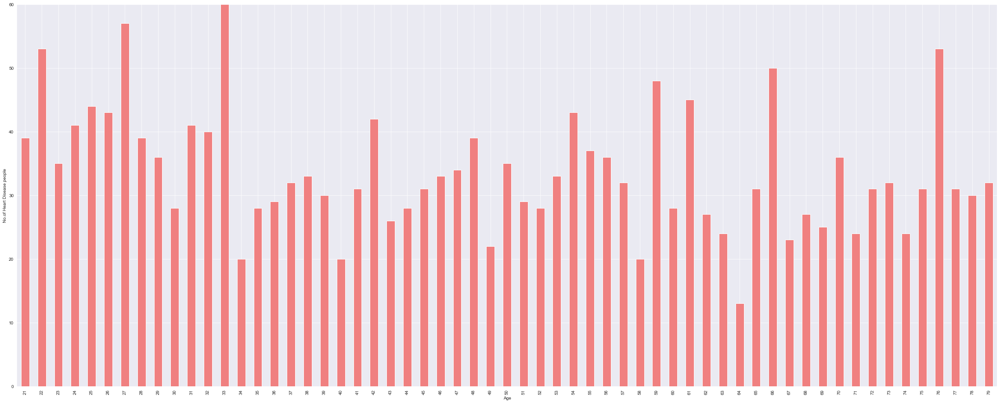

In [57]:
plt.figure(figsize = (40,16))
train_df.loc[train_df['target']==1]['Age'].value_counts().sort_index().plot.bar(color = 'lightcoral')

plt.ylim(0, 60)

plt.xlabel('Age')
plt.ylabel('No.of Heart Disease people')

# Double click on the plot/graph to zoom in/zoom out

Text(0, 0.5, 'No.of Healthy people')

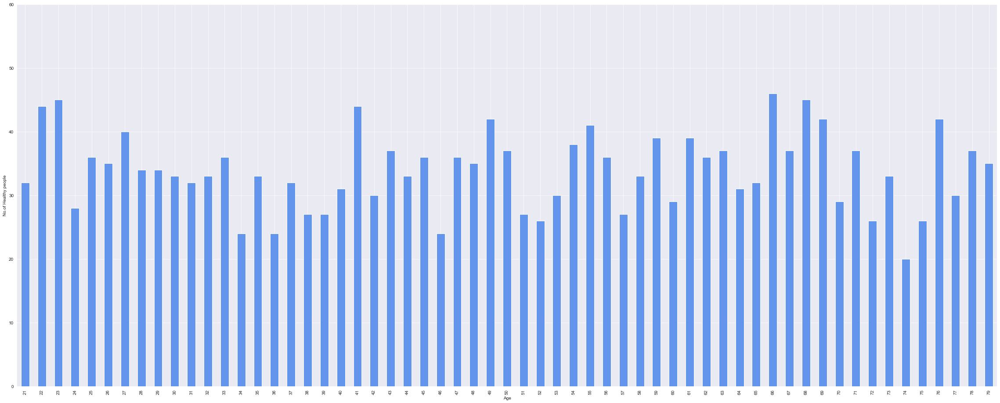

In [58]:
plt.figure(figsize = (40,16))
train_df.loc[train_df['target']==0]['Age'].value_counts().sort_index().plot.bar(color = 'cornflowerblue')

plt.ylim(0, 60)

plt.xlabel('Age')
plt.ylabel('No.of Healthy people')

# Double click on the plot/graph to zoom in

In [59]:
# From above we cannot clearly find any patterns with Age vs Outcome 
# but one thing is clear that there are less old (above age 50) Diabetic people compared to young (below age 50) Diabetic people
# And people between 20-28 are less prone to Diabetic

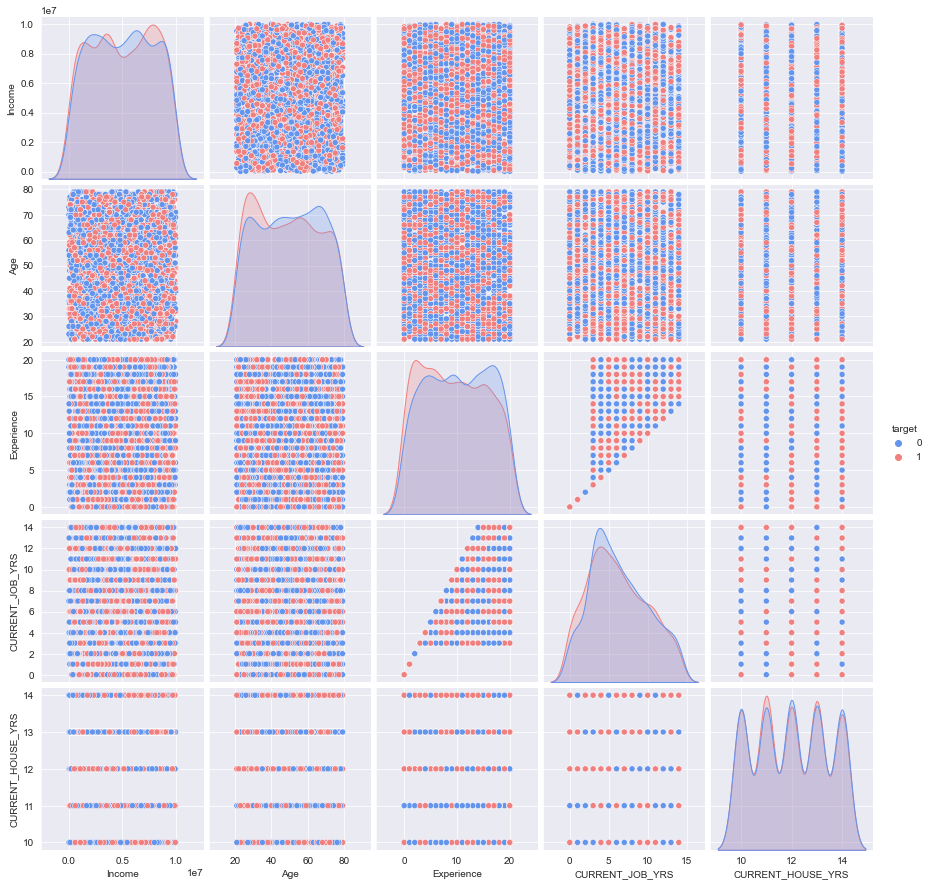

In [60]:
sns.pairplot(train_df, hue='target',palette=['cornflowerblue','lightcoral'])

# Its not clear to observe graphs closely we will plot indvidual plots for some features

Income


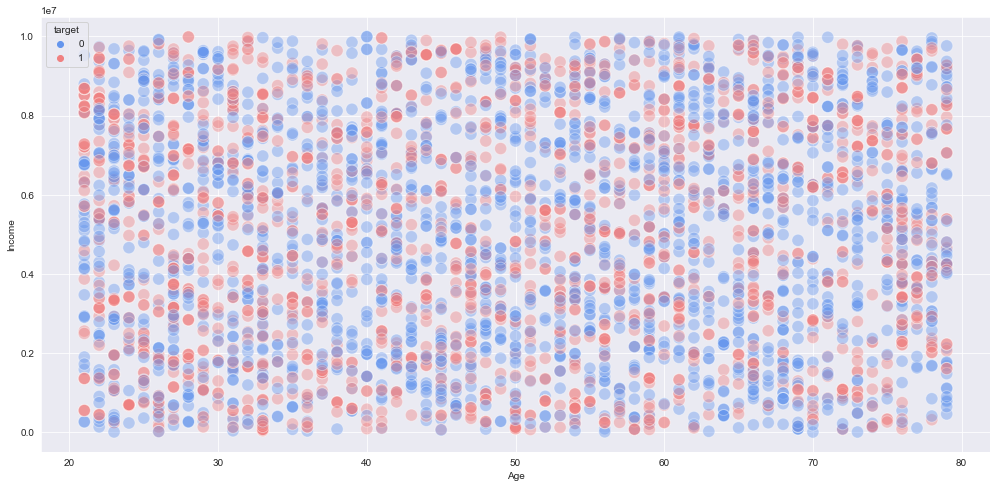

Age


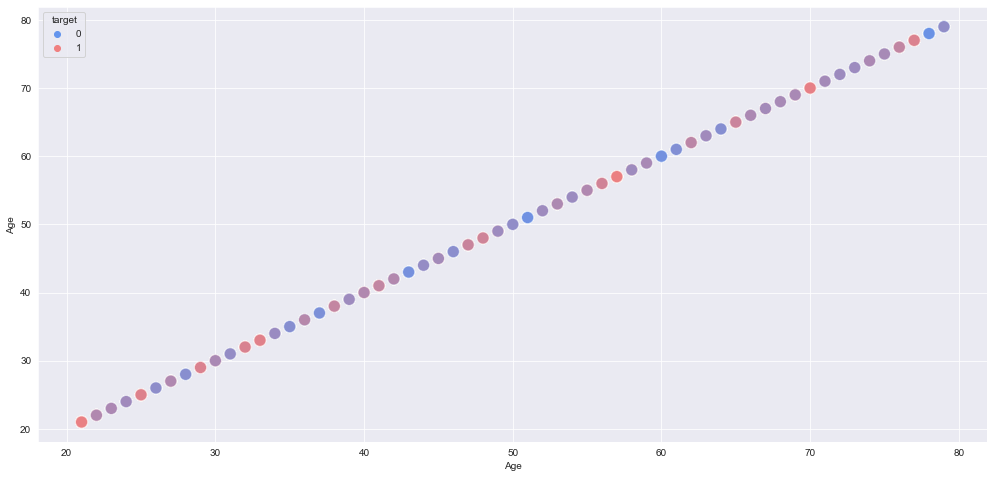

In [61]:
for col in continuous_features:
    print(col)
    plt.figure(figsize = (17,8))
    sns.scatterplot(data=train_df, x='Age',y=col,hue='target',palette=['cornflowerblue','lightcoral'],alpha=0.4,s=150)
    plt.xlabel('Age')
    plt.ylabel(col)
    plt.show()

Income


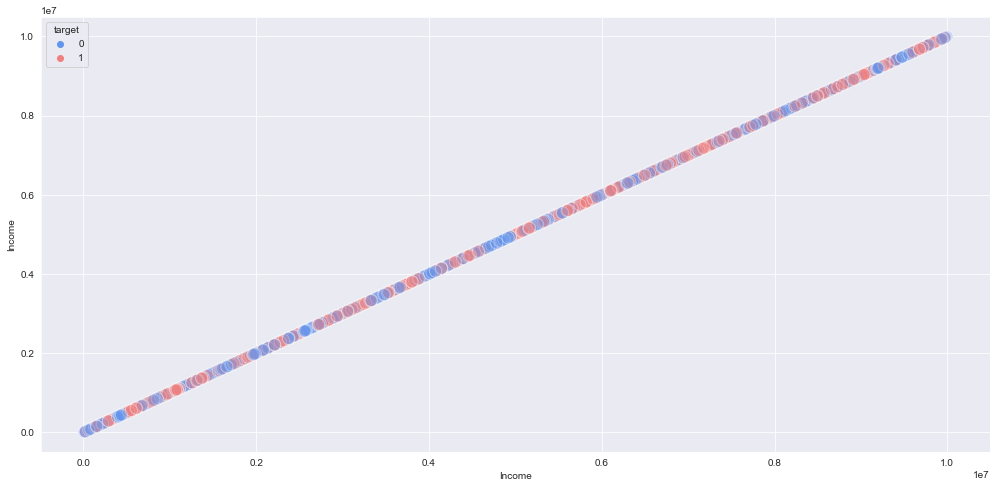

Age


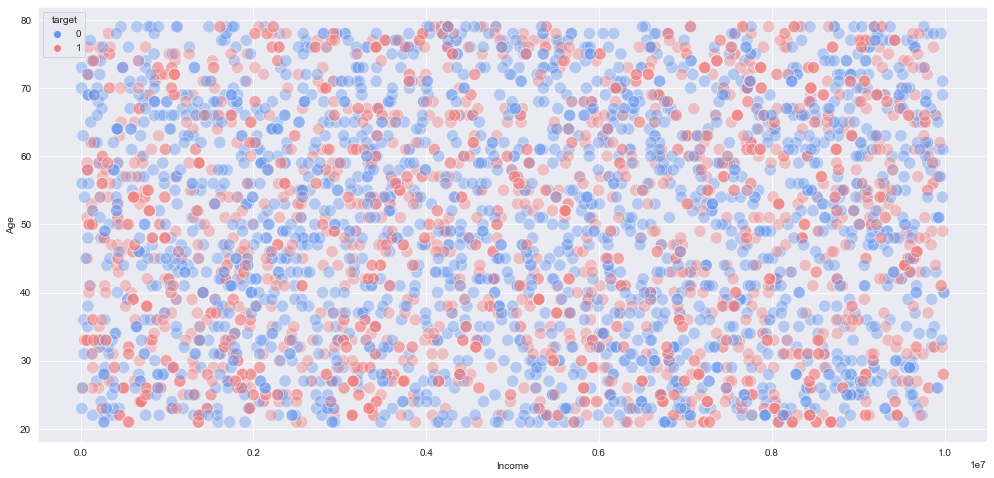

In [62]:
for col in continuous_features:
    print(col)
    plt.figure(figsize = (17,8))
    sns.scatterplot(data=train_df, x='Income',y=col,hue='target',palette=['cornflowerblue','lightcoral'],alpha=0.4,s=150)
    plt.xlabel('Income')
    plt.ylabel(col)
    plt.show()

### Observations :

1. From above scatter plots there is nothing clear about the target category distinction

In [63]:
train_df.columns

Index(['Income', 'Age', 'Experience', 'Married/Single', 'House_Ownership',
       'Car_Ownership', 'Profession', 'CITY', 'STATE', 'CURRENT_JOB_YRS',
       'CURRENT_HOUSE_YRS', 'target'],
      dtype='object')

In [64]:
fig = px.scatter_3d(train_df.sample(1000,random_state=5), x="Age", y="Income", z="Experience", color="target")
fig.show()

### Discrete_features

### Univariate/Bivariate analysis

In [65]:
train_df[discrete_features].nunique().sort_values(ascending=False)

Experience           21
CURRENT_JOB_YRS      15
CURRENT_HOUSE_YRS     5
target                2
dtype: int64

In [66]:
discrete_features

['Experience', 'CURRENT_JOB_YRS', 'CURRENT_HOUSE_YRS', 'target']

In [67]:
discrete_features = ['Experience', 'CURRENT_JOB_YRS', 'CURRENT_HOUSE_YRS']

discrete_features

['Experience', 'CURRENT_JOB_YRS', 'CURRENT_HOUSE_YRS']

Experience


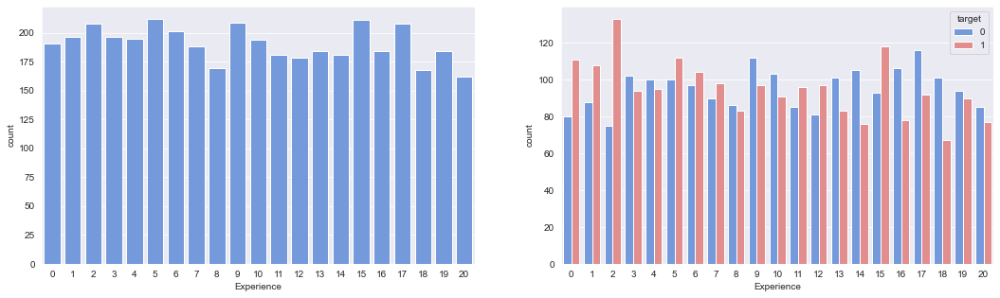

CURRENT_JOB_YRS


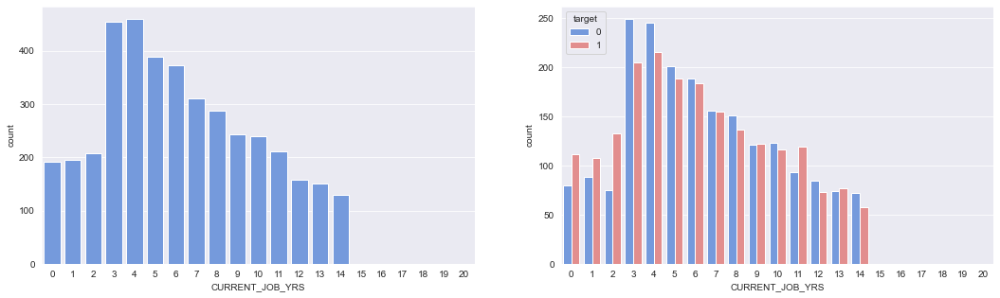

CURRENT_HOUSE_YRS


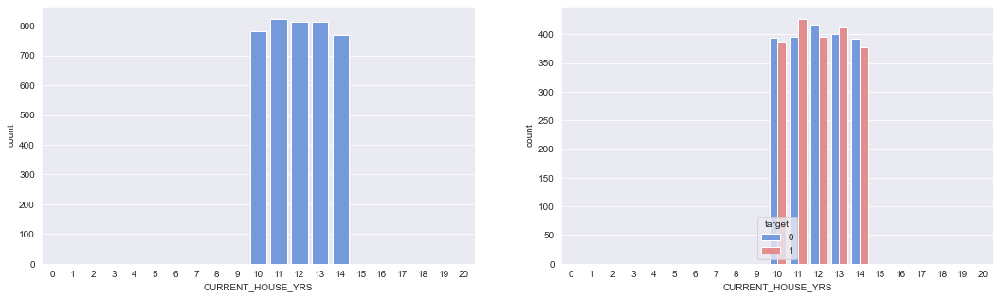

In [68]:
for col in discrete_features:
    print(col)
    plt.figure(figsize = (18,5))
    plt.subplot(1, 2, 1)
    sns.countplot(data=train_df, x=col,color='cornflowerblue',order=train_df['Experience'].value_counts().sort_index().index)
    plt.xlabel(col)
    plt.ylabel('count')
    plt.subplot(1, 2, 2)
    sns.countplot(data=train_df, x=col, hue="target",palette=['cornflowerblue','lightcoral'],order=train_df['Experience'].value_counts().sort_index().index)
    plt.show()

Experience


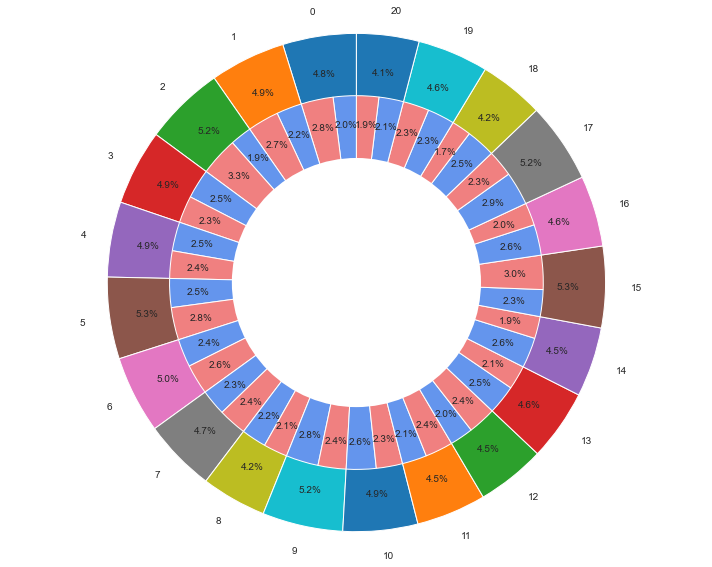

In [69]:
print('Experience')
labels = train_df['Experience'].value_counts().sort_index().index
sizes = train_df['Experience'].value_counts().sort_index().values
labels_gender = [0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1]
sizes_gender = train_df.groupby(['Experience','target'])['target'].count().values
#colors = ['slategrey', '#ffcc99']
colors_gender = ['cornflowerblue','lightcoral','cornflowerblue','lightcoral','cornflowerblue','lightcoral','cornflowerblue',
                 'lightcoral','cornflowerblue','lightcoral','cornflowerblue','lightcoral','cornflowerblue','lightcoral','cornflowerblue','lightcoral','cornflowerblue','lightcoral','cornflowerblue',
                 'lightcoral','cornflowerblue','lightcoral','cornflowerblue','lightcoral','cornflowerblue','lightcoral','cornflowerblue','lightcoral','cornflowerblue','lightcoral','cornflowerblue',
                 'lightcoral','cornflowerblue','lightcoral','cornflowerblue','lightcoral','cornflowerblue','lightcoral','cornflowerblue','lightcoral','cornflowerblue','lightcoral']
 
# Plot
plt.figure(figsize = (10,8))
plt.pie(sizes, labels=labels, startangle=90,frame=True,autopct='%1.1f%%', pctdistance=0.85)
plt.pie(sizes_gender,colors=colors_gender,radius=0.75,startangle=90,autopct='%1.1f%%', pctdistance=0.85)
centre_circle = plt.Circle((0,0),0.5,color='black', fc='white',linewidth=0)
fig = plt.gcf()
fig.gca().add_artist(centre_circle)
 
plt.axis('equal')
plt.tight_layout()
plt.show()

CURRENT_JOB_YRS


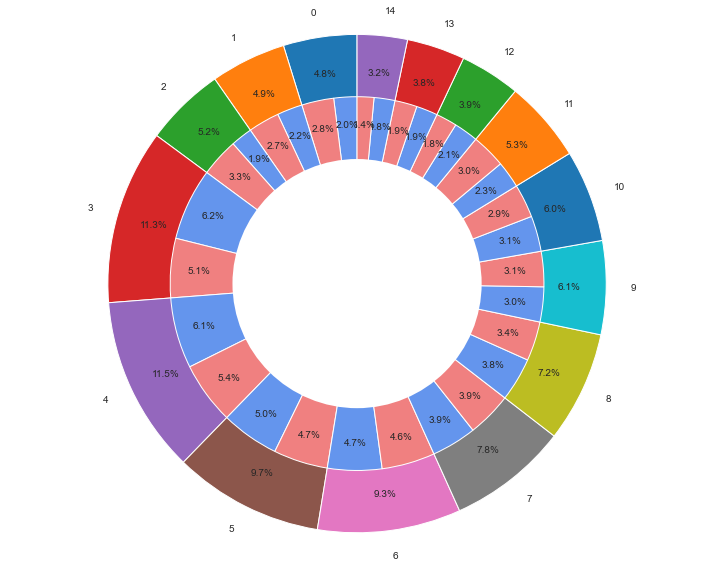

In [70]:
print('CURRENT_JOB_YRS')
labels = train_df['CURRENT_JOB_YRS'].value_counts().sort_index().index
sizes = train_df['CURRENT_JOB_YRS'].value_counts().sort_index().values
#labels_gender = [0,1,0,1,0,1,0,1]
sizes_gender = train_df.groupby(['CURRENT_JOB_YRS','target'])['target'].count().values
#colors = ['slategrey', '#ffcc99']
colors_gender = ['cornflowerblue','lightcoral','cornflowerblue','lightcoral','cornflowerblue','lightcoral','cornflowerblue',
                 'lightcoral','cornflowerblue','lightcoral','cornflowerblue','lightcoral','cornflowerblue','lightcoral','cornflowerblue','lightcoral','cornflowerblue','lightcoral','cornflowerblue',
                 'lightcoral','cornflowerblue','lightcoral','cornflowerblue','lightcoral','cornflowerblue','lightcoral','cornflowerblue','lightcoral','cornflowerblue','lightcoral']
 
# Plot
plt.figure(figsize = (10,8))
plt.pie(sizes, labels=labels, startangle=90,frame=True,autopct='%1.1f%%', pctdistance=0.85)
plt.pie(sizes_gender,colors=colors_gender,radius=0.75,startangle=90,autopct='%1.1f%%', pctdistance=0.85)
centre_circle = plt.Circle((0,0),0.5,color='black', fc='white',linewidth=0)
fig = plt.gcf()
fig.gca().add_artist(centre_circle)
 
plt.axis('equal')
plt.tight_layout()
plt.show()

CURRENT_HOUSE_YRS


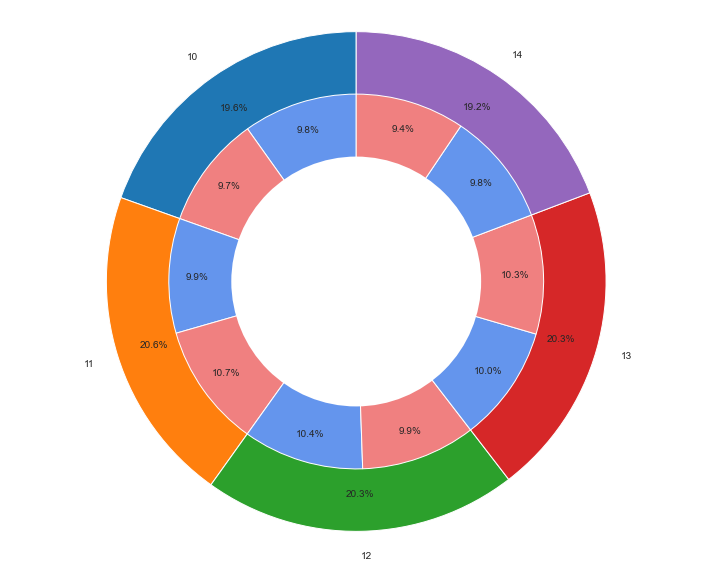

In [71]:
print('CURRENT_HOUSE_YRS')
labels = train_df['CURRENT_HOUSE_YRS'].value_counts().sort_index().index
sizes = train_df['CURRENT_HOUSE_YRS'].value_counts().sort_index().values
#labels_gender = [0,1,0,1]
sizes_gender = train_df.groupby(['CURRENT_HOUSE_YRS','target'])['target'].count().values
#colors = ['slategrey', '#ffcc99']
colors_gender = ['cornflowerblue','lightcoral','cornflowerblue','lightcoral','cornflowerblue','lightcoral','cornflowerblue',
                 'lightcoral','cornflowerblue','lightcoral']
 
# Plot
plt.figure(figsize = (10,8))
plt.pie(sizes, labels=labels, startangle=90,frame=True,autopct='%1.1f%%', pctdistance=0.85)
plt.pie(sizes_gender,colors=colors_gender,radius=0.75,startangle=90,autopct='%1.1f%%', pctdistance=0.85)
centre_circle = plt.Circle((0,0),0.5,color='black', fc='white',linewidth=0)
fig = plt.gcf()
fig.gca().add_artist(centre_circle)
 
plt.axis('equal')
plt.tight_layout()
plt.show()

In [72]:
continuous_features

['Income', 'Age']

In [73]:
discrete_features

['Experience', 'CURRENT_JOB_YRS', 'CURRENT_HOUSE_YRS']

In [74]:
from num2words import num2words

In [75]:
data = train_df.copy()

In [76]:
data

,Income,Age,Experience,Married/Single,House_Ownership,Car_Ownership,Profession,CITY,STATE,CURRENT_JOB_YRS,CURRENT_HOUSE_YRS,target
0,7848654,55,9,single,rented,no,Software_Developer,Patna,Bihar,9,13,0
1,5548741,73,18,single,rented,no,Industrial_Engineer,Bettiah[33],Bihar,4,13,1
2,7727737,41,11,single,rented,no,Civil_servant,Giridih,Jharkhand,3,11,0
3,7428533,59,1,single,rented,no,Firefighter,Agartala,Tripura,1,12,1
4,1768758,70,18,single,rented,yes,Analyst,Mehsana,Gujarat,11,14,0
...,...,...,...,...,...,...,...,...,...,...,...,...
3995,2936274,49,4,single,rented,no,Design_Engineer,Pondicherry,Puducherry,4,10,1
3996,6744134,56,13,single,rented,yes,Police_officer,Unnao,Uttar_Pradesh,8,14,1
3997,8236972,21,7,single,rented,no,Designer,Munger,Bihar,4,13,1
3998,1067890,41,14,single,rented,yes,Air_traffic_controller,Sambalpur,Odisha,3,12,1


In [77]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4000 entries, 0 to 3999
Data columns (total 12 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   Income             4000 non-null   int64 
 1   Age                4000 non-null   int64 
 2   Experience         4000 non-null   int64 
 3   Married/Single     4000 non-null   object
 4   House_Ownership    4000 non-null   object
 5   Car_Ownership      4000 non-null   object
 6   Profession         4000 non-null   object
 7   CITY               4000 non-null   object
 8   STATE              4000 non-null   object
 9   CURRENT_JOB_YRS    4000 non-null   int64 
 10  CURRENT_HOUSE_YRS  4000 non-null   int64 
 11  target             4000 non-null   int64 
dtypes: int64(6), object(6)
memory usage: 375.1+ KB


In [78]:
for col in discrete_features:
    data[col] = data[col].apply(lambda x: num2words(x))

In [79]:
data

,Income,Age,Experience,Married/Single,House_Ownership,Car_Ownership,Profession,CITY,STATE,CURRENT_JOB_YRS,CURRENT_HOUSE_YRS,target
0,7848654,55,nine,single,rented,no,Software_Developer,Patna,Bihar,nine,thirteen,0
1,5548741,73,eighteen,single,rented,no,Industrial_Engineer,Bettiah[33],Bihar,four,thirteen,1
2,7727737,41,eleven,single,rented,no,Civil_servant,Giridih,Jharkhand,three,eleven,0
3,7428533,59,one,single,rented,no,Firefighter,Agartala,Tripura,one,twelve,1
4,1768758,70,eighteen,single,rented,yes,Analyst,Mehsana,Gujarat,eleven,fourteen,0
...,...,...,...,...,...,...,...,...,...,...,...,...
3995,2936274,49,four,single,rented,no,Design_Engineer,Pondicherry,Puducherry,four,ten,1
3996,6744134,56,thirteen,single,rented,yes,Police_officer,Unnao,Uttar_Pradesh,eight,fourteen,1
3997,8236972,21,seven,single,rented,no,Designer,Munger,Bihar,four,thirteen,1
3998,1067890,41,fourteen,single,rented,yes,Air_traffic_controller,Sambalpur,Odisha,three,twelve,1


In [80]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4000 entries, 0 to 3999
Data columns (total 12 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   Income             4000 non-null   int64 
 1   Age                4000 non-null   int64 
 2   Experience         4000 non-null   object
 3   Married/Single     4000 non-null   object
 4   House_Ownership    4000 non-null   object
 5   Car_Ownership      4000 non-null   object
 6   Profession         4000 non-null   object
 7   CITY               4000 non-null   object
 8   STATE              4000 non-null   object
 9   CURRENT_JOB_YRS    4000 non-null   object
 10  CURRENT_HOUSE_YRS  4000 non-null   object
 11  target             4000 non-null   int64 
dtypes: int64(3), object(9)
memory usage: 375.1+ KB


In [81]:
discrete_features

['Experience', 'CURRENT_JOB_YRS', 'CURRENT_HOUSE_YRS']

In [82]:
train_df[discrete_features].nunique()

Experience           21
CURRENT_JOB_YRS      15
CURRENT_HOUSE_YRS     5
dtype: int64

In [83]:
data['CURRENT_HOUSE_YRS'].unique()

array(['thirteen', 'eleven', 'twelve', 'fourteen', 'ten'], dtype=object)

Income


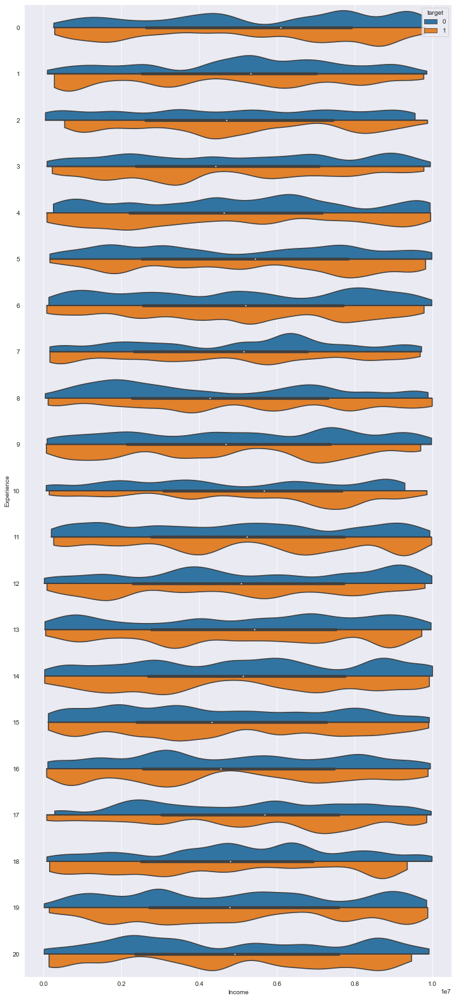

Age


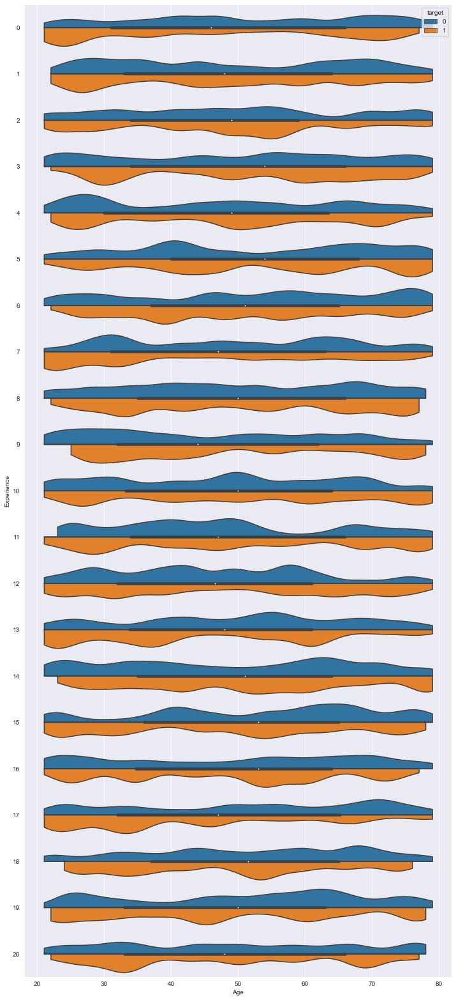

In [84]:
for col in continuous_features:
    print(col)
    plt.figure(figsize = (12,28))
    sns.violinplot(data=train_df, x=col, y="Experience", hue="target", split=True,orient='h', bw=.15,cut=0)
    plt.xlabel(col)
    plt.ylabel('Experience')
    plt.show()

Income


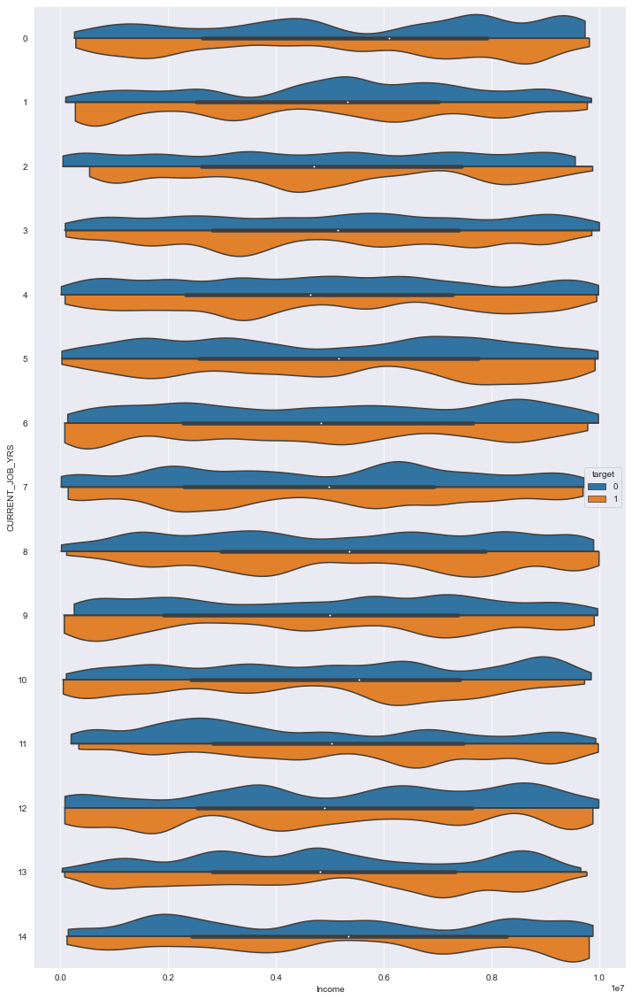

Age


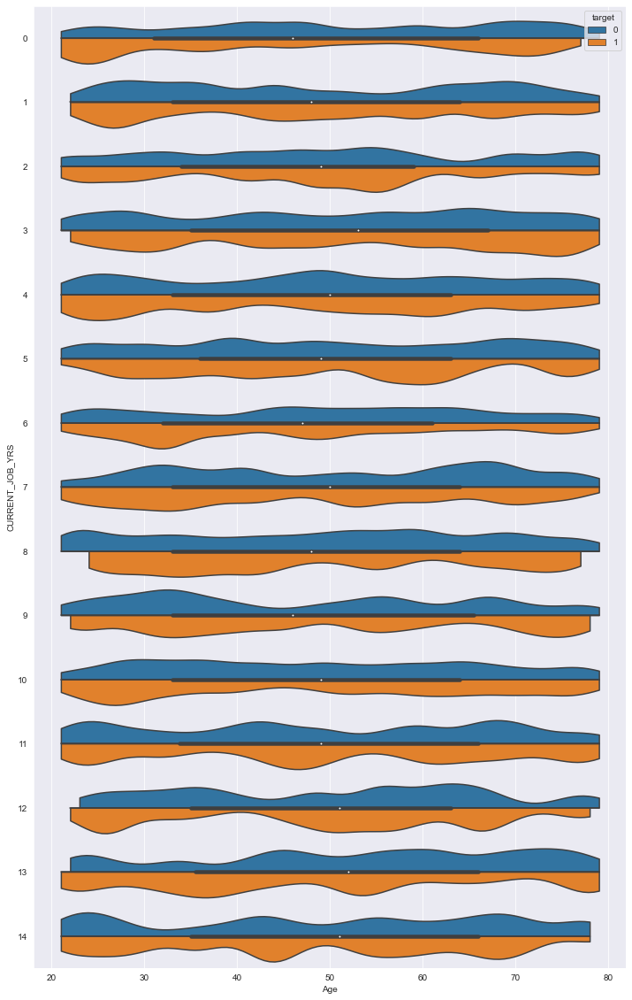

In [85]:
for col in continuous_features:
    print(col)
    plt.figure(figsize = (12,20))
    sns.violinplot(data=train_df, x=col, y="CURRENT_JOB_YRS", hue="target", split=True,orient='h',bw=.15,cut=0)
    plt.xlabel(col)
    plt.ylabel('CURRENT_JOB_YRS')
    plt.show()

Income


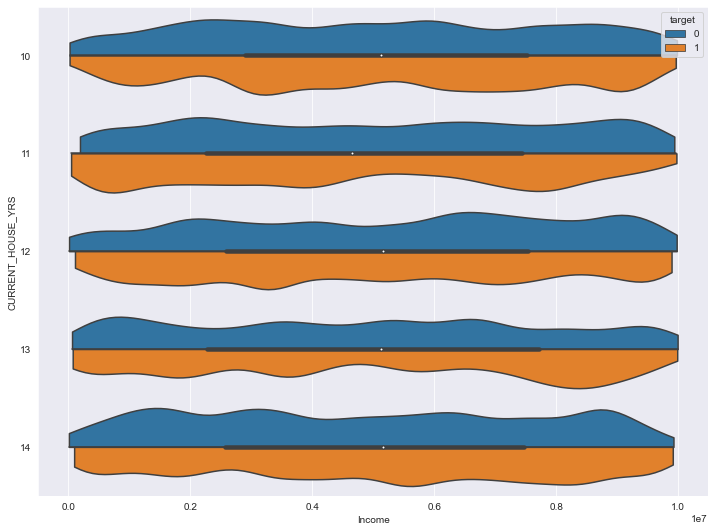

Age


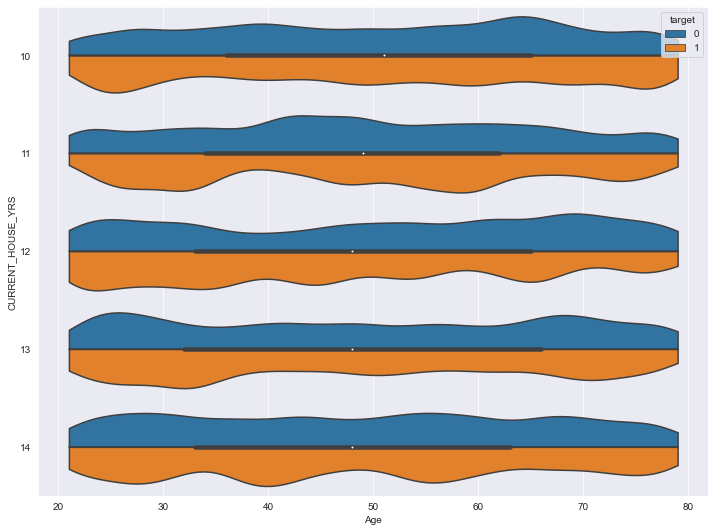

In [86]:
for col in continuous_features:
    print(col)
    plt.figure(figsize = (12,9))
    sns.violinplot(data=train_df, x=col, y="CURRENT_HOUSE_YRS", hue="target", split=True,orient='h', bw=.15,cut=0)
    plt.xlabel(col)
    plt.ylabel('CURRENT_HOUSE_YRS')
    plt.show()

In [87]:
numerical_features

Index(['Income', 'Age', 'Experience', 'CURRENT_JOB_YRS', 'CURRENT_HOUSE_YRS',
       'target'],
      dtype='object')

In [88]:
categorical_features

Index(['Married/Single', 'House_Ownership', 'Car_Ownership', 'Profession',
       'CITY', 'STATE'],
      dtype='object')

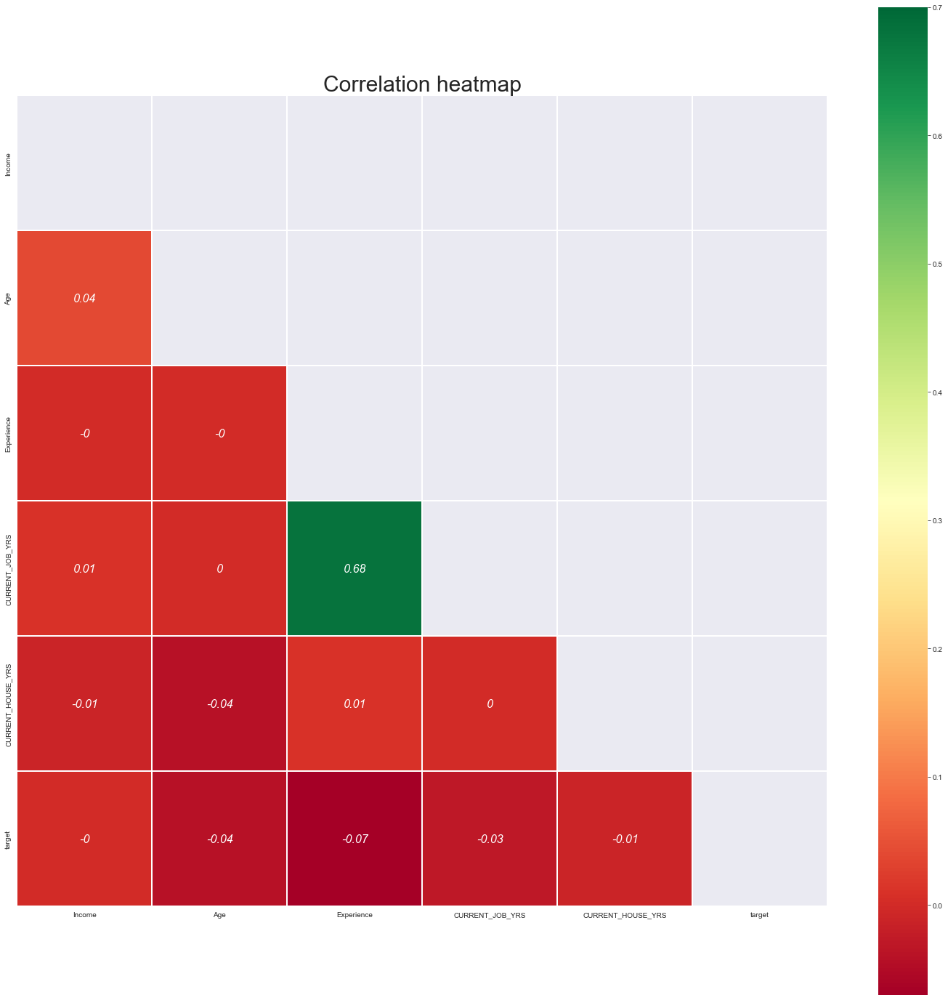

In [89]:
# Finds correlation between Independent and dependent attributes

mask = np.zeros_like(train_df[numerical_features].corr(),dtype = np.bool_)
mask[np.triu_indices_from(mask)] = True

f, ax = plt.subplots(figsize = (25,25))
plt.title('Correlation heatmap', fontsize = 30)

sns.heatmap(np.round_(train_df[numerical_features].corr(),decimals=2),cmap='RdYlGn',linewidths=0.25,square=True,annot=True,
            vmax=0.7,linecolor='w',annot_kws={'size':16,'style':'oblique'},mask=mask)

plt.show()

### Observation :

1. We can see there is no positive correlation between 'target' and numerical features.

### Multicollinearity

2. there is clear positive correlation among ('Experience', 'CURRENT_JOB_YRS')

#### We need to be very careful with this Multicollinearity when using 'Linear ML Models'

## Categorical_features

### Univariate/Bivariate analysis

In [90]:
train_df[categorical_features].nunique().sort_values(ascending=False)

CITY               316
Profession          51
STATE               29
House_Ownership      3
Married/Single       2
Car_Ownership        2
dtype: int64

In [91]:
categorical_features = ['Profession', 'STATE', 'House_Ownership', 'Married/Single','Car_Ownership']

Profession


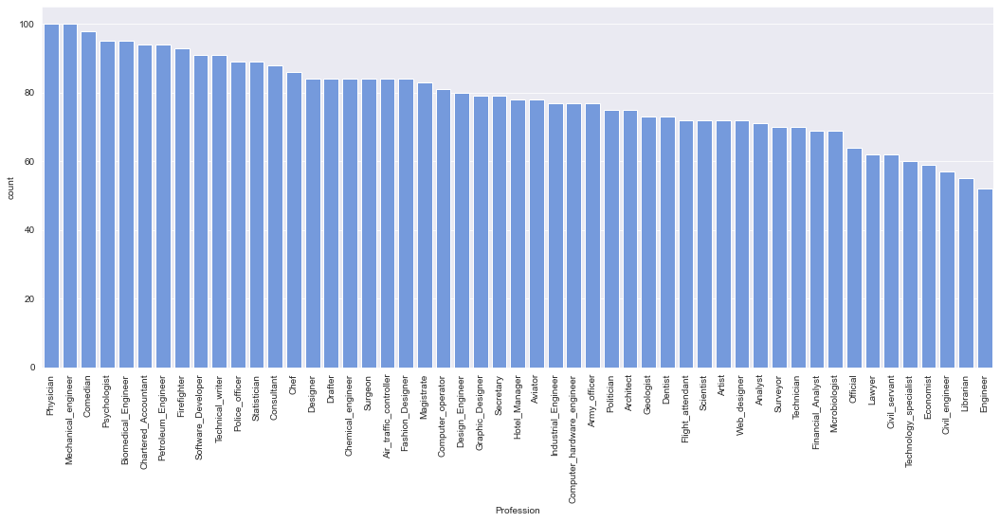

STATE


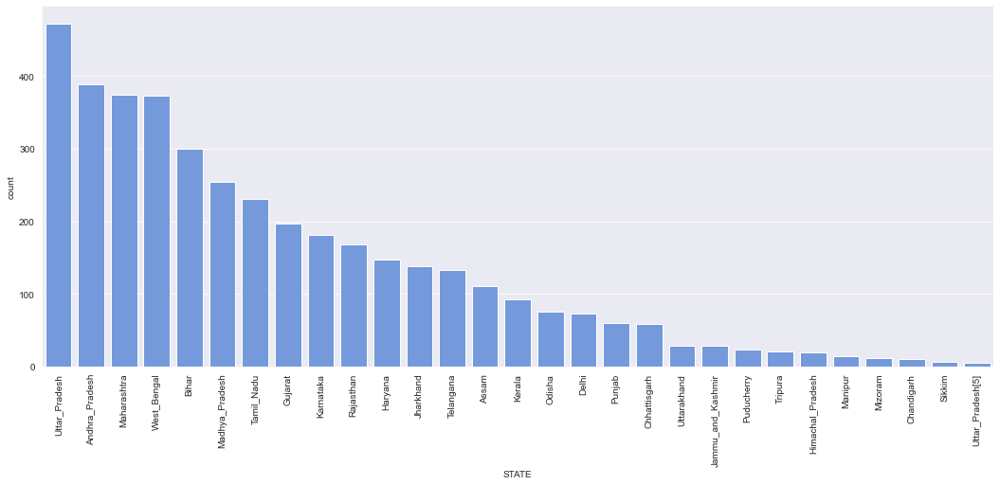

In [92]:
for col in ['Profession', 'STATE']:
    print(col)
    plt.figure(figsize = (18,7))
    sns.countplot(data=train_df, x=col,color='cornflowerblue',order=train_df[col].value_counts().index)
    plt.xlabel(col)
    plt.xticks(rotation=90)
    plt.ylabel('count')
    plt.show()

Profession


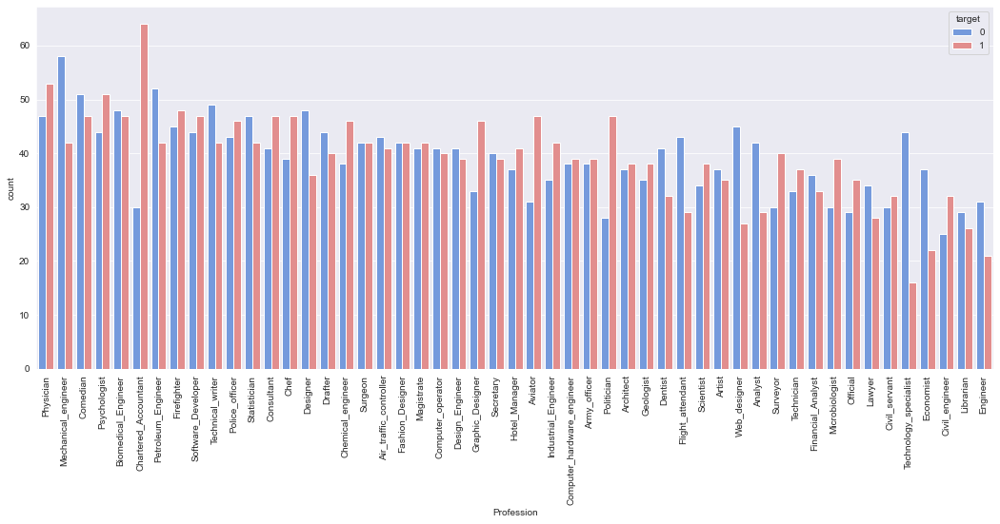

STATE


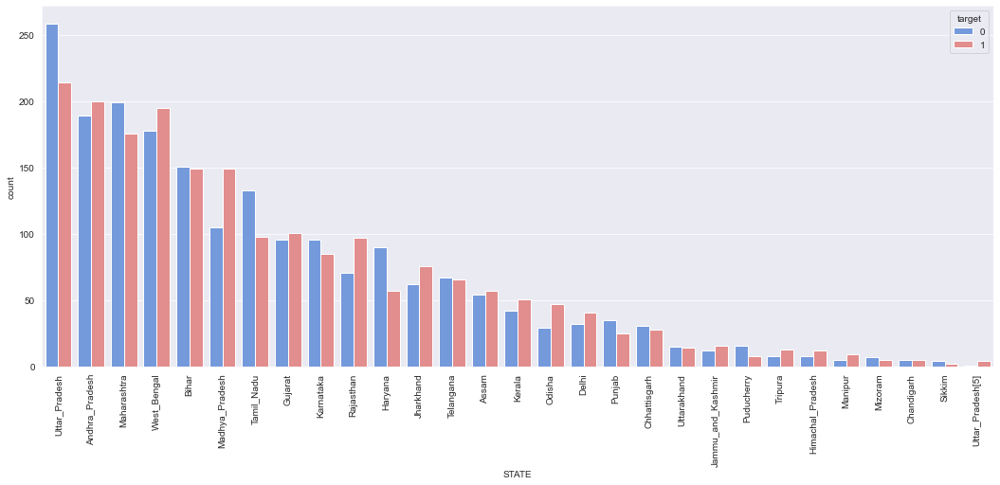

In [93]:
for col in ['Profession', 'STATE']:
    print(col)
    plt.figure(figsize = (18,7))
    sns.countplot(data=train_df, x=col, hue="target",palette=['cornflowerblue','lightcoral'],order=train_df[col].value_counts().index)
    plt.xlabel(col)
    plt.xticks(rotation=90)
    plt.ylabel('count')
    plt.show()

House_Ownership


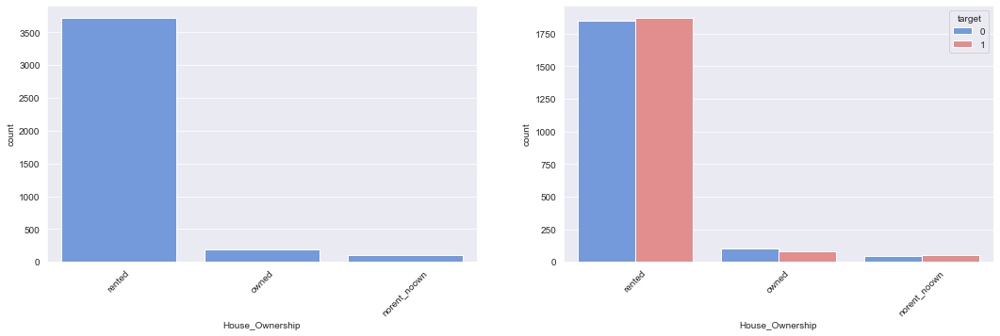

Married/Single


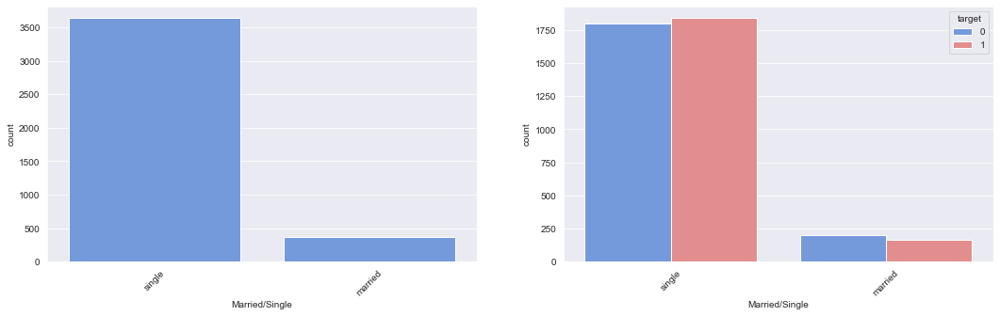

Car_Ownership


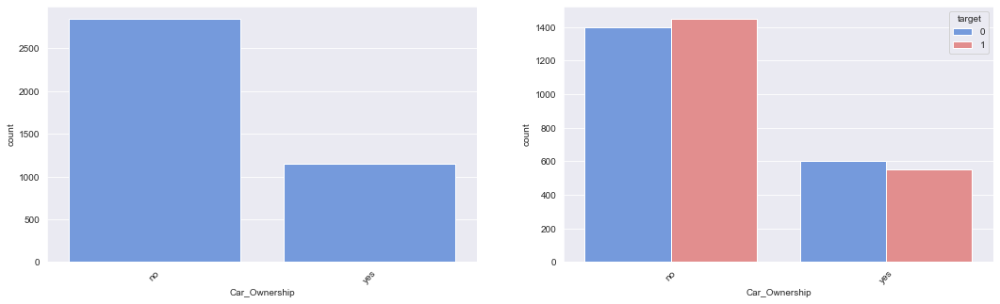

In [94]:
for col in ['House_Ownership', 'Married/Single','Car_Ownership']:
    print(col)
    plt.figure(figsize = (18,5))
    plt.subplot(1, 2, 1)
    sns.countplot(data=train_df, x=col,color='cornflowerblue',order=train_df[col].value_counts().index)
    plt.xlabel(col)
    plt.xticks(rotation=45)
    plt.ylabel('count')
    plt.subplot(1, 2, 2)
    sns.countplot(data=train_df, x=col, hue="target",palette=['cornflowerblue','lightcoral'],order=train_df[col].value_counts().index)
    plt.xticks(rotation=45)
    plt.show()

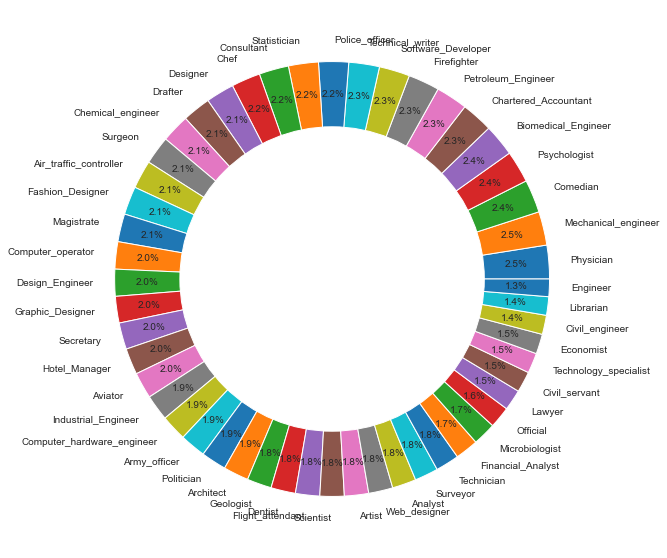

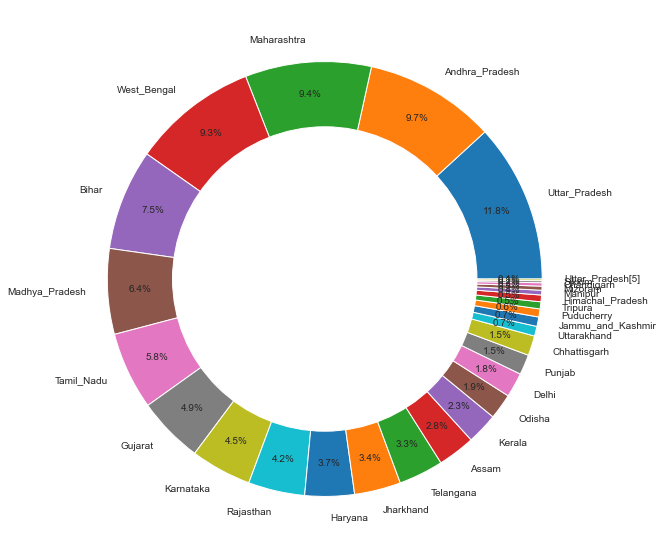

In [95]:
for col in ['Profession', 'STATE']:
    plt.figure(figsize = (18,10))
    
    plt.pie(train_df[col].value_counts().values, labels=train_df[col].value_counts().index,
        autopct='%1.1f%%', pctdistance=0.85)
    centre_circle = plt.Circle((0, 0), 0.70, fc='white')
    fig = plt.gcf()
    fig.gca().add_artist(centre_circle)
    plt.show()

In [96]:
def plot_categorical_features_2(train_df,col):
    plt.figure(figsize = (18,5))
    plt.subplot(1, 2, 1)
    
    plt.pie(train_df[col].value_counts().values, labels=train_df[col].value_counts().index,
        autopct='%1.1f%%', pctdistance=0.85)
    centre_circle = plt.Circle((0, 0), 0.70, fc='white')
    fig = plt.gcf()
    fig.gca().add_artist(centre_circle)
    
    plt.subplot(1, 2, 2)
    sns.countplot(data=df, x=col,color='cornflowerblue',order=train_df[col].value_counts().index)
    plt.xticks(rotation=90)
    plt.show()

House_Ownership
no.of nulls : 0
% of nulls : 0.0


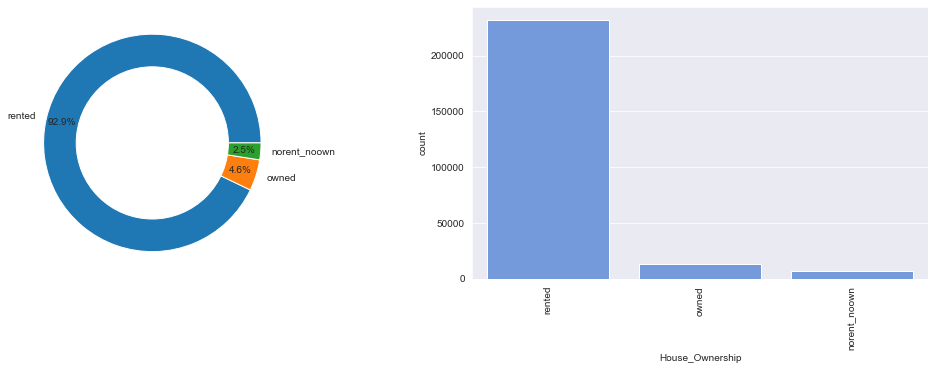

Married/Single
no.of nulls : 0
% of nulls : 0.0


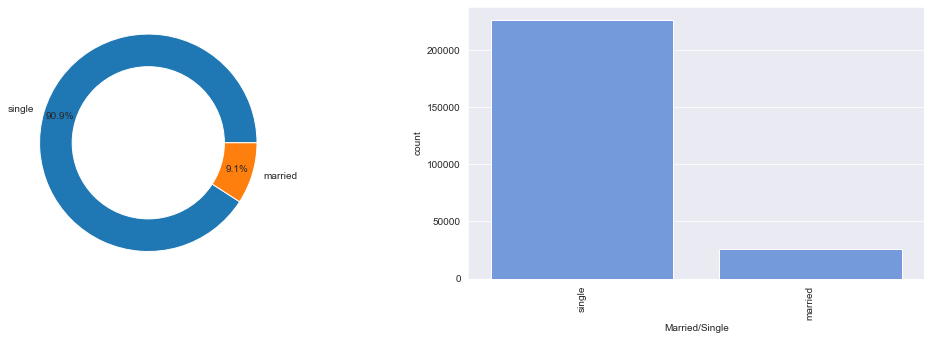

Car_Ownership
no.of nulls : 0
% of nulls : 0.0


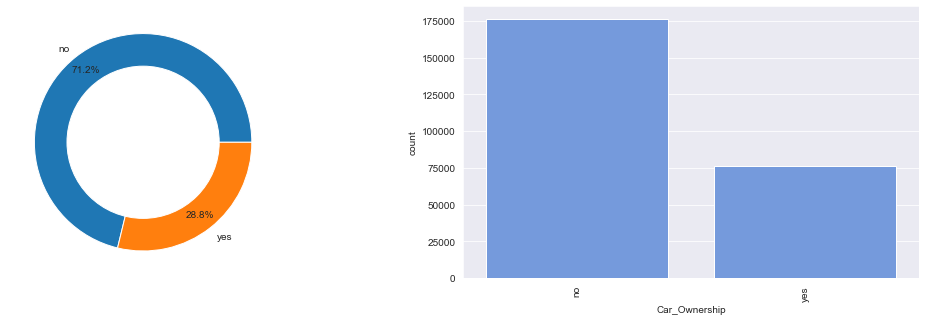

In [97]:
for col in ['House_Ownership', 'Married/Single','Car_Ownership']:
    print(col)
    print('no.of nulls :',train_df[col].isna().sum())
    print('% of nulls :',np.round_(train_df[col].isna().sum()/len(train_df)*100,decimals=2))
    plot_categorical_features_2(train_df,col)

In [98]:
categorical_features

['Profession', 'STATE', 'House_Ownership', 'Married/Single', 'Car_Ownership']

In [99]:
discrete_features

['Experience', 'CURRENT_JOB_YRS', 'CURRENT_HOUSE_YRS']

Experience


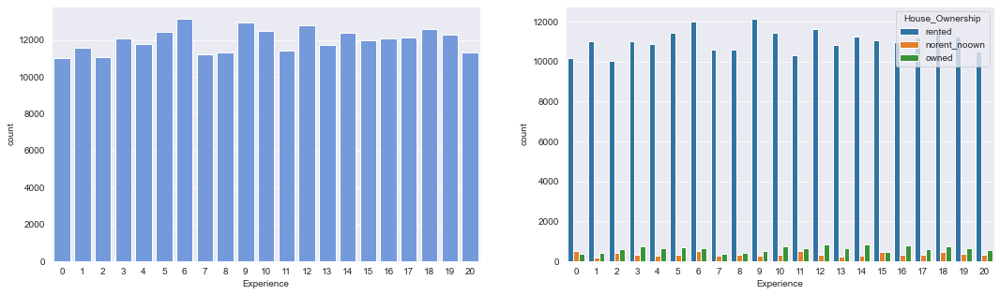

CURRENT_JOB_YRS


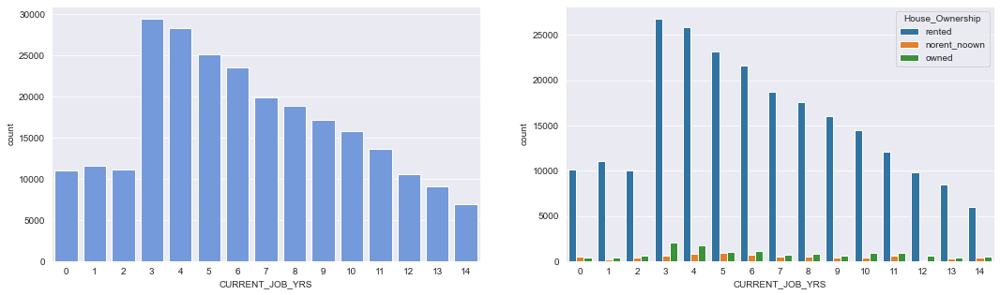

CURRENT_HOUSE_YRS


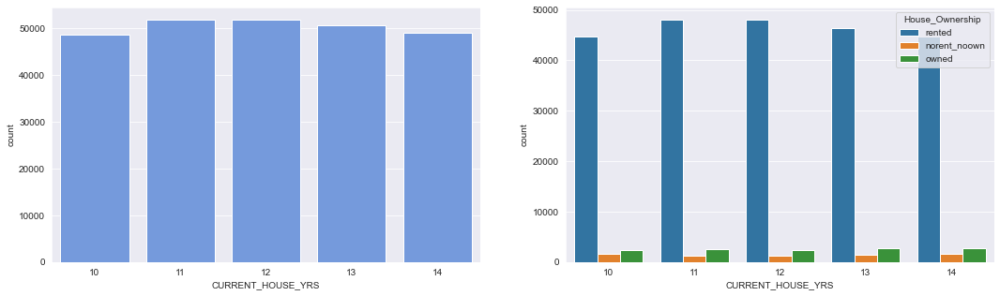

In [100]:
for col in discrete_features:
    print(col)
    plt.figure(figsize = (18,5))
    plt.subplot(1, 2, 1)
    sns.countplot(data=df, x=col,color='cornflowerblue')
    plt.xlabel(col)
    plt.ylabel('count')
    plt.subplot(1, 2, 2)
    sns.countplot(data=df, x=col, hue="House_Ownership")
    plt.show()

Experience


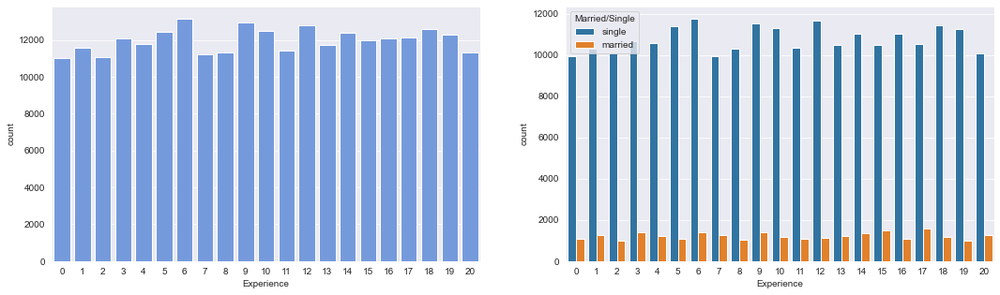

CURRENT_JOB_YRS


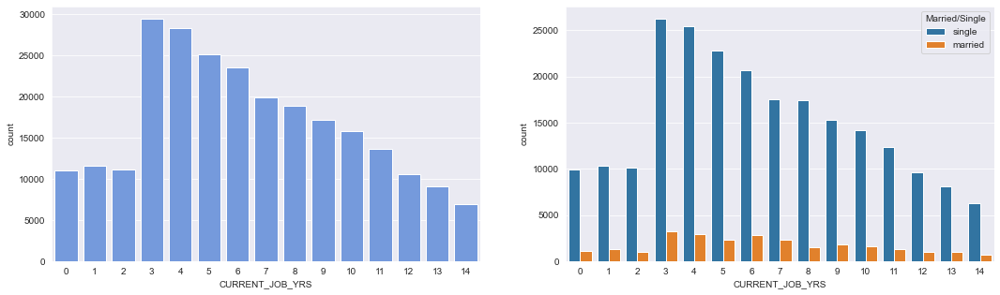

CURRENT_HOUSE_YRS


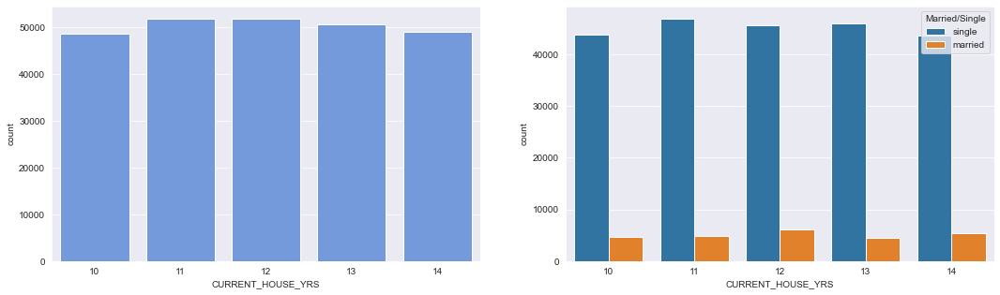

In [101]:
for col in discrete_features:
    print(col)
    plt.figure(figsize = (18,5))
    plt.subplot(1, 2, 1)
    sns.countplot(data=df, x=col,color='cornflowerblue')
    plt.xlabel(col)
    plt.ylabel('count')
    plt.subplot(1, 2, 2)
    sns.countplot(data=df, x=col, hue="Married/Single")
    plt.show()

Experience


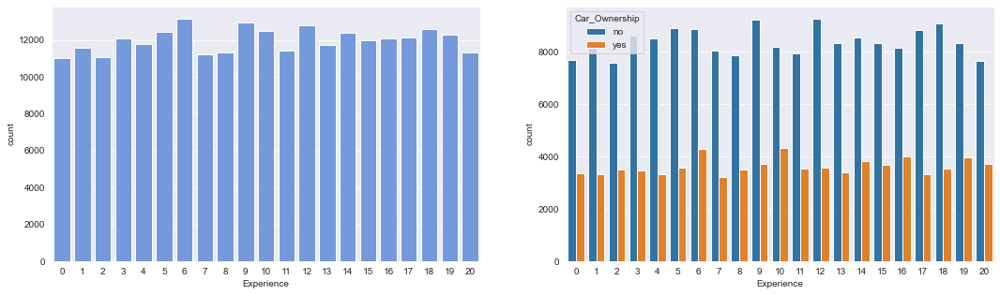

CURRENT_JOB_YRS


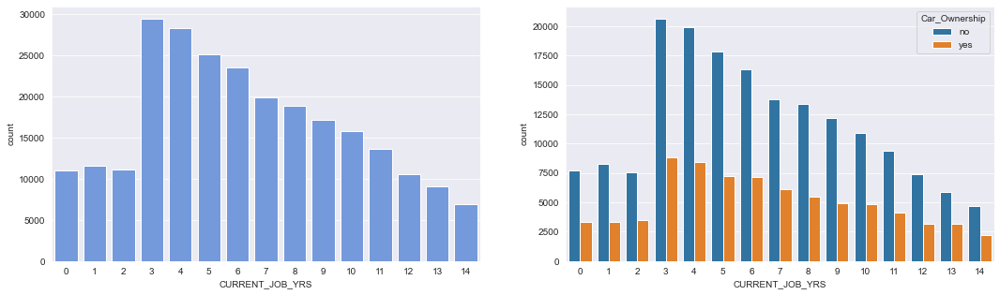

CURRENT_HOUSE_YRS


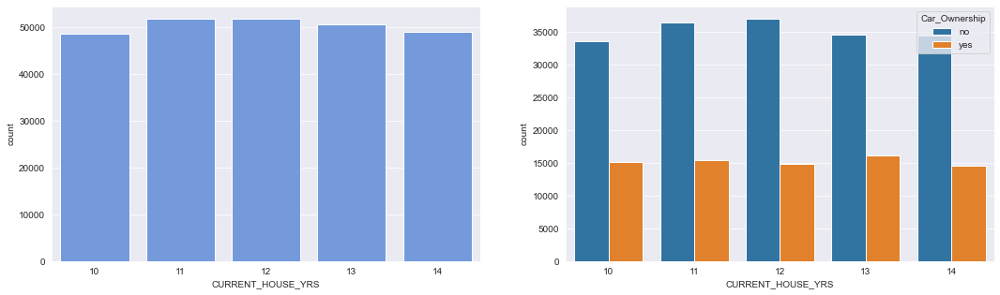

In [102]:
for col in discrete_features:
    print(col)
    plt.figure(figsize = (18,5))
    plt.subplot(1, 2, 1)
    sns.countplot(data=df, x=col,color='cornflowerblue')
    plt.xlabel(col)
    plt.ylabel('count')
    plt.subplot(1, 2, 2)
    sns.countplot(data=df, x=col, hue="Car_Ownership")
    plt.show()

In [103]:
train_df[categorical_features].nunique().sort_values(ascending=False)

Profession         51
STATE              29
House_Ownership     3
Married/Single      2
Car_Ownership       2
dtype: int64

House_Ownership


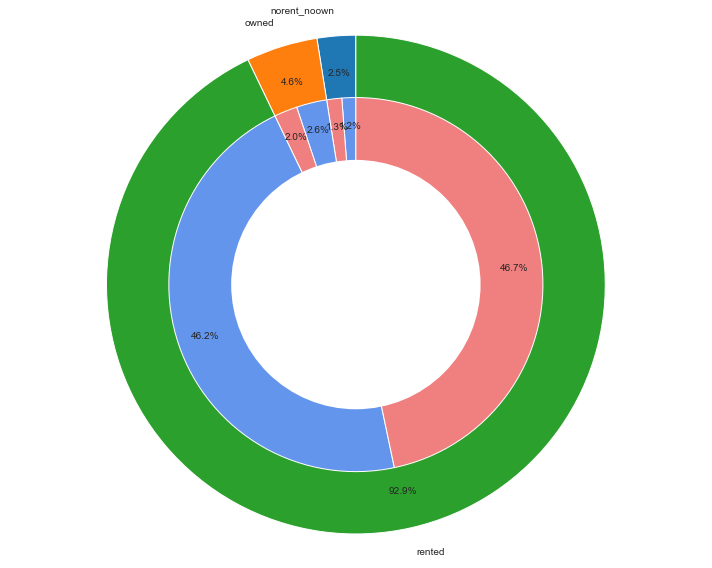

In [104]:
print('House_Ownership')
labels = train_df['House_Ownership'].value_counts().sort_index().index
sizes = train_df['House_Ownership'].value_counts().sort_index().values
#labels_gender = [0,1,0,1]
sizes_gender = train_df.groupby(['House_Ownership','target'])['target'].count().values
#colors = ['slategrey', '#ffcc99']
colors_gender = ['cornflowerblue','lightcoral','cornflowerblue','lightcoral','cornflowerblue','lightcoral']
 
# Plot
plt.figure(figsize = (10,8))
plt.pie(sizes, labels=labels, startangle=90,frame=True,autopct='%1.1f%%', pctdistance=0.85)
plt.pie(sizes_gender,colors=colors_gender,radius=0.75,startangle=90,autopct='%1.1f%%', pctdistance=0.85)
centre_circle = plt.Circle((0,0),0.5,color='black', fc='white',linewidth=0)
fig = plt.gcf()
fig.gca().add_artist(centre_circle)
 
plt.axis('equal')
plt.tight_layout()
plt.show()

Married/Single


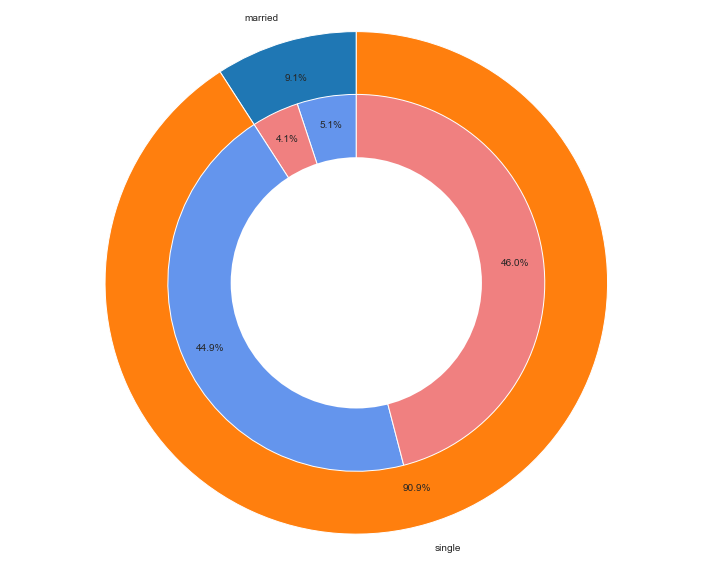

In [105]:
print('Married/Single')
labels = train_df['Married/Single'].value_counts().sort_index().index
sizes = train_df['Married/Single'].value_counts().sort_index().values
#labels_gender = [0,1,0,1]
sizes_gender = train_df.groupby(['Married/Single','target'])['target'].count().values
#colors = ['slategrey', '#ffcc99']
colors_gender = ['cornflowerblue','lightcoral','cornflowerblue','lightcoral']
 
# Plot
plt.figure(figsize = (10,8))
plt.pie(sizes, labels=labels, startangle=90,frame=True,autopct='%1.1f%%', pctdistance=0.85)
plt.pie(sizes_gender,colors=colors_gender,radius=0.75,startangle=90,autopct='%1.1f%%', pctdistance=0.85)
centre_circle = plt.Circle((0,0),0.5,color='black', fc='white',linewidth=0)
fig = plt.gcf()
fig.gca().add_artist(centre_circle)
 
plt.axis('equal')
plt.tight_layout()
plt.show()

Car_Ownership


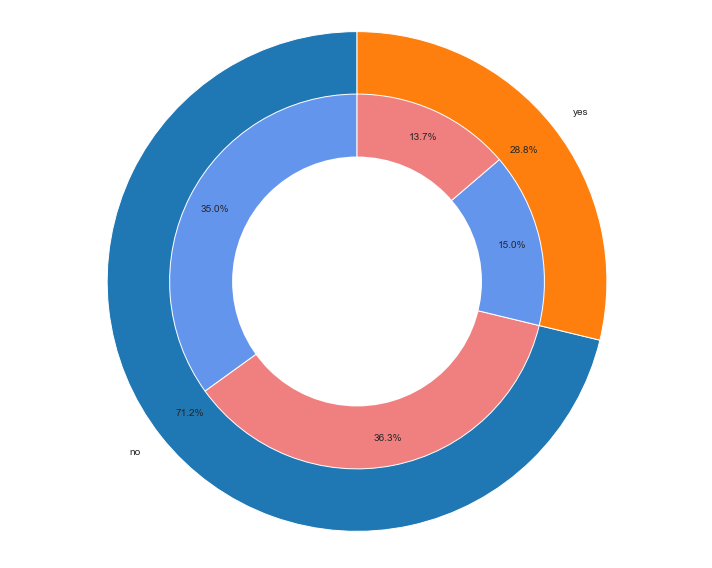

In [106]:
print('Car_Ownership')
labels = train_df['Car_Ownership'].value_counts().sort_index().index
sizes = train_df['Car_Ownership'].value_counts().sort_index().values
#labels_gender = [0,1,0,1]
sizes_gender = train_df.groupby(['Car_Ownership','target'])['target'].count().values
#colors = ['slategrey', '#ffcc99']
colors_gender = ['cornflowerblue','lightcoral','cornflowerblue','lightcoral']
 
# Plot
plt.figure(figsize = (10,8))
plt.pie(sizes, labels=labels, startangle=90,frame=True,autopct='%1.1f%%', pctdistance=0.85)
plt.pie(sizes_gender,colors=colors_gender,radius=0.75,startangle=90,autopct='%1.1f%%', pctdistance=0.85)
centre_circle = plt.Circle((0,0),0.5,color='black', fc='white',linewidth=0)
fig = plt.gcf()
fig.gca().add_artist(centre_circle)
 
plt.axis('equal')
plt.tight_layout()
plt.show()

In [107]:
continuous_features

['Income', 'Age']

In [108]:
discrete_features

['Experience', 'CURRENT_JOB_YRS', 'CURRENT_HOUSE_YRS']

In [109]:
categorical_features

['Profession', 'STATE', 'House_Ownership', 'Married/Single', 'Car_Ownership']

In [110]:
from num2words import num2words
data = train_df.copy()

In [111]:
for col in discrete_features:
    data[col] = data[col].apply(lambda x: num2words(x))

In [112]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4000 entries, 0 to 3999
Data columns (total 12 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   Income             4000 non-null   int64 
 1   Age                4000 non-null   int64 
 2   Experience         4000 non-null   object
 3   Married/Single     4000 non-null   object
 4   House_Ownership    4000 non-null   object
 5   Car_Ownership      4000 non-null   object
 6   Profession         4000 non-null   object
 7   CITY               4000 non-null   object
 8   STATE              4000 non-null   object
 9   CURRENT_JOB_YRS    4000 non-null   object
 10  CURRENT_HOUSE_YRS  4000 non-null   object
 11  target             4000 non-null   int64 
dtypes: int64(3), object(9)
memory usage: 375.1+ KB


In [113]:
data

,Income,Age,Experience,Married/Single,House_Ownership,Car_Ownership,Profession,CITY,STATE,CURRENT_JOB_YRS,CURRENT_HOUSE_YRS,target
0,7848654,55,nine,single,rented,no,Software_Developer,Patna,Bihar,nine,thirteen,0
1,5548741,73,eighteen,single,rented,no,Industrial_Engineer,Bettiah[33],Bihar,four,thirteen,1
2,7727737,41,eleven,single,rented,no,Civil_servant,Giridih,Jharkhand,three,eleven,0
3,7428533,59,one,single,rented,no,Firefighter,Agartala,Tripura,one,twelve,1
4,1768758,70,eighteen,single,rented,yes,Analyst,Mehsana,Gujarat,eleven,fourteen,0
...,...,...,...,...,...,...,...,...,...,...,...,...
3995,2936274,49,four,single,rented,no,Design_Engineer,Pondicherry,Puducherry,four,ten,1
3996,6744134,56,thirteen,single,rented,yes,Police_officer,Unnao,Uttar_Pradesh,eight,fourteen,1
3997,8236972,21,seven,single,rented,no,Designer,Munger,Bihar,four,thirteen,1
3998,1067890,41,fourteen,single,rented,yes,Air_traffic_controller,Sambalpur,Odisha,three,twelve,1


In [114]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4000 entries, 0 to 3999
Data columns (total 12 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   Income             4000 non-null   int64 
 1   Age                4000 non-null   int64 
 2   Experience         4000 non-null   object
 3   Married/Single     4000 non-null   object
 4   House_Ownership    4000 non-null   object
 5   Car_Ownership      4000 non-null   object
 6   Profession         4000 non-null   object
 7   CITY               4000 non-null   object
 8   STATE              4000 non-null   object
 9   CURRENT_JOB_YRS    4000 non-null   object
 10  CURRENT_HOUSE_YRS  4000 non-null   object
 11  target             4000 non-null   int64 
dtypes: int64(3), object(9)
memory usage: 375.1+ KB


In [115]:
categorical_features

['Profession', 'STATE', 'House_Ownership', 'Married/Single', 'Car_Ownership']

Income


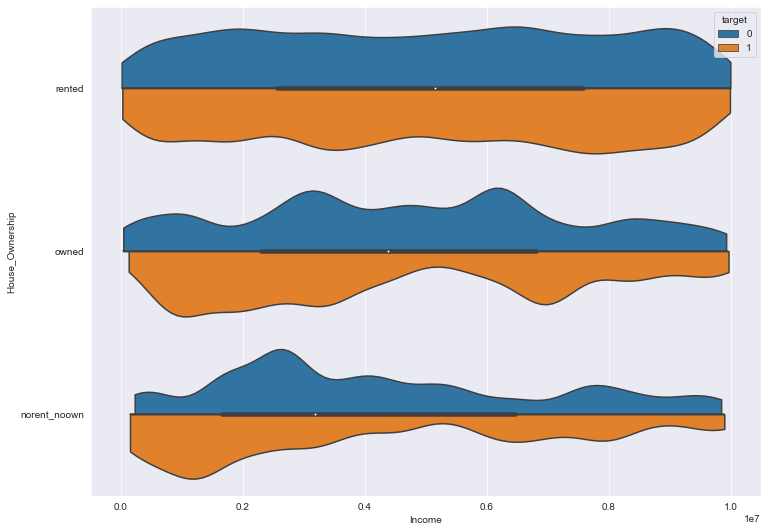

Age


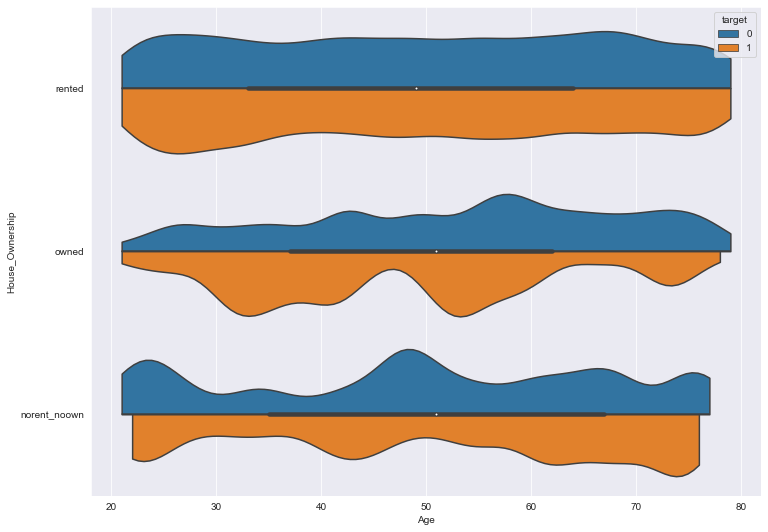

In [116]:
for col in continuous_features:
    print(col)
    plt.figure(figsize = (12,9))
    sns.violinplot(data=train_df, x=col, y="House_Ownership", hue="target", split=True,orient='h', bw=.15,cut=0)
    plt.xlabel(col)
    plt.ylabel('House_Ownership')
    plt.show()

Income


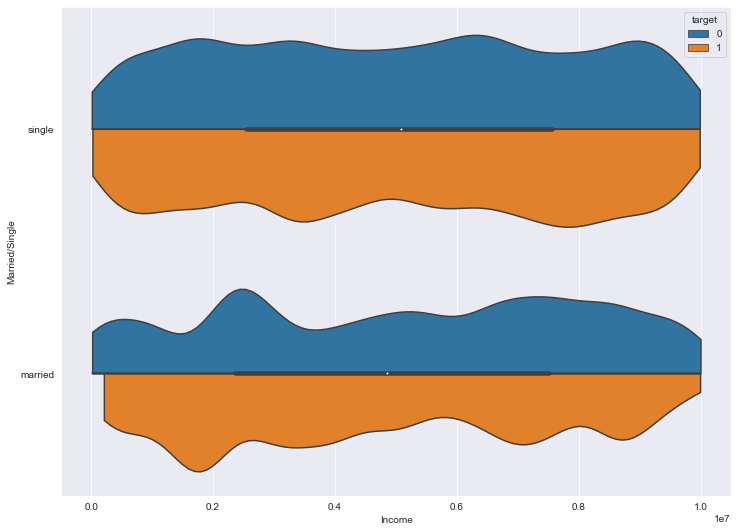

Age


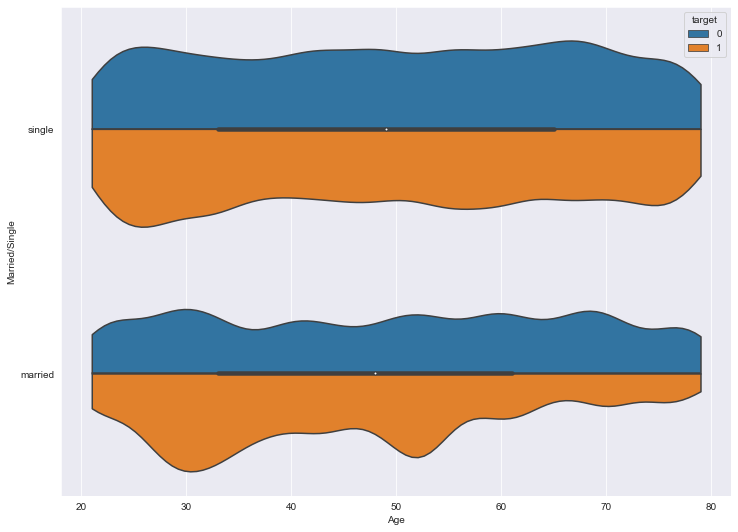

In [117]:
for col in continuous_features:
    print(col)
    plt.figure(figsize = (12,9))
    sns.violinplot(data=train_df, x=col, y="Married/Single", hue="target", split=True,orient='h', bw=.15,cut=0)
    plt.xlabel(col)
    plt.ylabel('Married/Single')
    plt.show()

Income


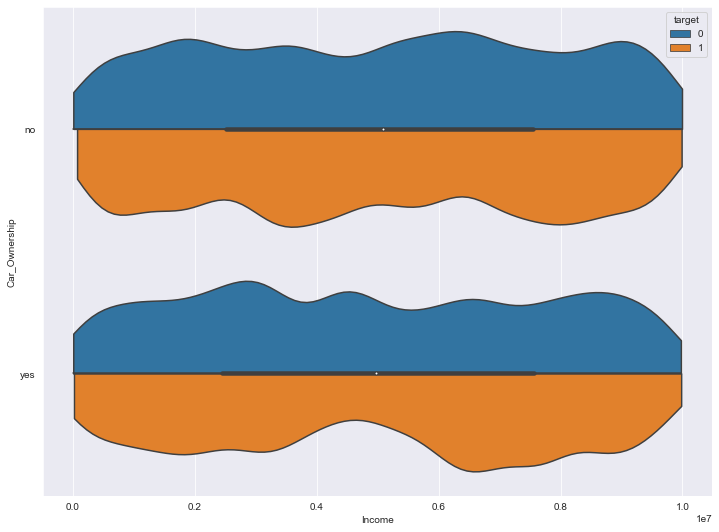

Age


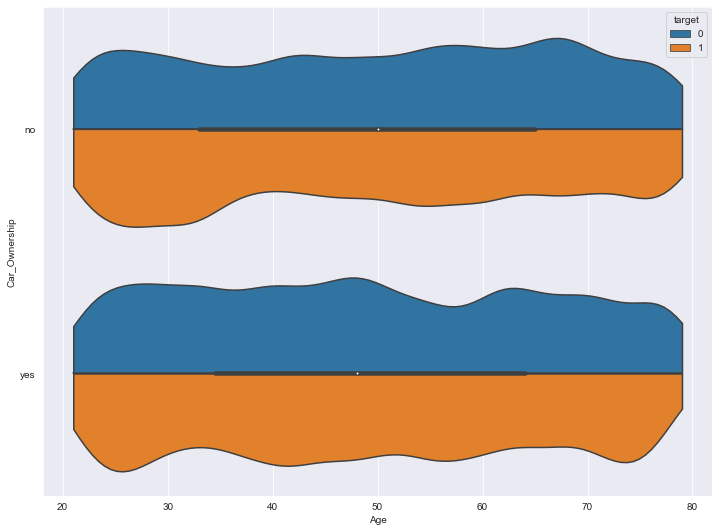

In [118]:
for col in continuous_features:
    print(col)
    plt.figure(figsize = (12,9))
    sns.violinplot(data=train_df, x=col, y="Car_Ownership", hue="target", split=True,orient='h', bw=.15,cut=0)
    plt.xlabel(col)
    plt.ylabel('Car_Ownership')
    plt.show()

In [119]:
train_df.niiofbid()

AttributeError: 'DataFrame' object has no attribute 'niiofbid'

In [120]:
train_df

,Income,Age,Experience,Married/Single,House_Ownership,Car_Ownership,Profession,CITY,STATE,CURRENT_JOB_YRS,CURRENT_HOUSE_YRS,target
0,7848654,55,9,single,rented,no,Software_Developer,Patna,Bihar,9,13,0
1,5548741,73,18,single,rented,no,Industrial_Engineer,Bettiah[33],Bihar,4,13,1
2,7727737,41,11,single,rented,no,Civil_servant,Giridih,Jharkhand,3,11,0
3,7428533,59,1,single,rented,no,Firefighter,Agartala,Tripura,1,12,1
4,1768758,70,18,single,rented,yes,Analyst,Mehsana,Gujarat,11,14,0
...,...,...,...,...,...,...,...,...,...,...,...,...
3995,2936274,49,4,single,rented,no,Design_Engineer,Pondicherry,Puducherry,4,10,1
3996,6744134,56,13,single,rented,yes,Police_officer,Unnao,Uttar_Pradesh,8,14,1
3997,8236972,21,7,single,rented,no,Designer,Munger,Bihar,4,13,1
3998,1067890,41,14,single,rented,yes,Air_traffic_controller,Sambalpur,Odisha,3,12,1


In [121]:
total_train_df

,Income,Age,Experience,Married/Single,House_Ownership,Car_Ownership,Profession,CITY,STATE,CURRENT_JOB_YRS,CURRENT_HOUSE_YRS,target
0,1303834,23,3,single,rented,no,Mechanical_engineer,Rewa,Madhya_Pradesh,3,13,0
1,7574516,40,10,single,rented,no,Software_Developer,Parbhani,Maharashtra,9,13,0
2,3991815,66,4,married,rented,no,Technical_writer,Alappuzha,Kerala,4,10,0
3,6256451,41,2,single,rented,yes,Software_Developer,Bhubaneswar,Odisha,2,12,1
4,5768871,47,11,single,rented,no,Civil_servant,Tiruchirappalli[10],Tamil_Nadu,3,14,1
...,...,...,...,...,...,...,...,...,...,...,...,...
247995,8154883,43,13,single,rented,no,Surgeon,Kolkata,West_Bengal,6,11,0
247996,2843572,26,10,single,rented,no,Army_officer,Rewa,Madhya_Pradesh,6,11,0
247997,4522448,46,7,single,rented,no,Design_Engineer,Kalyan-Dombivli,Maharashtra,7,12,0
247998,6507128,45,0,single,rented,no,Graphic_Designer,Pondicherry,Puducherry,0,10,0


In [122]:
val_df

,Income,Age,Experience,Married/Single,House_Ownership,Car_Ownership,Profession,CITY,STATE,CURRENT_JOB_YRS,CURRENT_HOUSE_YRS,target
0,9142815,26,3,married,rented,yes,Technology_specialist,Berhampore,West_Bengal,3,12,0
1,3545959,28,6,single,rented,no,Magistrate,Mangalore,Karnataka,6,13,0
2,9962662,79,19,single,rented,no,Microbiologist,Amritsar,Punjab,7,11,0
3,7752698,71,15,single,rented,no,Microbiologist,Agartala,Tripura,9,14,1
4,223199,76,8,single,rented,no,Surveyor,Adoni,Andhra_Pradesh,3,14,1
...,...,...,...,...,...,...,...,...,...,...,...,...
1995,4142958,60,2,single,rented,no,Surveyor,Erode[17],Tamil_Nadu,2,11,0
1996,8072596,52,1,single,rented,yes,Computer_operator,Delhi_city,Delhi,1,13,0
1997,5623318,31,13,single,rented,yes,Fashion_Designer,Thane,Maharashtra,13,11,0
1998,7361429,58,2,single,rented,no,Web_designer,Thiruvananthapuram,Kerala,2,12,1


In [123]:
test_df

,Income,Age,Experience,Married/Single,House_Ownership,Car_Ownership,Profession,CITY,STATE,CURRENT_JOB_YRS,CURRENT_HOUSE_YRS,target
0,3486482,28,15,single,rented,yes,Industrial_Engineer,Vijayawada,Andhra_Pradesh,10,10,0
1,8356848,54,2,single,rented,no,Dentist,Nangloi_Jat,Delhi,2,12,1
2,2822929,29,5,single,rented,yes,Chemical_engineer,Tiruvottiyur,Tamil_Nadu,5,10,0
3,1850597,55,12,single,norent_noown,no,Consultant,Nandyal,Andhra_Pradesh,12,10,0
4,4277458,41,8,single,rented,no,Civil_engineer,Kumbakonam,Tamil_Nadu,8,11,0
...,...,...,...,...,...,...,...,...,...,...,...,...
1995,3607368,27,19,single,rented,yes,Technician,Barasat,West_Bengal,13,11,1
1996,6983206,79,10,single,rented,yes,Economist,"Khora,_Ghaziabad",Uttar_Pradesh,3,14,0
1997,2310597,30,6,single,rented,no,Technology_specialist,Pondicherry,Puducherry,6,13,0
1998,6509681,30,10,single,rented,yes,Industrial_Engineer,Nadiad,Gujarat,10,10,0


In [124]:
# writing the train_df to a file

train_df.to_csv('../Data/Indian_Loan_Default_Prediction/train_df.csv',index=False)

In [125]:
# writing the train_df to a file

total_train_df.to_csv('../Data/Indian_Loan_Default_Prediction/total_train_df.csv',index=False)

In [126]:
# writing the val_df to a file

val_df.to_csv('../Data/Indian_Loan_Default_Prediction/val_df.csv',index=False)

In [127]:
# writing the test_df to a file

test_df.to_csv('../Data/Indian_Loan_Default_Prediction/test_df.csv',index=False)

# Feature Engineering

In [128]:
# Preprocessing imports
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import FunctionTransformer,QuantileTransformer,PowerTransformer
from sklearn.preprocessing import OneHotEncoder,OrdinalEncoder,LabelEncoder
from sklearn.preprocessing import StandardScaler,RobustScaler,MinMaxScaler

# Models
from sklearn.linear_model import LogisticRegression,SGDClassifier,RidgeClassifier
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB,BernoulliNB,CategoricalNB,MultinomialNB
from sklearn.tree import DecisionTreeClassifier,ExtraTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import GradientBoostingClassifier,RandomForestClassifier,IsolationForest,ExtraTreesClassifier,AdaBoostClassifier
from xgboost import XGBClassifier,XGBRFClassifier

# Cross-validation
from sklearn.model_selection import cross_val_score

# Hyperparameter tuning
from sklearn.model_selection import GridSearchCV

# Pipeline
from sklearn.pipeline import Pipeline,make_pipeline
from sklearn.compose import ColumnTransformer,TransformedTargetRegressor

# Metrics
from sklearn.metrics import accuracy_score,classification_report,precision_score,recall_score,f1_score,precision_recall_curve

from imblearn.over_sampling import SMOTE

# Visualize Pipeline
from sklearn import set_config

# PCA - for dimensionality reduction
from sklearn.decomposition import PCA

# to calculate VIF
from statsmodels.stats.outliers_influence import variance_inflation_factor

# To calculate the Verinces of each feature
from sklearn.feature_selection import VarianceThreshold

# Mutual Information for classification - For Feature Selection
from sklearn.feature_selection import mutual_info_classif

In [129]:
train_df = pd.read_csv('../Data/Indian_Loan_Default_Prediction/train_df.csv')
X_train = train_df.drop('target',axis=1)
y_train = train_df['target']

In [130]:
val_df = pd.read_csv('../Data/Indian_Loan_Default_Prediction/val_df.csv')
X_val = val_df.drop('target',axis=1)
y_val = val_df['target']

In [131]:
test_df = pd.read_csv('../Data/Indian_Loan_Default_Prediction/test_df.csv')
X_test = test_df.drop('target',axis=1)
y_test = test_df['target']

In [132]:
X_train

,Income,Age,Experience,Married/Single,House_Ownership,Car_Ownership,Profession,CITY,STATE,CURRENT_JOB_YRS,CURRENT_HOUSE_YRS
0,7848654,55,9,single,rented,no,Software_Developer,Patna,Bihar,9,13
1,5548741,73,18,single,rented,no,Industrial_Engineer,Bettiah[33],Bihar,4,13
2,7727737,41,11,single,rented,no,Civil_servant,Giridih,Jharkhand,3,11
3,7428533,59,1,single,rented,no,Firefighter,Agartala,Tripura,1,12
4,1768758,70,18,single,rented,yes,Analyst,Mehsana,Gujarat,11,14
...,...,...,...,...,...,...,...,...,...,...,...
3995,2936274,49,4,single,rented,no,Design_Engineer,Pondicherry,Puducherry,4,10
3996,6744134,56,13,single,rented,yes,Police_officer,Unnao,Uttar_Pradesh,8,14
3997,8236972,21,7,single,rented,no,Designer,Munger,Bihar,4,13
3998,1067890,41,14,single,rented,yes,Air_traffic_controller,Sambalpur,Odisha,3,12


In [133]:
y_train

0       0
1       1
2       0
3       1
4       0
       ..
3995    1
3996    1
3997    1
3998    1
3999    0
Name: target, Length: 4000, dtype: int64

In [134]:
X_val

,Income,Age,Experience,Married/Single,House_Ownership,Car_Ownership,Profession,CITY,STATE,CURRENT_JOB_YRS,CURRENT_HOUSE_YRS
0,9142815,26,3,married,rented,yes,Technology_specialist,Berhampore,West_Bengal,3,12
1,3545959,28,6,single,rented,no,Magistrate,Mangalore,Karnataka,6,13
2,9962662,79,19,single,rented,no,Microbiologist,Amritsar,Punjab,7,11
3,7752698,71,15,single,rented,no,Microbiologist,Agartala,Tripura,9,14
4,223199,76,8,single,rented,no,Surveyor,Adoni,Andhra_Pradesh,3,14
...,...,...,...,...,...,...,...,...,...,...,...
1995,4142958,60,2,single,rented,no,Surveyor,Erode[17],Tamil_Nadu,2,11
1996,8072596,52,1,single,rented,yes,Computer_operator,Delhi_city,Delhi,1,13
1997,5623318,31,13,single,rented,yes,Fashion_Designer,Thane,Maharashtra,13,11
1998,7361429,58,2,single,rented,no,Web_designer,Thiruvananthapuram,Kerala,2,12


In [135]:
y_val

0       0
1       0
2       0
3       1
4       1
       ..
1995    0
1996    0
1997    0
1998    1
1999    0
Name: target, Length: 2000, dtype: int64

In [136]:
X_test

,Income,Age,Experience,Married/Single,House_Ownership,Car_Ownership,Profession,CITY,STATE,CURRENT_JOB_YRS,CURRENT_HOUSE_YRS
0,3486482,28,15,single,rented,yes,Industrial_Engineer,Vijayawada,Andhra_Pradesh,10,10
1,8356848,54,2,single,rented,no,Dentist,Nangloi_Jat,Delhi,2,12
2,2822929,29,5,single,rented,yes,Chemical_engineer,Tiruvottiyur,Tamil_Nadu,5,10
3,1850597,55,12,single,norent_noown,no,Consultant,Nandyal,Andhra_Pradesh,12,10
4,4277458,41,8,single,rented,no,Civil_engineer,Kumbakonam,Tamil_Nadu,8,11
...,...,...,...,...,...,...,...,...,...,...,...
1995,3607368,27,19,single,rented,yes,Technician,Barasat,West_Bengal,13,11
1996,6983206,79,10,single,rented,yes,Economist,"Khora,_Ghaziabad",Uttar_Pradesh,3,14
1997,2310597,30,6,single,rented,no,Technology_specialist,Pondicherry,Puducherry,6,13
1998,6509681,30,10,single,rented,yes,Industrial_Engineer,Nadiad,Gujarat,10,10


In [137]:
y_test

0       0
1       1
2       0
3       0
4       0
       ..
1995    1
1996    0
1997    0
1998    0
1999    0
Name: target, Length: 2000, dtype: int64

In [138]:
numerical_features = ['Income', 'Age', 'Experience', 'CURRENT_JOB_YRS', 'CURRENT_HOUSE_YRS']
numerical_features

['Income', 'Age', 'Experience', 'CURRENT_JOB_YRS', 'CURRENT_HOUSE_YRS']

In [139]:
categorical_features = ['Married/Single', 'House_Ownership', 'Car_Ownership', 'Profession','CITY', 'STATE']
categorical_features

['Married/Single',
 'House_Ownership',
 'Car_Ownership',
 'Profession',
 'CITY',
 'STATE']

In [140]:
len(numerical_features)

5

In [141]:
len(categorical_features)

6

### Building preprocessing pipeline

In [142]:
numeric_processor=Pipeline([("imputation_mean",SimpleImputer(strategy='median',add_indicator=True)),
                           ("quantiletransformer",QuantileTransformer(output_distribution='normal'))])

categorical_processor=Pipeline([("imputation_consatnt",SimpleImputer(fill_value="missing",strategy="constant")),
                                ("onehotencoder",OneHotEncoder(handle_unknown='ignore',sparse_output=False,min_frequency=0.01,max_categories=15))])

preprocessor=ColumnTransformer([("numeric_processor",numeric_processor,numerical_features),
                               ("categorical_processor",categorical_processor,categorical_features)])

final_pipe=Pipeline([("preprocessor",preprocessor),
                     ("scaler",RobustScaler())])

In [143]:
final_pipe

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('numeric_processor',
                                                  Pipeline(steps=[('imputation_mean',
                                                                   SimpleImputer(add_indicator=True,
                                                                                 strategy='median')),
                                                                  ('quantiletransformer',
                                                                   QuantileTransformer(output_distribution='normal'))]),
                                                  ['Income', 'Age',
                                                   'Experience',
                                                   'CURRENT_JOB_YRS',
                                                   'CURRENT_HOUSE_YRS']),
                                                 ('categorical_processor',
                                                  Pipeline(steps=[('imputation_consatnt',
                                                                   SimpleImputer(fill_value='missing',
                                                                                 strategy='constant')),
                                                                  ('onehotencoder',
                                                                   OneHotEncoder(handle_unknown='ignore',
                                                                                 max_categories=15,
                                                                                 min_frequency=0.01,
                                                                                 sparse_output=False))]),
                                                  ['Married/Single',
                                                   'House_Ownership',
                                                   'Car_Ownership',
                                                   'Profession', 'CITY',
                                                   'STATE'])])),
                ('scaler', RobustScaler())])

In [144]:
X_train_FE = pd.DataFrame(final_pipe.fit_transform(X_train),columns=final_pipe.get_feature_names_out(X_train.columns))

In [145]:
X_val_FE = pd.DataFrame(final_pipe.transform(X_val),columns=final_pipe.get_feature_names_out(X_val.columns))

In [146]:
X_test_FE = pd.DataFrame(final_pipe.transform(X_test),columns=final_pipe.get_feature_names_out(X_test.columns))

In [147]:
X_train_FE

,numeric_processor__Income,numeric_processor__Age,numeric_processor__Experience,numeric_processor__CURRENT_JOB_YRS,numeric_processor__CURRENT_HOUSE_YRS,categorical_processor__Married/Single_married,categorical_processor__Married/Single_single,categorical_processor__House_Ownership_norent_noown,categorical_processor__House_Ownership_owned,categorical_processor__House_Ownership_rented,categorical_processor__Car_Ownership_no,categorical_processor__Car_Ownership_yes,categorical_processor__Profession_Biomedical_Engineer,categorical_processor__Profession_Chartered_Accountant,categorical_processor__Profession_Chef,categorical_processor__Profession_Comedian,categorical_processor__Profession_Consultant,categorical_processor__Profession_Firefighter,categorical_processor__Profession_Mechanical_engineer,categorical_processor__Profession_Petroleum_Engineer,categorical_processor__Profession_Physician,categorical_processor__Profession_Police_officer,categorical_processor__Profession_Psychologist,categorical_processor__Profession_Software_Developer,categorical_processor__Profession_Statistician,categorical_processor__Profession_Technical_writer,categorical_processor__Profession_infrequent_sklearn,categorical_processor__CITY_infrequent_sklearn,categorical_processor__STATE_Andhra_Pradesh,categorical_processor__STATE_Assam,categorical_processor__STATE_Bihar,categorical_processor__STATE_Gujarat,categorical_processor__STATE_Haryana,categorical_processor__STATE_Jharkhand,categorical_processor__STATE_Karnataka,categorical_processor__STATE_Madhya_Pradesh,categorical_processor__STATE_Maharashtra,categorical_processor__STATE_Rajasthan,categorical_processor__STATE_Tamil_Nadu,categorical_processor__STATE_Telangana,categorical_processor__STATE_Uttar_Pradesh,categorical_processor__STATE_West_Bengal,categorical_processor__STATE_infrequent_sklearn
0,0.585190,0.185228,-0.099964,0.411770,0.500228,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,-1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.089601,0.928989,0.946134,-0.349839,0.500228,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.552658,-0.252568,0.093449,-0.588230,-0.499772,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.469447,0.315581,-1.181777,-1.016268,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
4,-0.693729,0.765857,0.946134,0.701888,4.845921,0.0,0.0,0.0,0.0,0.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3995,-0.409394,0.000000,-0.633365,-0.349839,-4.857628,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
3996,0.324106,0.221730,0.278682,0.280914,4.845921,0.0,0.0,0.0,0.0,0.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,-1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
3997,0.690397,-3.834673,-0.285179,-0.349839,0.500228,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3998,-0.921042,-0.252568,0.377436,-0.588230,0.000000,0.0,0.0,0.0,0.0,0.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0


In [148]:
y_train

0       0
1       1
2       0
3       1
4       0
       ..
3995    1
3996    1
3997    1
3998    1
3999    0
Name: target, Length: 4000, dtype: int64

In [149]:
X_val_FE

,numeric_processor__Income,numeric_processor__Age,numeric_processor__Experience,numeric_processor__CURRENT_JOB_YRS,numeric_processor__CURRENT_HOUSE_YRS,categorical_processor__Married/Single_married,categorical_processor__Married/Single_single,categorical_processor__House_Ownership_norent_noown,categorical_processor__House_Ownership_owned,categorical_processor__House_Ownership_rented,categorical_processor__Car_Ownership_no,categorical_processor__Car_Ownership_yes,categorical_processor__Profession_Biomedical_Engineer,categorical_processor__Profession_Chartered_Accountant,categorical_processor__Profession_Chef,categorical_processor__Profession_Comedian,categorical_processor__Profession_Consultant,categorical_processor__Profession_Firefighter,categorical_processor__Profession_Mechanical_engineer,categorical_processor__Profession_Petroleum_Engineer,categorical_processor__Profession_Physician,categorical_processor__Profession_Police_officer,categorical_processor__Profession_Psychologist,categorical_processor__Profession_Software_Developer,categorical_processor__Profession_Statistician,categorical_processor__Profession_Technical_writer,categorical_processor__Profession_infrequent_sklearn,categorical_processor__CITY_infrequent_sklearn,categorical_processor__STATE_Andhra_Pradesh,categorical_processor__STATE_Assam,categorical_processor__STATE_Bihar,categorical_processor__STATE_Gujarat,categorical_processor__STATE_Haryana,categorical_processor__STATE_Jharkhand,categorical_processor__STATE_Karnataka,categorical_processor__STATE_Madhya_Pradesh,categorical_processor__STATE_Maharashtra,categorical_processor__STATE_Rajasthan,categorical_processor__STATE_Tamil_Nadu,categorical_processor__STATE_Telangana,categorical_processor__STATE_Uttar_Pradesh,categorical_processor__STATE_West_Bengal,categorical_processor__STATE_infrequent_sklearn
0,1.048359,-0.903864,-0.772860,-0.588230,0.000000,1.0,-1.0,0.0,0.0,0.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
1,-0.265687,-0.754737,-0.388676,0.000000,0.500228,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,2.045921,3.845792,1.171684,0.146250,-0.499772,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
3,0.559308,0.816428,0.494131,0.411770,4.845921,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
4,-1.494804,1.150453,-0.193983,-0.588230,4.845921,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1995,-0.156219,0.351374,-0.946470,-0.815764,-0.499772,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
1996,0.648045,0.086337,-1.181777,-1.016268,0.500228,0.0,0.0,0.0,0.0,0.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
1997,0.101317,-0.608960,0.278682,1.062462,-0.499772,0.0,0.0,0.0,0.0,0.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
1998,0.458042,0.281494,-0.946470,-0.815764,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0


In [150]:
y_val

0       0
1       0
2       0
3       1
4       1
       ..
1995    0
1996    0
1997    0
1998    1
1999    0
Name: target, Length: 2000, dtype: int64

In [151]:
X_test_FE

,numeric_processor__Income,numeric_processor__Age,numeric_processor__Experience,numeric_processor__CURRENT_JOB_YRS,numeric_processor__CURRENT_HOUSE_YRS,categorical_processor__Married/Single_married,categorical_processor__Married/Single_single,categorical_processor__House_Ownership_norent_noown,categorical_processor__House_Ownership_owned,categorical_processor__House_Ownership_rented,categorical_processor__Car_Ownership_no,categorical_processor__Car_Ownership_yes,categorical_processor__Profession_Biomedical_Engineer,categorical_processor__Profession_Chartered_Accountant,categorical_processor__Profession_Chef,categorical_processor__Profession_Comedian,categorical_processor__Profession_Consultant,categorical_processor__Profession_Firefighter,categorical_processor__Profession_Mechanical_engineer,categorical_processor__Profession_Petroleum_Engineer,categorical_processor__Profession_Physician,categorical_processor__Profession_Police_officer,categorical_processor__Profession_Psychologist,categorical_processor__Profession_Software_Developer,categorical_processor__Profession_Statistician,categorical_processor__Profession_Technical_writer,categorical_processor__Profession_infrequent_sklearn,categorical_processor__CITY_infrequent_sklearn,categorical_processor__STATE_Andhra_Pradesh,categorical_processor__STATE_Assam,categorical_processor__STATE_Bihar,categorical_processor__STATE_Gujarat,categorical_processor__STATE_Haryana,categorical_processor__STATE_Jharkhand,categorical_processor__STATE_Karnataka,categorical_processor__STATE_Madhya_Pradesh,categorical_processor__STATE_Maharashtra,categorical_processor__STATE_Rajasthan,categorical_processor__STATE_Tamil_Nadu,categorical_processor__STATE_Telangana,categorical_processor__STATE_Uttar_Pradesh,categorical_processor__STATE_West_Bengal,categorical_processor__STATE_infrequent_sklearn
0,-0.277416,-0.754737,0.494131,0.548769,-4.857628,0.0,0.0,0.0,0.0,0.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.722953,0.147271,-0.946470,-0.815764,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
2,-0.441015,-0.698690,-0.505869,-0.161683,-4.857628,0.0,0.0,0.0,0.0,0.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
3,-0.666113,0.185228,0.183549,0.864650,-4.857628,0.0,0.0,1.0,0.0,-1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,-0.129440,-0.252568,-0.193983,0.280914,-0.499772,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1995,-0.248179,-0.824195,1.171684,1.062462,-0.499772,0.0,0.0,0.0,0.0,0.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
1996,0.379658,3.845792,0.000000,-0.588230,4.845921,0.0,0.0,0.0,0.0,0.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
1997,-0.537819,-0.653300,-0.388676,0.000000,0.500228,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
1998,0.273894,-0.653300,0.000000,0.548769,-4.857628,0.0,0.0,0.0,0.0,0.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [152]:
y_test

0       0
1       1
2       0
3       0
4       0
       ..
1995    1
1996    0
1997    0
1998    0
1999    0
Name: target, Length: 2000, dtype: int64

In [153]:
y_train.value_counts()

0    2000
1    2000
Name: target, dtype: int64

In [154]:
models = [['LogisticRegression',LogisticRegression()],
         ['RidgeClassifier', RidgeClassifier()],
         ['SGDClassifier',SGDClassifier()],
         ['SVC',SVC()],
         ['GaussianNB',GaussianNB()],
         ['KNeighborsClassifier', KNeighborsClassifier()],
         ['DecisionTreeClassifier',DecisionTreeClassifier()],
         ['RandomForestClassifier', RandomForestClassifier()],
         ['AdaBoostClassifier',AdaBoostClassifier()],
         ['ExtraTreesClassifier',ExtraTreesClassifier()],
         ['GradientBoostingClassifier',GradientBoostingClassifier()],
         ['XGBClassifier', XGBClassifier()]]

In [155]:
results = pd.DataFrame(index=None, columns=['Model','cv_results','Train_Accuracy','Precision','Recall','F1_score','Val_Accuracy'])

for mod in models:
    name = mod[0]
    model = mod[1]
    cv_results = cross_val_score(model, X_train_FE, y_train, cv=3, scoring='f1_macro',n_jobs=-1).mean()
    model.fit(X_train_FE,y_train)
    y_train_pred = model.predict(X_train_FE)
    train_score = accuracy_score(y_train,y_train_pred)
    
    precision = precision_score(y_train,y_train_pred,average='macro')
    recall = recall_score(y_train,y_train_pred,average='macro')
    f1 = f1_score(y_train,y_train_pred,average='macro')
    
    print(name)
    print(classification_report(y_train,y_train_pred))
    
    y_val_pred = model.predict(X_val_FE)
    val_score = accuracy_score(y_val,y_val_pred)
    
    print(classification_report(y_val,y_val_pred))
    
    print('train_score : ',train_score)
    print('val_score : ',val_score)
    
    print("===============================================")
            
    results = results.append(pd.Series({'Model':name,'cv_results':cv_results,'Train_Accuracy':train_score,'Precision':precision,'Recall':recall,'F1_score':f1,'Val_Accuracy':val_score}),ignore_index=True )

LogisticRegression
              precision    recall  f1-score   support

           0       0.55      0.56      0.55      2000
           1       0.55      0.54      0.54      2000

    accuracy                           0.55      4000
   macro avg       0.55      0.55      0.55      4000
weighted avg       0.55      0.55      0.55      4000

              precision    recall  f1-score   support

           0       0.89      0.52      0.66      1745
           1       0.15      0.58      0.24       255

    accuracy                           0.53      2000
   macro avg       0.52      0.55      0.45      2000
weighted avg       0.80      0.53      0.61      2000

train_score :  0.54825
val_score :  0.5295
RidgeClassifier
              precision    recall  f1-score   support

           0       0.55      0.56      0.55      2000
           1       0.55      0.54      0.54      2000

    accuracy                           0.55      4000
   macro avg       0.55      0.55      0.55      4

XGBClassifier
              precision    recall  f1-score   support

           0       0.94      0.94      0.94      2000
           1       0.94      0.94      0.94      2000

    accuracy                           0.94      4000
   macro avg       0.94      0.94      0.94      4000
weighted avg       0.94      0.94      0.94      4000

              precision    recall  f1-score   support

           0       0.93      0.69      0.79      1745
           1       0.24      0.67      0.35       255

    accuracy                           0.69      2000
   macro avg       0.59      0.68      0.57      2000
weighted avg       0.85      0.69      0.74      2000

train_score :  0.939
val_score :  0.6855


In [156]:
results.style.highlight_max(color = 'lightgreen', axis = 0)

,Model,cv_results,Train_Accuracy,Precision,Recall,F1_score,Val_Accuracy
0,LogisticRegression,0.525800,0.548250,0.548265,0.548250,0.548215,0.529500
1,RidgeClassifier,0.526799,0.546000,0.546015,0.546000,0.545963,0.527000
2,SGDClassifier,0.498703,0.524500,0.534325,0.524500,0.487853,0.680000
3,SVC,0.548073,0.645500,0.645598,0.645500,0.645440,0.558000
4,GaussianNB,0.522112,0.549750,0.549785,0.549750,0.549671,0.507000
5,KNeighborsClassifier,0.569840,0.738750,0.739313,0.738750,0.738596,0.579000
6,DecisionTreeClassifier,0.640917,0.975500,0.975512,0.975500,0.975500,0.645500
7,RandomForestClassifier,0.637820,0.975500,0.975752,0.975500,0.975497,0.736000
8,AdaBoostClassifier,0.546735,0.592250,0.592254,0.592250,0.592246,0.572000
9,ExtraTreesClassifier,0.638315,0.975500,0.975512,0.975500,0.975500,0.699000


In [157]:
results.sort_values(by=['cv_results'],ascending=False)

,Model,cv_results,Train_Accuracy,Precision,Recall,F1_score,Val_Accuracy
6,DecisionTreeClassifier,0.640917,0.9755,0.975512,0.9755,0.9755,0.6455
9,ExtraTreesClassifier,0.638315,0.9755,0.975512,0.9755,0.9755,0.699
7,RandomForestClassifier,0.63782,0.9755,0.975752,0.9755,0.975497,0.736
11,XGBClassifier,0.636012,0.939,0.939004,0.939,0.939,0.6855
5,KNeighborsClassifier,0.56984,0.73875,0.739313,0.73875,0.738596,0.579
10,GradientBoostingClassifier,0.567619,0.693,0.693,0.693,0.693,0.598
3,SVC,0.548073,0.6455,0.645598,0.6455,0.64544,0.558
8,AdaBoostClassifier,0.546735,0.59225,0.592254,0.59225,0.592246,0.572
1,RidgeClassifier,0.526799,0.546,0.546015,0.546,0.545963,0.527
0,LogisticRegression,0.5258,0.54825,0.548265,0.54825,0.548215,0.5295


In [158]:
results.sort_values(by=['Val_Accuracy'],ascending=False)

,Model,cv_results,Train_Accuracy,Precision,Recall,F1_score,Val_Accuracy
7,RandomForestClassifier,0.63782,0.9755,0.975752,0.9755,0.975497,0.736
9,ExtraTreesClassifier,0.638315,0.9755,0.975512,0.9755,0.9755,0.699
11,XGBClassifier,0.636012,0.939,0.939004,0.939,0.939,0.6855
2,SGDClassifier,0.498703,0.5245,0.534325,0.5245,0.487853,0.68
6,DecisionTreeClassifier,0.640917,0.9755,0.975512,0.9755,0.9755,0.6455
10,GradientBoostingClassifier,0.567619,0.693,0.693,0.693,0.693,0.598
5,KNeighborsClassifier,0.56984,0.73875,0.739313,0.73875,0.738596,0.579
8,AdaBoostClassifier,0.546735,0.59225,0.592254,0.59225,0.592246,0.572
3,SVC,0.548073,0.6455,0.645598,0.6455,0.64544,0.558
0,LogisticRegression,0.5258,0.54825,0.548265,0.54825,0.548215,0.5295


In [159]:
# writing results to a file

results.to_csv('../Data/Indian_Loan_Default_Prediction/results.csv',index=False)

#### See from above sampled data we are getting good results with 'RandomForestClassifier','ExtraTreesClassifier'

#### Now we will build and evaluate models on total train data

## Building the model on total train data

In [160]:
train_df

,Income,Age,Experience,Married/Single,House_Ownership,Car_Ownership,Profession,CITY,STATE,CURRENT_JOB_YRS,CURRENT_HOUSE_YRS,target
0,7848654,55,9,single,rented,no,Software_Developer,Patna,Bihar,9,13,0
1,5548741,73,18,single,rented,no,Industrial_Engineer,Bettiah[33],Bihar,4,13,1
2,7727737,41,11,single,rented,no,Civil_servant,Giridih,Jharkhand,3,11,0
3,7428533,59,1,single,rented,no,Firefighter,Agartala,Tripura,1,12,1
4,1768758,70,18,single,rented,yes,Analyst,Mehsana,Gujarat,11,14,0
...,...,...,...,...,...,...,...,...,...,...,...,...
3995,2936274,49,4,single,rented,no,Design_Engineer,Pondicherry,Puducherry,4,10,1
3996,6744134,56,13,single,rented,yes,Police_officer,Unnao,Uttar_Pradesh,8,14,1
3997,8236972,21,7,single,rented,no,Designer,Munger,Bihar,4,13,1
3998,1067890,41,14,single,rented,yes,Air_traffic_controller,Sambalpur,Odisha,3,12,1


In [161]:
total_train_df = pd.read_csv('../Data/Indian_Loan_Default_Prediction/total_train_df.csv')

In [162]:
total_train_df

,Income,Age,Experience,Married/Single,House_Ownership,Car_Ownership,Profession,CITY,STATE,CURRENT_JOB_YRS,CURRENT_HOUSE_YRS,target
0,1303834,23,3,single,rented,no,Mechanical_engineer,Rewa,Madhya_Pradesh,3,13,0
1,7574516,40,10,single,rented,no,Software_Developer,Parbhani,Maharashtra,9,13,0
2,3991815,66,4,married,rented,no,Technical_writer,Alappuzha,Kerala,4,10,0
3,6256451,41,2,single,rented,yes,Software_Developer,Bhubaneswar,Odisha,2,12,1
4,5768871,47,11,single,rented,no,Civil_servant,Tiruchirappalli[10],Tamil_Nadu,3,14,1
...,...,...,...,...,...,...,...,...,...,...,...,...
247995,8154883,43,13,single,rented,no,Surgeon,Kolkata,West_Bengal,6,11,0
247996,2843572,26,10,single,rented,no,Army_officer,Rewa,Madhya_Pradesh,6,11,0
247997,4522448,46,7,single,rented,no,Design_Engineer,Kalyan-Dombivli,Maharashtra,7,12,0
247998,6507128,45,0,single,rented,no,Graphic_Designer,Pondicherry,Puducherry,0,10,0


In [163]:
X_train = total_train_df.drop('target',axis=1)
y_train = total_train_df['target']

In [164]:
X_train

,Income,Age,Experience,Married/Single,House_Ownership,Car_Ownership,Profession,CITY,STATE,CURRENT_JOB_YRS,CURRENT_HOUSE_YRS
0,1303834,23,3,single,rented,no,Mechanical_engineer,Rewa,Madhya_Pradesh,3,13
1,7574516,40,10,single,rented,no,Software_Developer,Parbhani,Maharashtra,9,13
2,3991815,66,4,married,rented,no,Technical_writer,Alappuzha,Kerala,4,10
3,6256451,41,2,single,rented,yes,Software_Developer,Bhubaneswar,Odisha,2,12
4,5768871,47,11,single,rented,no,Civil_servant,Tiruchirappalli[10],Tamil_Nadu,3,14
...,...,...,...,...,...,...,...,...,...,...,...
247995,8154883,43,13,single,rented,no,Surgeon,Kolkata,West_Bengal,6,11
247996,2843572,26,10,single,rented,no,Army_officer,Rewa,Madhya_Pradesh,6,11
247997,4522448,46,7,single,rented,no,Design_Engineer,Kalyan-Dombivli,Maharashtra,7,12
247998,6507128,45,0,single,rented,no,Graphic_Designer,Pondicherry,Puducherry,0,10


In [165]:
y_train

0         0
1         0
2         0
3         1
4         1
         ..
247995    0
247996    0
247997    0
247998    0
247999    0
Name: target, Length: 248000, dtype: int64

In [166]:
final_pipe

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('numeric_processor',
                                                  Pipeline(steps=[('imputation_mean',
                                                                   SimpleImputer(add_indicator=True,
                                                                                 strategy='median')),
                                                                  ('quantiletransformer',
                                                                   QuantileTransformer(output_distribution='normal'))]),
                                                  ['Income', 'Age',
                                                   'Experience',
                                                   'CURRENT_JOB_YRS',
                                                   'CURRENT_HOUSE_YRS']),
                                                 ('categorical_processor',
                                                  Pipeline(steps=[('imputation_consatnt',
                                                                   SimpleImputer(fill_value='missing',
                                                                                 strategy='constant')),
                                                                  ('onehotencoder',
                                                                   OneHotEncoder(handle_unknown='ignore',
                                                                                 max_categories=15,
                                                                                 min_frequency=0.01,
                                                                                 sparse_output=False))]),
                                                  ['Married/Single',
                                                   'House_Ownership',
                                                   'Car_Ownership',
                                                   'Profession', 'CITY',
                                                   'STATE'])])),
                ('scaler', RobustScaler())])

In [167]:
X_train_FE = pd.DataFrame(final_pipe.fit_transform(X_train),columns=final_pipe.get_feature_names_out(X_train.columns))

In [168]:
X_val_FE = pd.DataFrame(final_pipe.transform(X_val),columns=final_pipe.get_feature_names_out(X_val.columns))

In [169]:
X_test_FE = pd.DataFrame(final_pipe.transform(X_test),columns=final_pipe.get_feature_names_out(X_test.columns))

In [170]:
X_train_FE

,numeric_processor__Income,numeric_processor__Age,numeric_processor__Experience,numeric_processor__CURRENT_JOB_YRS,numeric_processor__CURRENT_HOUSE_YRS,categorical_processor__Married/Single_married,categorical_processor__Married/Single_single,categorical_processor__House_Ownership_norent_noown,categorical_processor__House_Ownership_owned,categorical_processor__House_Ownership_rented,categorical_processor__Car_Ownership_no,categorical_processor__Car_Ownership_yes,categorical_processor__Profession_Air_traffic_controller,categorical_processor__Profession_Chemical_engineer,categorical_processor__Profession_Comedian,categorical_processor__Profession_Computer_hardware_engineer,categorical_processor__Profession_Drafter,categorical_processor__Profession_Fashion_Designer,categorical_processor__Profession_Industrial_Engineer,categorical_processor__Profession_Magistrate,categorical_processor__Profession_Mechanical_engineer,categorical_processor__Profession_Physician,categorical_processor__Profession_Psychologist,categorical_processor__Profession_Statistician,categorical_processor__Profession_Technical_writer,categorical_processor__Profession_Web_designer,categorical_processor__Profession_infrequent_sklearn,categorical_processor__CITY_infrequent_sklearn,categorical_processor__STATE_Andhra_Pradesh,categorical_processor__STATE_Assam,categorical_processor__STATE_Bihar,categorical_processor__STATE_Gujarat,categorical_processor__STATE_Haryana,categorical_processor__STATE_Jharkhand,categorical_processor__STATE_Karnataka,categorical_processor__STATE_Madhya_Pradesh,categorical_processor__STATE_Maharashtra,categorical_processor__STATE_Rajasthan,categorical_processor__STATE_Tamil_Nadu,categorical_processor__STATE_Telangana,categorical_processor__STATE_Uttar_Pradesh,categorical_processor__STATE_West_Bengal,categorical_processor__STATE_infrequent_sklearn
0,-0.853416,-1.270397,-0.781219,-0.582344,0.498371,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,-1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.519959,-0.333526,0.000000,0.417656,0.498371,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
2,-0.191501,0.550459,-0.637891,-0.350611,-4.834394,1.0,-1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,-1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
3,0.239849,-0.296938,-0.945122,-0.815872,0.000000,0.0,0.0,0.0,0.0,0.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
4,0.149439,-0.099882,0.087909,-0.582344,4.855438,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
247995,0.670075,-0.228668,0.279232,0.000000,-0.501629,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
247996,-0.420150,-0.974656,0.000000,0.000000,-0.501629,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
247997,-0.087355,-0.132843,-0.296625,0.146243,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
247998,0.282157,-0.166058,-4.045947,-3.417030,-4.834394,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0


In [171]:
y_train

0         0
1         0
2         0
3         1
4         1
         ..
247995    0
247996    0
247997    0
247998    0
247999    0
Name: target, Length: 248000, dtype: int64

In [172]:
X_val_FE

,numeric_processor__Income,numeric_processor__Age,numeric_processor__Experience,numeric_processor__CURRENT_JOB_YRS,numeric_processor__CURRENT_HOUSE_YRS,categorical_processor__Married/Single_married,categorical_processor__Married/Single_single,categorical_processor__House_Ownership_norent_noown,categorical_processor__House_Ownership_owned,categorical_processor__House_Ownership_rented,categorical_processor__Car_Ownership_no,categorical_processor__Car_Ownership_yes,categorical_processor__Profession_Air_traffic_controller,categorical_processor__Profession_Chemical_engineer,categorical_processor__Profession_Comedian,categorical_processor__Profession_Computer_hardware_engineer,categorical_processor__Profession_Drafter,categorical_processor__Profession_Fashion_Designer,categorical_processor__Profession_Industrial_Engineer,categorical_processor__Profession_Magistrate,categorical_processor__Profession_Mechanical_engineer,categorical_processor__Profession_Physician,categorical_processor__Profession_Psychologist,categorical_processor__Profession_Statistician,categorical_processor__Profession_Technical_writer,categorical_processor__Profession_Web_designer,categorical_processor__Profession_infrequent_sklearn,categorical_processor__CITY_infrequent_sklearn,categorical_processor__STATE_Andhra_Pradesh,categorical_processor__STATE_Assam,categorical_processor__STATE_Bihar,categorical_processor__STATE_Gujarat,categorical_processor__STATE_Haryana,categorical_processor__STATE_Jharkhand,categorical_processor__STATE_Karnataka,categorical_processor__STATE_Madhya_Pradesh,categorical_processor__STATE_Maharashtra,categorical_processor__STATE_Rajasthan,categorical_processor__STATE_Tamil_Nadu,categorical_processor__STATE_Telangana,categorical_processor__STATE_Uttar_Pradesh,categorical_processor__STATE_West_Bengal,categorical_processor__STATE_infrequent_sklearn
0,1.018711,-0.974656,-0.781219,-0.582344,0.000000,1.0,-1.0,0.0,0.0,0.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
1,-0.271478,-0.833138,-0.398391,0.000000,0.498371,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,2.012910,3.853889,1.165249,0.146243,-0.501629,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
3,0.568716,0.808381,0.489062,0.417656,4.855438,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
4,-1.520386,1.167875,-0.199580,-0.582344,4.855438,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1995,-0.159412,0.322163,-0.945122,-0.815872,-0.501629,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
1996,0.651639,0.052194,-1.166676,-1.002866,0.498371,0.0,0.0,0.0,0.0,0.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
1997,0.113988,-0.682045,0.279232,1.098198,-0.501629,0.0,0.0,0.0,0.0,0.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
1998,0.470737,0.249761,-0.945122,-0.815872,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,-1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0


In [173]:
y_val

0       0
1       0
2       0
3       1
4       1
       ..
1995    0
1996    0
1997    0
1998    1
1999    0
Name: target, Length: 2000, dtype: int64

In [174]:
X_test_FE

,numeric_processor__Income,numeric_processor__Age,numeric_processor__Experience,numeric_processor__CURRENT_JOB_YRS,numeric_processor__CURRENT_HOUSE_YRS,categorical_processor__Married/Single_married,categorical_processor__Married/Single_single,categorical_processor__House_Ownership_norent_noown,categorical_processor__House_Ownership_owned,categorical_processor__House_Ownership_rented,categorical_processor__Car_Ownership_no,categorical_processor__Car_Ownership_yes,categorical_processor__Profession_Air_traffic_controller,categorical_processor__Profession_Chemical_engineer,categorical_processor__Profession_Comedian,categorical_processor__Profession_Computer_hardware_engineer,categorical_processor__Profession_Drafter,categorical_processor__Profession_Fashion_Designer,categorical_processor__Profession_Industrial_Engineer,categorical_processor__Profession_Magistrate,categorical_processor__Profession_Mechanical_engineer,categorical_processor__Profession_Physician,categorical_processor__Profession_Psychologist,categorical_processor__Profession_Statistician,categorical_processor__Profession_Technical_writer,categorical_processor__Profession_Web_designer,categorical_processor__Profession_infrequent_sklearn,categorical_processor__CITY_infrequent_sklearn,categorical_processor__STATE_Andhra_Pradesh,categorical_processor__STATE_Assam,categorical_processor__STATE_Bihar,categorical_processor__STATE_Gujarat,categorical_processor__STATE_Haryana,categorical_processor__STATE_Jharkhand,categorical_processor__STATE_Karnataka,categorical_processor__STATE_Madhya_Pradesh,categorical_processor__STATE_Maharashtra,categorical_processor__STATE_Rajasthan,categorical_processor__STATE_Tamil_Nadu,categorical_processor__STATE_Telangana,categorical_processor__STATE_Uttar_Pradesh,categorical_processor__STATE_West_Bengal,categorical_processor__STATE_infrequent_sklearn
0,-0.282442,-0.833138,0.489062,0.563263,-4.834394,0.0,0.0,0.0,0.0,0.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.719259,0.114092,-0.945122,-0.815872,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
2,-0.426136,-0.782954,-0.510938,-0.165490,-4.834394,0.0,0.0,0.0,0.0,0.0,-1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
3,-0.678908,0.148178,0.179098,0.887890,-4.834394,0.0,0.0,1.0,0.0,-1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,-0.135426,-0.296938,-0.199580,0.282236,-0.501629,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1995,-0.259331,-0.900792,1.165249,1.098198,-0.501629,0.0,0.0,0.0,0.0,0.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
1996,0.390078,3.853889,0.000000,-0.582344,4.855438,0.0,0.0,0.0,0.0,0.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
1997,-0.551327,-0.730070,-0.398391,0.000000,0.498371,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
1998,0.282545,-0.730070,0.000000,0.563263,-4.834394,0.0,0.0,0.0,0.0,0.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [175]:
y_test

0       0
1       1
2       0
3       0
4       0
       ..
1995    1
1996    0
1997    0
1998    0
1999    0
Name: target, Length: 2000, dtype: int64

In [176]:
y_train.value_counts()

0    217496
1     30504
Name: target, dtype: int64

In [177]:
models = [['RandomForestClassifier', RandomForestClassifier()],
         ['ExtraTreesClassifier',ExtraTreesClassifier()],
         ['GradientBoostingClassifier',GradientBoostingClassifier()],
         ['XGBClassifier', XGBClassifier()]]

In [178]:
results2 = pd.DataFrame(index=None, columns=['Model','cv_results','Train_Accuracy','Precision','Recall','F1_score','Val_Accuracy'])

for mod in models:
    name = mod[0]
    model = mod[1]
    cv_results = cross_val_score(model, X_train_FE, y_train, cv=3, scoring='f1_macro',n_jobs=-1).mean()
    model.fit(X_train_FE,y_train)
    y_train_pred = model.predict(X_train_FE)
    train_score = accuracy_score(y_train,y_train_pred)
    
    precision = precision_score(y_train,y_train_pred,average='macro')
    recall = recall_score(y_train,y_train_pred,average='macro')
    f1 = f1_score(y_train,y_train_pred,average='macro')
    
    print(name)
    print(classification_report(y_train,y_train_pred))
    
    y_val_pred = model.predict(X_val_FE)
    val_score = accuracy_score(y_val,y_val_pred)
    
    print(classification_report(y_val,y_val_pred))
    
    print('train_score : ',train_score)
    print('val_score : ',val_score)
    
    print("===============================================")
            
    results2 = results2.append(pd.Series({'Model':name,'cv_results':cv_results,'Train_Accuracy':train_score,'Precision':precision,'Recall':recall,'F1_score':f1,'Val_Accuracy':val_score}),ignore_index=True )

RandomForestClassifier
              precision    recall  f1-score   support

           0       0.97      0.96      0.96    217496
           1       0.72      0.78      0.75     30504

    accuracy                           0.94    248000
   macro avg       0.84      0.87      0.86    248000
weighted avg       0.94      0.94      0.94    248000

              precision    recall  f1-score   support

           0       0.93      0.96      0.94      1745
           1       0.64      0.51      0.57       255

    accuracy                           0.90      2000
   macro avg       0.78      0.74      0.76      2000
weighted avg       0.89      0.90      0.90      2000

train_score :  0.9355161290322581
val_score :  0.901
ExtraTreesClassifier
              precision    recall  f1-score   support

           0       0.97      0.96      0.96    217496
           1       0.73      0.76      0.74     30504

    accuracy                           0.94    248000
   macro avg       0.85      0.

In [179]:
results2.style.highlight_max(color = 'lightgreen', axis = 0)

,Model,cv_results,Train_Accuracy,Precision,Recall,F1_score,Val_Accuracy
0,RandomForestClassifier,0.726062,0.935516,0.843917,0.869183,0.855885,0.901000
1,ExtraTreesClassifier,0.716861,0.935565,0.846469,0.861883,0.853929,0.900500
2,GradientBoostingClassifier,0.470094,0.877161,0.823732,0.500895,0.469137,0.872500
3,XGBClassifier,0.571905,0.888403,0.804700,0.572482,0.596253,0.882000


In [180]:
results2.sort_values(by=['cv_results'],ascending=False)

,Model,cv_results,Train_Accuracy,Precision,Recall,F1_score,Val_Accuracy
0,RandomForestClassifier,0.726062,0.935516,0.843917,0.869183,0.855885,0.901
1,ExtraTreesClassifier,0.716861,0.935565,0.846469,0.861883,0.853929,0.9005
3,XGBClassifier,0.571905,0.888403,0.8047,0.572482,0.596253,0.882
2,GradientBoostingClassifier,0.470094,0.877161,0.823732,0.500895,0.469137,0.8725


In [181]:
results2.sort_values(by=['Val_Accuracy'],ascending=False)

,Model,cv_results,Train_Accuracy,Precision,Recall,F1_score,Val_Accuracy
0,RandomForestClassifier,0.726062,0.935516,0.843917,0.869183,0.855885,0.901
1,ExtraTreesClassifier,0.716861,0.935565,0.846469,0.861883,0.853929,0.9005
3,XGBClassifier,0.571905,0.888403,0.8047,0.572482,0.596253,0.882
2,GradientBoostingClassifier,0.470094,0.877161,0.823732,0.500895,0.469137,0.8725


In [182]:
# writing results to a file

results2.to_csv('../Data/Indian_Loan_Default_Prediction/results2.csv',index=False)

## Handling Imbalanced dataset

In [183]:
X_train_FE

,numeric_processor__Income,numeric_processor__Age,numeric_processor__Experience,numeric_processor__CURRENT_JOB_YRS,numeric_processor__CURRENT_HOUSE_YRS,categorical_processor__Married/Single_married,categorical_processor__Married/Single_single,categorical_processor__House_Ownership_norent_noown,categorical_processor__House_Ownership_owned,categorical_processor__House_Ownership_rented,categorical_processor__Car_Ownership_no,categorical_processor__Car_Ownership_yes,categorical_processor__Profession_Air_traffic_controller,categorical_processor__Profession_Chemical_engineer,categorical_processor__Profession_Comedian,categorical_processor__Profession_Computer_hardware_engineer,categorical_processor__Profession_Drafter,categorical_processor__Profession_Fashion_Designer,categorical_processor__Profession_Industrial_Engineer,categorical_processor__Profession_Magistrate,categorical_processor__Profession_Mechanical_engineer,categorical_processor__Profession_Physician,categorical_processor__Profession_Psychologist,categorical_processor__Profession_Statistician,categorical_processor__Profession_Technical_writer,categorical_processor__Profession_Web_designer,categorical_processor__Profession_infrequent_sklearn,categorical_processor__CITY_infrequent_sklearn,categorical_processor__STATE_Andhra_Pradesh,categorical_processor__STATE_Assam,categorical_processor__STATE_Bihar,categorical_processor__STATE_Gujarat,categorical_processor__STATE_Haryana,categorical_processor__STATE_Jharkhand,categorical_processor__STATE_Karnataka,categorical_processor__STATE_Madhya_Pradesh,categorical_processor__STATE_Maharashtra,categorical_processor__STATE_Rajasthan,categorical_processor__STATE_Tamil_Nadu,categorical_processor__STATE_Telangana,categorical_processor__STATE_Uttar_Pradesh,categorical_processor__STATE_West_Bengal,categorical_processor__STATE_infrequent_sklearn
0,-0.853416,-1.270397,-0.781219,-0.582344,0.498371,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,-1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.519959,-0.333526,0.000000,0.417656,0.498371,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
2,-0.191501,0.550459,-0.637891,-0.350611,-4.834394,1.0,-1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,-1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
3,0.239849,-0.296938,-0.945122,-0.815872,0.000000,0.0,0.0,0.0,0.0,0.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
4,0.149439,-0.099882,0.087909,-0.582344,4.855438,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
247995,0.670075,-0.228668,0.279232,0.000000,-0.501629,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
247996,-0.420150,-0.974656,0.000000,0.000000,-0.501629,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
247997,-0.087355,-0.132843,-0.296625,0.146243,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
247998,0.282157,-0.166058,-4.045947,-3.417030,-4.834394,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0


In [184]:
y_train

0         0
1         0
2         0
3         1
4         1
         ..
247995    0
247996    0
247997    0
247998    0
247999    0
Name: target, Length: 248000, dtype: int64

In [185]:
y_train.value_counts()

0    217496
1     30504
Name: target, dtype: int64

In [186]:
y_train.value_counts(normalize=True)

0    0.877
1    0.123
Name: target, dtype: float64

In [187]:
smote = SMOTE(sampling_strategy='minority',random_state=5,n_jobs=-1)
X_train_balanced, y_train_balanced = smote.fit_resample(X_train_FE, y_train)

In [188]:
X_train_balanced

,numeric_processor__Income,numeric_processor__Age,numeric_processor__Experience,numeric_processor__CURRENT_JOB_YRS,numeric_processor__CURRENT_HOUSE_YRS,categorical_processor__Married/Single_married,categorical_processor__Married/Single_single,categorical_processor__House_Ownership_norent_noown,categorical_processor__House_Ownership_owned,categorical_processor__House_Ownership_rented,categorical_processor__Car_Ownership_no,categorical_processor__Car_Ownership_yes,categorical_processor__Profession_Air_traffic_controller,categorical_processor__Profession_Chemical_engineer,categorical_processor__Profession_Comedian,categorical_processor__Profession_Computer_hardware_engineer,categorical_processor__Profession_Drafter,categorical_processor__Profession_Fashion_Designer,categorical_processor__Profession_Industrial_Engineer,categorical_processor__Profession_Magistrate,categorical_processor__Profession_Mechanical_engineer,categorical_processor__Profession_Physician,categorical_processor__Profession_Psychologist,categorical_processor__Profession_Statistician,categorical_processor__Profession_Technical_writer,categorical_processor__Profession_Web_designer,categorical_processor__Profession_infrequent_sklearn,categorical_processor__CITY_infrequent_sklearn,categorical_processor__STATE_Andhra_Pradesh,categorical_processor__STATE_Assam,categorical_processor__STATE_Bihar,categorical_processor__STATE_Gujarat,categorical_processor__STATE_Haryana,categorical_processor__STATE_Jharkhand,categorical_processor__STATE_Karnataka,categorical_processor__STATE_Madhya_Pradesh,categorical_processor__STATE_Maharashtra,categorical_processor__STATE_Rajasthan,categorical_processor__STATE_Tamil_Nadu,categorical_processor__STATE_Telangana,categorical_processor__STATE_Uttar_Pradesh,categorical_processor__STATE_West_Bengal,categorical_processor__STATE_infrequent_sklearn
0,-0.853416,-1.270397,-0.781219,-0.582344,0.498371,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,-1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.519959,-0.333526,0.000000,0.417656,0.498371,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
2,-0.191501,0.550459,-0.637891,-0.350611,-4.834394,1.0,-1.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,-1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
3,0.239849,-0.296938,-0.945122,-0.815872,0.000000,0.0,0.0,0.0,0.0,0.0,-1.000000,1.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
4,0.149439,-0.099882,0.087909,-0.582344,4.855438,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
434987,-1.296352,1.449560,-0.398391,0.000000,-0.501629,0.0,0.0,0.0,0.0,0.0,-1.000000,1.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
434988,0.649602,0.870605,-1.166676,-1.002866,0.498371,0.0,0.0,0.0,0.0,0.0,-1.000000,1.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
434989,-0.081851,0.783293,0.416457,0.704337,4.855438,0.0,0.0,0.0,0.0,0.0,-0.097272,0.097272,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,-1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
434990,0.359789,-0.386123,0.388056,0.128057,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0


In [189]:
y_train_balanced

0         0
1         0
2         0
3         1
4         1
         ..
434987    1
434988    1
434989    1
434990    1
434991    1
Name: target, Length: 434992, dtype: int64

In [190]:
y_train_balanced.value_counts()

0    217496
1    217496
Name: target, dtype: int64

In [191]:
models = [['RandomForestClassifier', RandomForestClassifier()],
         ['ExtraTreesClassifier',ExtraTreesClassifier()],
         ['GradientBoostingClassifier',GradientBoostingClassifier()],
         ['XGBClassifier', XGBClassifier()]]

In [192]:
results3 = pd.DataFrame(index=None, columns=['Model','cv_results','Train_Accuracy','Precision','Recall','F1_score','Val_Accuracy'])

for mod in models:
    name = mod[0]
    model = mod[1]
    cv_results = cross_val_score(model, X_train_FE, y_train, cv=3, scoring='f1_macro',n_jobs=-1).mean()
    model.fit(X_train_FE,y_train)
    y_train_pred = model.predict(X_train_FE)
    train_score = accuracy_score(y_train,y_train_pred)
    
    precision = precision_score(y_train,y_train_pred,average='macro')
    recall = recall_score(y_train,y_train_pred,average='macro')
    f1 = f1_score(y_train,y_train_pred,average='macro')
    
    print(name)
    print(classification_report(y_train,y_train_pred))
    
    y_val_pred = model.predict(X_val_FE)
    val_score = accuracy_score(y_val,y_val_pred)
    
    print(classification_report(y_val,y_val_pred))
    
    print('train_score : ',train_score)
    print('val_score : ',val_score)
    
    print("===============================================")
            
    results3 = results3.append(pd.Series({'Model':name,'cv_results':cv_results,'Train_Accuracy':train_score,'Precision':precision,'Recall':recall,'F1_score':f1,'Val_Accuracy':val_score}),ignore_index=True )

RandomForestClassifier
              precision    recall  f1-score   support

           0       0.97      0.96      0.96    217496
           1       0.72      0.78      0.75     30504

    accuracy                           0.94    248000
   macro avg       0.84      0.87      0.86    248000
weighted avg       0.94      0.94      0.94    248000

              precision    recall  f1-score   support

           0       0.94      0.96      0.95      1745
           1       0.66      0.55      0.60       255

    accuracy                           0.91      2000
   macro avg       0.80      0.75      0.77      2000
weighted avg       0.90      0.91      0.90      2000

train_score :  0.9355201612903226
val_score :  0.9065
ExtraTreesClassifier
              precision    recall  f1-score   support

           0       0.97      0.96      0.96    217496
           1       0.73      0.76      0.74     30504

    accuracy                           0.94    248000
   macro avg       0.85      0

In [193]:
results3.style.highlight_max(color = 'lightgreen', axis = 0)

,Model,cv_results,Train_Accuracy,Precision,Recall,F1_score,Val_Accuracy
0,RandomForestClassifier,0.724623,0.935520,0.843542,0.870426,0.856231,0.906500
1,ExtraTreesClassifier,0.716864,0.935565,0.846469,0.861883,0.853929,0.900000
2,GradientBoostingClassifier,0.470094,0.877161,0.823732,0.500895,0.469137,0.872500
3,XGBClassifier,0.571905,0.888403,0.804700,0.572482,0.596253,0.882000


In [194]:
results3.sort_values(by='cv_results',ascending=False)

,Model,cv_results,Train_Accuracy,Precision,Recall,F1_score,Val_Accuracy
0,RandomForestClassifier,0.724623,0.93552,0.843542,0.870426,0.856231,0.9065
1,ExtraTreesClassifier,0.716864,0.935565,0.846469,0.861883,0.853929,0.9
3,XGBClassifier,0.571905,0.888403,0.8047,0.572482,0.596253,0.882
2,GradientBoostingClassifier,0.470094,0.877161,0.823732,0.500895,0.469137,0.8725


In [195]:
results3.sort_values(by='Val_Accuracy',ascending=False)

,Model,cv_results,Train_Accuracy,Precision,Recall,F1_score,Val_Accuracy
0,RandomForestClassifier,0.724623,0.93552,0.843542,0.870426,0.856231,0.9065
1,ExtraTreesClassifier,0.716864,0.935565,0.846469,0.861883,0.853929,0.9
3,XGBClassifier,0.571905,0.888403,0.8047,0.572482,0.596253,0.882
2,GradientBoostingClassifier,0.470094,0.877161,0.823732,0.500895,0.469137,0.8725


In [196]:
# writing results to a file

results3.to_csv('../Data/Indian_Loan_Default_Prediction/results3.csv',index=False)

#### See from above sampled data we are getting good results with 'RandomForestClassifier','ExtraTreesClassifier'

#### Now we will do Hyperparameter tuning on these 2 models and see if there is any performance improvements

## Hyperparameter Tuning

In [197]:
model_params = {
    'svc': {
        'model': SVC(),
        'params' : {
            'C': [1,5,10,15,20,25],
            'kernel': ['rbf','linear','poly','sigmoid'],
            'gamma':['scale','auto']
        }  
    },
    'random_forest': {
        'model': RandomForestClassifier(bootstrap=True,oob_score=True,n_jobs=-1),
        'params' : {
            'n_estimators': [200,400,600,800,1000],
            'max_depth':[20,25,30,35]
        }
    },
    'GB_clf': {
        'model': GradientBoostingClassifier(),
        'params' : {
            'learning_rate': list(np.linspace(0.01, 0.19, num=5)),
            'n_estimators': [600,800,1000,1500,2000],
            'max_depth':[4,6,8,10,15]
        }  
    },
    'XGB_clf': {
        'model': XGBClassifier(),
        'params' : {
            'learning_rate': list(np.linspace(0.01, 0.19, num=5)),
            'n_estimators': [600,800,1000,1500,2000],
            'max_depth':[4,6,8,10,15]
        }  
    },
    'AdaBoost_clf': {
        'model': AdaBoostClassifier(),
        'params' : {
            'n_estimators': [300,350,400,500,600],
            'learning_rate': list(np.linspace(0.01, 0.19, num=5)),
        }  
    },
    'ExtraTrees_clf': {
        'model': ExtraTreesClassifier(),
        'params' : {
            'n_estimators': [600,800,1000,1500,2000],
            'max_depth':[4,6,8,10,15]
        }  
    }
}

In [198]:
model_params = {
    'random_forest': {
        'model': RandomForestClassifier(bootstrap=True,oob_score=True,n_jobs=-1),
        'params' : {
            'n_estimators': [200,400,600,800,1000],
            'max_depth':[20,25,30,35]
        }
    },
    'ExtraTrees_clf': {
        'model': ExtraTreesClassifier(),
        'params' : {
            'n_estimators': [600,800,1000,1500,2000],
            'max_depth':[4,6,8,10,15]
        }  
    }
}

In [199]:
# We are not doing hyperparameter tuning here becoz of the size of the dataset and the system resource constraints.
# but if you wanna do it check out my other repo's and notebooks where you will find the code for that 

## Feature Importance

In [200]:
X_train_balanced

,numeric_processor__Income,numeric_processor__Age,numeric_processor__Experience,numeric_processor__CURRENT_JOB_YRS,numeric_processor__CURRENT_HOUSE_YRS,categorical_processor__Married/Single_married,categorical_processor__Married/Single_single,categorical_processor__House_Ownership_norent_noown,categorical_processor__House_Ownership_owned,categorical_processor__House_Ownership_rented,categorical_processor__Car_Ownership_no,categorical_processor__Car_Ownership_yes,categorical_processor__Profession_Air_traffic_controller,categorical_processor__Profession_Chemical_engineer,categorical_processor__Profession_Comedian,categorical_processor__Profession_Computer_hardware_engineer,categorical_processor__Profession_Drafter,categorical_processor__Profession_Fashion_Designer,categorical_processor__Profession_Industrial_Engineer,categorical_processor__Profession_Magistrate,categorical_processor__Profession_Mechanical_engineer,categorical_processor__Profession_Physician,categorical_processor__Profession_Psychologist,categorical_processor__Profession_Statistician,categorical_processor__Profession_Technical_writer,categorical_processor__Profession_Web_designer,categorical_processor__Profession_infrequent_sklearn,categorical_processor__CITY_infrequent_sklearn,categorical_processor__STATE_Andhra_Pradesh,categorical_processor__STATE_Assam,categorical_processor__STATE_Bihar,categorical_processor__STATE_Gujarat,categorical_processor__STATE_Haryana,categorical_processor__STATE_Jharkhand,categorical_processor__STATE_Karnataka,categorical_processor__STATE_Madhya_Pradesh,categorical_processor__STATE_Maharashtra,categorical_processor__STATE_Rajasthan,categorical_processor__STATE_Tamil_Nadu,categorical_processor__STATE_Telangana,categorical_processor__STATE_Uttar_Pradesh,categorical_processor__STATE_West_Bengal,categorical_processor__STATE_infrequent_sklearn
0,-0.853416,-1.270397,-0.781219,-0.582344,0.498371,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,-1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.519959,-0.333526,0.000000,0.417656,0.498371,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
2,-0.191501,0.550459,-0.637891,-0.350611,-4.834394,1.0,-1.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,-1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
3,0.239849,-0.296938,-0.945122,-0.815872,0.000000,0.0,0.0,0.0,0.0,0.0,-1.000000,1.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
4,0.149439,-0.099882,0.087909,-0.582344,4.855438,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
434987,-1.296352,1.449560,-0.398391,0.000000,-0.501629,0.0,0.0,0.0,0.0,0.0,-1.000000,1.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
434988,0.649602,0.870605,-1.166676,-1.002866,0.498371,0.0,0.0,0.0,0.0,0.0,-1.000000,1.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
434989,-0.081851,0.783293,0.416457,0.704337,4.855438,0.0,0.0,0.0,0.0,0.0,-0.097272,0.097272,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,-1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
434990,0.359789,-0.386123,0.388056,0.128057,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0


In [201]:
y_train_balanced

0         0
1         0
2         0
3         1
4         1
         ..
434987    1
434988    1
434989    1
434990    1
434991    1
Name: target, Length: 434992, dtype: int64

#### Here we are using RandomForestClassifier to get the feature importance values we can use models which have the feature_importance_ attribute. All model more or less gives the similar results.

In [202]:
model = RandomForestClassifier()
model.fit(X_train_balanced,y_train_balanced)

RandomForestClassifier()

In [203]:
model.feature_importances_

array([0.19837923, 0.17731605, 0.12496885, 0.12029232, 0.08232698,
       0.00608931, 0.00621275, 0.00367316, 0.00448616, 0.00711994,
       0.00941289, 0.00941397, 0.00504524, 0.00492782, 0.00557651,
       0.00453663, 0.00486674, 0.00443822, 0.00467264, 0.00515566,
       0.00459882, 0.00526823, 0.00509048, 0.00492903, 0.00477633,
       0.00482275, 0.02018609, 0.        , 0.01346505, 0.00694864,
       0.01214442, 0.01008808, 0.00794242, 0.00827771, 0.00855732,
       0.00955781, 0.01393249, 0.00760622, 0.01034154, 0.00816426,
       0.01446022, 0.01317017, 0.01676085])

In [204]:
importances = pd.DataFrame(data={
    'Feature': X_train_balanced.columns,
    'Importance': model.feature_importances_
})
importances = importances.sort_values(by='Importance', ascending=True)

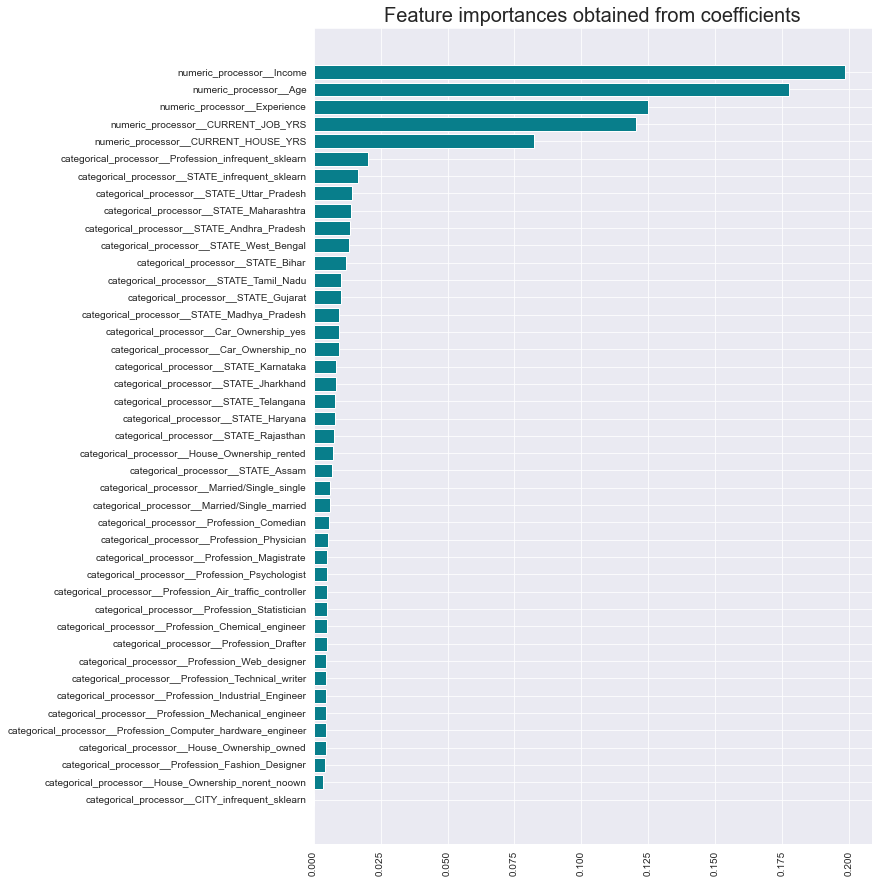

In [205]:
plt.figure(figsize = (10,15))
plt.barh(y=importances['Feature'], width=importances['Importance'], color='#087E8B')
plt.title('Feature importances obtained from coefficients', size=20)
plt.xticks(rotation='vertical')
plt.show()

In [206]:
X_train_FE.nunique().sort_values(ascending=False)

numeric_processor__Income                                       41368
numeric_processor__Age                                             59
numeric_processor__Experience                                      21
numeric_processor__CURRENT_JOB_YRS                                 15
numeric_processor__CURRENT_HOUSE_YRS                                5
categorical_processor__STATE_Jharkhand                              2
categorical_processor__Profession_Web_designer                      2
categorical_processor__Profession_infrequent_sklearn                2
categorical_processor__STATE_Andhra_Pradesh                         2
categorical_processor__STATE_Assam                                  2
categorical_processor__STATE_Bihar                                  2
categorical_processor__STATE_Gujarat                                2
categorical_processor__STATE_Haryana                                2
categorical_processor__STATE_Madhya_Pradesh                         2
categorical_processo

## Feature Selection

### Techniques for feature selection
1. Mutual Information - to get the feature importance 
2. Multicollinearity - to check and remove any highly correlated independent features
3. VarianceThreshold - To check and remove any low varinace continuous features

## Multicollinearity

### Correlation

In [207]:
total_train_df

,Income,Age,Experience,Married/Single,House_Ownership,Car_Ownership,Profession,CITY,STATE,CURRENT_JOB_YRS,CURRENT_HOUSE_YRS,target
0,1303834,23,3,single,rented,no,Mechanical_engineer,Rewa,Madhya_Pradesh,3,13,0
1,7574516,40,10,single,rented,no,Software_Developer,Parbhani,Maharashtra,9,13,0
2,3991815,66,4,married,rented,no,Technical_writer,Alappuzha,Kerala,4,10,0
3,6256451,41,2,single,rented,yes,Software_Developer,Bhubaneswar,Odisha,2,12,1
4,5768871,47,11,single,rented,no,Civil_servant,Tiruchirappalli[10],Tamil_Nadu,3,14,1
...,...,...,...,...,...,...,...,...,...,...,...,...
247995,8154883,43,13,single,rented,no,Surgeon,Kolkata,West_Bengal,6,11,0
247996,2843572,26,10,single,rented,no,Army_officer,Rewa,Madhya_Pradesh,6,11,0
247997,4522448,46,7,single,rented,no,Design_Engineer,Kalyan-Dombivli,Maharashtra,7,12,0
247998,6507128,45,0,single,rented,no,Graphic_Designer,Pondicherry,Puducherry,0,10,0


In [208]:
total_train_df.corr()

,Income,Age,Experience,CURRENT_JOB_YRS,CURRENT_HOUSE_YRS,target
Income,1.000000,-0.000614,0.005785,0.006777,-0.002452,-0.002939
Age,-0.000614,1.000000,-0.001312,0.001687,-0.020666,-0.021788
Experience,0.005785,-0.001312,1.000000,0.646134,0.019534,-0.033914
CURRENT_JOB_YRS,0.006777,0.001687,0.646134,1.000000,0.005460,-0.016517
CURRENT_HOUSE_YRS,-0.002452,-0.020666,0.019534,0.005460,1.000000,-0.004306
target,-0.002939,-0.021788,-0.033914,-0.016517,-0.004306,1.000000


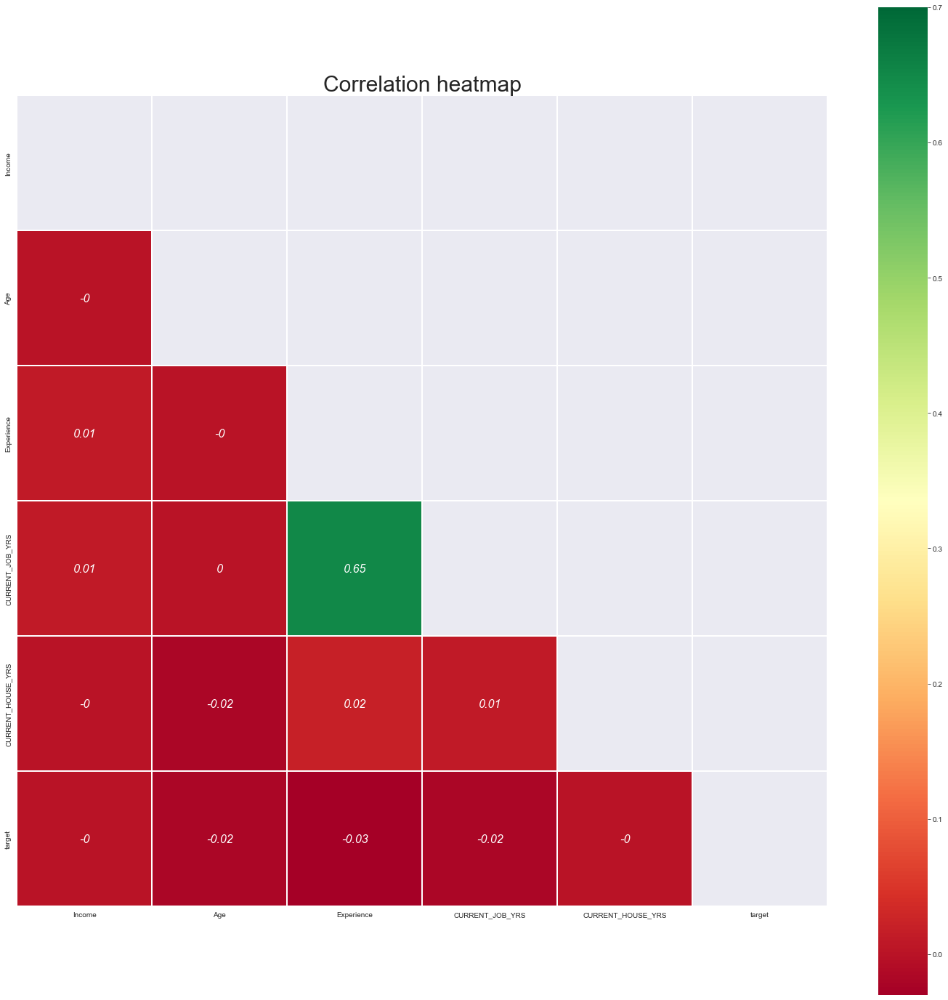

In [209]:
# Finds correlation between Independent and dependent attributes

mask = np.zeros_like(total_train_df.corr(),dtype = np.bool_)
mask[np.triu_indices_from(mask)] = True

f, ax = plt.subplots(figsize = (25,25))
plt.title('Correlation heatmap', fontsize = 30)

sns.heatmap(np.round_(total_train_df.corr(),decimals=2),cmap='RdYlGn',linewidths=0.25,square=True,annot=True,
            vmax=0.7,linecolor='w',annot_kws={'size':16,'style':'oblique'},mask=mask)

plt.show()

In [210]:
# with the following function we can select highly correlated features
# it will remove the first feature that is correlated with anything other feature

def correlation(dataset, threshold):
    col_corr = set()  # Set of all the names of correlated columns
    corr_matrix = dataset.corr()
    for i in range(len(corr_matrix.columns)):
        for j in range(i):
            if abs(corr_matrix.iloc[i, j]) > threshold: # we are interested in absolute coeff value
                colname = corr_matrix.columns[i]  # getting the name of column
                col_corr.add(colname)
    return col_corr

In [211]:
corr_features = correlation(X_train_balanced, 0.8)
print(len(set(corr_features)))
print(corr_features)

2
{'categorical_processor__Married/Single_single', 'categorical_processor__Car_Ownership_yes'}


In [212]:
# See there are 2 features with correlataion more than 0.8

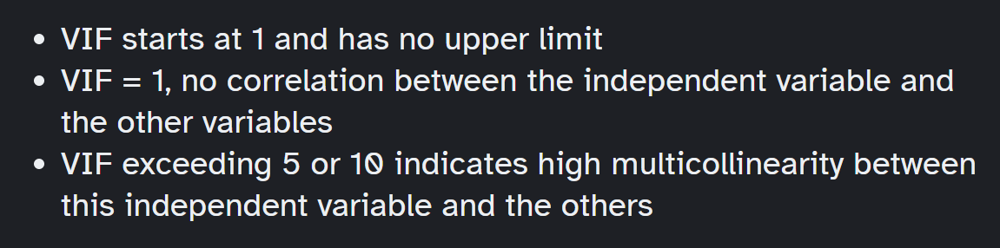

### Variance Inflation Factor (VIF)

https://www.analyticsvidhya.com/blog/2020/03/what-is-multicollinearity/

In [213]:
# VIF dataframe
vif_data = pd.DataFrame()
vif_data["feature"] = X_train_balanced.columns

# calculating VIF for each feature
vif_data["VIF"] = [variance_inflation_factor(X_train_balanced.values, i) for i in range(len(X_train_balanced.columns))]

vif_data = vif_data.sort_values(by='VIF', ascending=False)
vif_data

,feature,VIF
17,categorical_processor__Profession_Fashion_Desi...,1.674201e+13
18,categorical_processor__Profession_Industrial_E...,1.196175e+13
24,categorical_processor__Profession_Technical_wr...,9.285772e+12
21,categorical_processor__Profession_Physician,6.028915e+12
25,categorical_processor__Profession_Web_designer,5.925789e+12
22,categorical_processor__Profession_Psychologist,5.167642e+12
12,categorical_processor__Profession_Air_traffic_...,4.588487e+12
16,categorical_processor__Profession_Drafter,4.322073e+12
20,categorical_processor__Profession_Mechanical_e...,2.088384e+12
8,categorical_processor__House_Ownership_owned,1.952569e+12


#### From above VIF_features are having high VIF values

In [214]:
VIF_features = ['categorical_processor__Profession_Mechanical_engineer','categorical_processor__House_Ownership_norent_noown',
                'categorical_processor__Married/Single_married','categorical_processor__Car_Ownership_yes',
                'categorical_processor__Profession_infrequent_sklearn']

In [215]:
# VIF dataframe
vif_data = pd.DataFrame()
vif_data["feature"] = X_train_balanced.drop(VIF_features, axis = 1).columns

# calculating VIF for each feature
vif_data["VIF"] = [variance_inflation_factor(X_train_balanced.drop(VIF_features, axis = 1).values, i) for i in range(len(X_train_balanced.drop(VIF_features, axis = 1).columns))]

vif_data = vif_data.sort_values(by='VIF', ascending=False)
vif_data

,feature,VIF
7,categorical_processor__House_Ownership_rented,2.642581
6,categorical_processor__House_Ownership_owned,2.638377
3,numeric_processor__CURRENT_JOB_YRS,1.874890
2,numeric_processor__Experience,1.867294
37,categorical_processor__STATE_infrequent_sklearn,1.141164
35,categorical_processor__STATE_Uttar_Pradesh,1.122547
36,categorical_processor__STATE_West_Bengal,1.102263
31,categorical_processor__STATE_Maharashtra,1.096658
23,categorical_processor__STATE_Andhra_Pradesh,1.087000
25,categorical_processor__STATE_Bihar,1.077868


In [216]:
vif_data.shape

(38, 2)

In [217]:
X_train_balanced

,numeric_processor__Income,numeric_processor__Age,numeric_processor__Experience,numeric_processor__CURRENT_JOB_YRS,numeric_processor__CURRENT_HOUSE_YRS,categorical_processor__Married/Single_married,categorical_processor__Married/Single_single,categorical_processor__House_Ownership_norent_noown,categorical_processor__House_Ownership_owned,categorical_processor__House_Ownership_rented,categorical_processor__Car_Ownership_no,categorical_processor__Car_Ownership_yes,categorical_processor__Profession_Air_traffic_controller,categorical_processor__Profession_Chemical_engineer,categorical_processor__Profession_Comedian,categorical_processor__Profession_Computer_hardware_engineer,categorical_processor__Profession_Drafter,categorical_processor__Profession_Fashion_Designer,categorical_processor__Profession_Industrial_Engineer,categorical_processor__Profession_Magistrate,categorical_processor__Profession_Mechanical_engineer,categorical_processor__Profession_Physician,categorical_processor__Profession_Psychologist,categorical_processor__Profession_Statistician,categorical_processor__Profession_Technical_writer,categorical_processor__Profession_Web_designer,categorical_processor__Profession_infrequent_sklearn,categorical_processor__CITY_infrequent_sklearn,categorical_processor__STATE_Andhra_Pradesh,categorical_processor__STATE_Assam,categorical_processor__STATE_Bihar,categorical_processor__STATE_Gujarat,categorical_processor__STATE_Haryana,categorical_processor__STATE_Jharkhand,categorical_processor__STATE_Karnataka,categorical_processor__STATE_Madhya_Pradesh,categorical_processor__STATE_Maharashtra,categorical_processor__STATE_Rajasthan,categorical_processor__STATE_Tamil_Nadu,categorical_processor__STATE_Telangana,categorical_processor__STATE_Uttar_Pradesh,categorical_processor__STATE_West_Bengal,categorical_processor__STATE_infrequent_sklearn
0,-0.853416,-1.270397,-0.781219,-0.582344,0.498371,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,-1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.519959,-0.333526,0.000000,0.417656,0.498371,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
2,-0.191501,0.550459,-0.637891,-0.350611,-4.834394,1.0,-1.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,-1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
3,0.239849,-0.296938,-0.945122,-0.815872,0.000000,0.0,0.0,0.0,0.0,0.0,-1.000000,1.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
4,0.149439,-0.099882,0.087909,-0.582344,4.855438,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
434987,-1.296352,1.449560,-0.398391,0.000000,-0.501629,0.0,0.0,0.0,0.0,0.0,-1.000000,1.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
434988,0.649602,0.870605,-1.166676,-1.002866,0.498371,0.0,0.0,0.0,0.0,0.0,-1.000000,1.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
434989,-0.081851,0.783293,0.416457,0.704337,4.855438,0.0,0.0,0.0,0.0,0.0,-0.097272,0.097272,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,-1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
434990,0.359789,-0.386123,0.388056,0.128057,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0


In [218]:
X_train_multi = X_train_balanced.drop(VIF_features, axis = 1)

In [219]:
X_val_multi = X_val_FE.drop(VIF_features, axis = 1)

In [220]:
X_test_multi = X_test_FE.drop(VIF_features, axis = 1)

In [221]:
X_train_multi

,numeric_processor__Income,numeric_processor__Age,numeric_processor__Experience,numeric_processor__CURRENT_JOB_YRS,numeric_processor__CURRENT_HOUSE_YRS,categorical_processor__Married/Single_single,categorical_processor__House_Ownership_owned,categorical_processor__House_Ownership_rented,categorical_processor__Car_Ownership_no,categorical_processor__Profession_Air_traffic_controller,categorical_processor__Profession_Chemical_engineer,categorical_processor__Profession_Comedian,categorical_processor__Profession_Computer_hardware_engineer,categorical_processor__Profession_Drafter,categorical_processor__Profession_Fashion_Designer,categorical_processor__Profession_Industrial_Engineer,categorical_processor__Profession_Magistrate,categorical_processor__Profession_Physician,categorical_processor__Profession_Psychologist,categorical_processor__Profession_Statistician,categorical_processor__Profession_Technical_writer,categorical_processor__Profession_Web_designer,categorical_processor__CITY_infrequent_sklearn,categorical_processor__STATE_Andhra_Pradesh,categorical_processor__STATE_Assam,categorical_processor__STATE_Bihar,categorical_processor__STATE_Gujarat,categorical_processor__STATE_Haryana,categorical_processor__STATE_Jharkhand,categorical_processor__STATE_Karnataka,categorical_processor__STATE_Madhya_Pradesh,categorical_processor__STATE_Maharashtra,categorical_processor__STATE_Rajasthan,categorical_processor__STATE_Tamil_Nadu,categorical_processor__STATE_Telangana,categorical_processor__STATE_Uttar_Pradesh,categorical_processor__STATE_West_Bengal,categorical_processor__STATE_infrequent_sklearn
0,-0.853416,-1.270397,-0.781219,-0.582344,0.498371,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.519959,-0.333526,0.000000,0.417656,0.498371,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
2,-0.191501,0.550459,-0.637891,-0.350611,-4.834394,-1.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
3,0.239849,-0.296938,-0.945122,-0.815872,0.000000,0.0,0.0,0.0,-1.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
4,0.149439,-0.099882,0.087909,-0.582344,4.855438,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
434987,-1.296352,1.449560,-0.398391,0.000000,-0.501629,0.0,0.0,0.0,-1.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
434988,0.649602,0.870605,-1.166676,-1.002866,0.498371,0.0,0.0,0.0,-1.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
434989,-0.081851,0.783293,0.416457,0.704337,4.855438,0.0,0.0,0.0,-0.097272,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
434990,0.359789,-0.386123,0.388056,0.128057,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0


In [222]:
X_val_multi

,numeric_processor__Income,numeric_processor__Age,numeric_processor__Experience,numeric_processor__CURRENT_JOB_YRS,numeric_processor__CURRENT_HOUSE_YRS,categorical_processor__Married/Single_single,categorical_processor__House_Ownership_owned,categorical_processor__House_Ownership_rented,categorical_processor__Car_Ownership_no,categorical_processor__Profession_Air_traffic_controller,categorical_processor__Profession_Chemical_engineer,categorical_processor__Profession_Comedian,categorical_processor__Profession_Computer_hardware_engineer,categorical_processor__Profession_Drafter,categorical_processor__Profession_Fashion_Designer,categorical_processor__Profession_Industrial_Engineer,categorical_processor__Profession_Magistrate,categorical_processor__Profession_Physician,categorical_processor__Profession_Psychologist,categorical_processor__Profession_Statistician,categorical_processor__Profession_Technical_writer,categorical_processor__Profession_Web_designer,categorical_processor__CITY_infrequent_sklearn,categorical_processor__STATE_Andhra_Pradesh,categorical_processor__STATE_Assam,categorical_processor__STATE_Bihar,categorical_processor__STATE_Gujarat,categorical_processor__STATE_Haryana,categorical_processor__STATE_Jharkhand,categorical_processor__STATE_Karnataka,categorical_processor__STATE_Madhya_Pradesh,categorical_processor__STATE_Maharashtra,categorical_processor__STATE_Rajasthan,categorical_processor__STATE_Tamil_Nadu,categorical_processor__STATE_Telangana,categorical_processor__STATE_Uttar_Pradesh,categorical_processor__STATE_West_Bengal,categorical_processor__STATE_infrequent_sklearn
0,1.018711,-0.974656,-0.781219,-0.582344,0.000000,-1.0,0.0,0.0,-1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
1,-0.271478,-0.833138,-0.398391,0.000000,0.498371,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,2.012910,3.853889,1.165249,0.146243,-0.501629,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
3,0.568716,0.808381,0.489062,0.417656,4.855438,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
4,-1.520386,1.167875,-0.199580,-0.582344,4.855438,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1995,-0.159412,0.322163,-0.945122,-0.815872,-0.501629,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
1996,0.651639,0.052194,-1.166676,-1.002866,0.498371,0.0,0.0,0.0,-1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
1997,0.113988,-0.682045,0.279232,1.098198,-0.501629,0.0,0.0,0.0,-1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
1998,0.470737,0.249761,-0.945122,-0.815872,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0


In [223]:
X_test_multi

,numeric_processor__Income,numeric_processor__Age,numeric_processor__Experience,numeric_processor__CURRENT_JOB_YRS,numeric_processor__CURRENT_HOUSE_YRS,categorical_processor__Married/Single_single,categorical_processor__House_Ownership_owned,categorical_processor__House_Ownership_rented,categorical_processor__Car_Ownership_no,categorical_processor__Profession_Air_traffic_controller,categorical_processor__Profession_Chemical_engineer,categorical_processor__Profession_Comedian,categorical_processor__Profession_Computer_hardware_engineer,categorical_processor__Profession_Drafter,categorical_processor__Profession_Fashion_Designer,categorical_processor__Profession_Industrial_Engineer,categorical_processor__Profession_Magistrate,categorical_processor__Profession_Physician,categorical_processor__Profession_Psychologist,categorical_processor__Profession_Statistician,categorical_processor__Profession_Technical_writer,categorical_processor__Profession_Web_designer,categorical_processor__CITY_infrequent_sklearn,categorical_processor__STATE_Andhra_Pradesh,categorical_processor__STATE_Assam,categorical_processor__STATE_Bihar,categorical_processor__STATE_Gujarat,categorical_processor__STATE_Haryana,categorical_processor__STATE_Jharkhand,categorical_processor__STATE_Karnataka,categorical_processor__STATE_Madhya_Pradesh,categorical_processor__STATE_Maharashtra,categorical_processor__STATE_Rajasthan,categorical_processor__STATE_Tamil_Nadu,categorical_processor__STATE_Telangana,categorical_processor__STATE_Uttar_Pradesh,categorical_processor__STATE_West_Bengal,categorical_processor__STATE_infrequent_sklearn
0,-0.282442,-0.833138,0.489062,0.563263,-4.834394,0.0,0.0,0.0,-1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.719259,0.114092,-0.945122,-0.815872,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
2,-0.426136,-0.782954,-0.510938,-0.165490,-4.834394,0.0,0.0,0.0,-1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
3,-0.678908,0.148178,0.179098,0.887890,-4.834394,0.0,0.0,-1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,-0.135426,-0.296938,-0.199580,0.282236,-0.501629,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1995,-0.259331,-0.900792,1.165249,1.098198,-0.501629,0.0,0.0,0.0,-1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
1996,0.390078,3.853889,0.000000,-0.582344,4.855438,0.0,0.0,0.0,-1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
1997,-0.551327,-0.730070,-0.398391,0.000000,0.498371,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
1998,0.282545,-0.730070,0.000000,0.563263,-4.834394,0.0,0.0,0.0,-1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [224]:
model = RandomForestClassifier()
model.fit(X_train_multi,y_train_balanced)

RandomForestClassifier()

In [225]:
model.feature_names_in_

array(['numeric_processor__Income', 'numeric_processor__Age',
       'numeric_processor__Experience',
       'numeric_processor__CURRENT_JOB_YRS',
       'numeric_processor__CURRENT_HOUSE_YRS',
       'categorical_processor__Married/Single_single',
       'categorical_processor__House_Ownership_owned',
       'categorical_processor__House_Ownership_rented',
       'categorical_processor__Car_Ownership_no',
       'categorical_processor__Profession_Air_traffic_controller',
       'categorical_processor__Profession_Chemical_engineer',
       'categorical_processor__Profession_Comedian',
       'categorical_processor__Profession_Computer_hardware_engineer',
       'categorical_processor__Profession_Drafter',
       'categorical_processor__Profession_Fashion_Designer',
       'categorical_processor__Profession_Industrial_Engineer',
       'categorical_processor__Profession_Magistrate',
       'categorical_processor__Profession_Physician',
       'categorical_processor__Profession_Psycholog

In [226]:
y_train_pred = model.predict(X_train_multi)
    
print(classification_report(y_train_balanced,y_train_pred))

              precision    recall  f1-score   support

           0       1.00      0.91      0.96    217496
           1       0.92      1.00      0.96    217496

    accuracy                           0.96    434992
   macro avg       0.96      0.96      0.96    434992
weighted avg       0.96      0.96      0.96    434992



In [227]:
y_val_pred = model.predict(X_val_multi)
    
print(classification_report(y_val,y_val_pred))

              precision    recall  f1-score   support

           0       0.97      0.92      0.94      1745
           1       0.59      0.77      0.67       255

    accuracy                           0.90      2000
   macro avg       0.78      0.85      0.81      2000
weighted avg       0.92      0.90      0.91      2000



#### See even if we remove 5 features we are able to get the same results and there is no impact on the performance of the Model

### VarianceThreshold

In [228]:
X_train_balanced

,numeric_processor__Income,numeric_processor__Age,numeric_processor__Experience,numeric_processor__CURRENT_JOB_YRS,numeric_processor__CURRENT_HOUSE_YRS,categorical_processor__Married/Single_married,categorical_processor__Married/Single_single,categorical_processor__House_Ownership_norent_noown,categorical_processor__House_Ownership_owned,categorical_processor__House_Ownership_rented,categorical_processor__Car_Ownership_no,categorical_processor__Car_Ownership_yes,categorical_processor__Profession_Air_traffic_controller,categorical_processor__Profession_Chemical_engineer,categorical_processor__Profession_Comedian,categorical_processor__Profession_Computer_hardware_engineer,categorical_processor__Profession_Drafter,categorical_processor__Profession_Fashion_Designer,categorical_processor__Profession_Industrial_Engineer,categorical_processor__Profession_Magistrate,categorical_processor__Profession_Mechanical_engineer,categorical_processor__Profession_Physician,categorical_processor__Profession_Psychologist,categorical_processor__Profession_Statistician,categorical_processor__Profession_Technical_writer,categorical_processor__Profession_Web_designer,categorical_processor__Profession_infrequent_sklearn,categorical_processor__CITY_infrequent_sklearn,categorical_processor__STATE_Andhra_Pradesh,categorical_processor__STATE_Assam,categorical_processor__STATE_Bihar,categorical_processor__STATE_Gujarat,categorical_processor__STATE_Haryana,categorical_processor__STATE_Jharkhand,categorical_processor__STATE_Karnataka,categorical_processor__STATE_Madhya_Pradesh,categorical_processor__STATE_Maharashtra,categorical_processor__STATE_Rajasthan,categorical_processor__STATE_Tamil_Nadu,categorical_processor__STATE_Telangana,categorical_processor__STATE_Uttar_Pradesh,categorical_processor__STATE_West_Bengal,categorical_processor__STATE_infrequent_sklearn
0,-0.853416,-1.270397,-0.781219,-0.582344,0.498371,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,-1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.519959,-0.333526,0.000000,0.417656,0.498371,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
2,-0.191501,0.550459,-0.637891,-0.350611,-4.834394,1.0,-1.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,-1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
3,0.239849,-0.296938,-0.945122,-0.815872,0.000000,0.0,0.0,0.0,0.0,0.0,-1.000000,1.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
4,0.149439,-0.099882,0.087909,-0.582344,4.855438,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
434987,-1.296352,1.449560,-0.398391,0.000000,-0.501629,0.0,0.0,0.0,0.0,0.0,-1.000000,1.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
434988,0.649602,0.870605,-1.166676,-1.002866,0.498371,0.0,0.0,0.0,0.0,0.0,-1.000000,1.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
434989,-0.081851,0.783293,0.416457,0.704337,4.855438,0.0,0.0,0.0,0.0,0.0,-0.097272,0.097272,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,-1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
434990,0.359789,-0.386123,0.388056,0.128057,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0


In [229]:
# In this technique we will find the varince of all the features and we can remove the features which have low variance 
# by setting the threshold parameter

var_thres=VarianceThreshold()
var_thres.fit(X_train_balanced)

VarianceThreshold()

In [230]:
variances = pd.DataFrame(data={
    'Feature': X_train_balanced.columns,
    'variance': var_thres.variances_
})
variances = variances.sort_values(by='variance', ascending=True)

In [231]:
variances

,Feature,variance
27,categorical_processor__CITY_infrequent_sklearn,0.000000
18,categorical_processor__Profession_Industrial_E...,0.017859
20,categorical_processor__Profession_Mechanical_e...,0.018708
13,categorical_processor__Profession_Chemical_eng...,0.018813
25,categorical_processor__Profession_Web_designer,0.019310
17,categorical_processor__Profession_Fashion_Desi...,0.019323
14,categorical_processor__Profession_Comedian,0.019455
16,categorical_processor__Profession_Drafter,0.019501
19,categorical_processor__Profession_Magistrate,0.019699
22,categorical_processor__Profession_Psychologist,0.019890


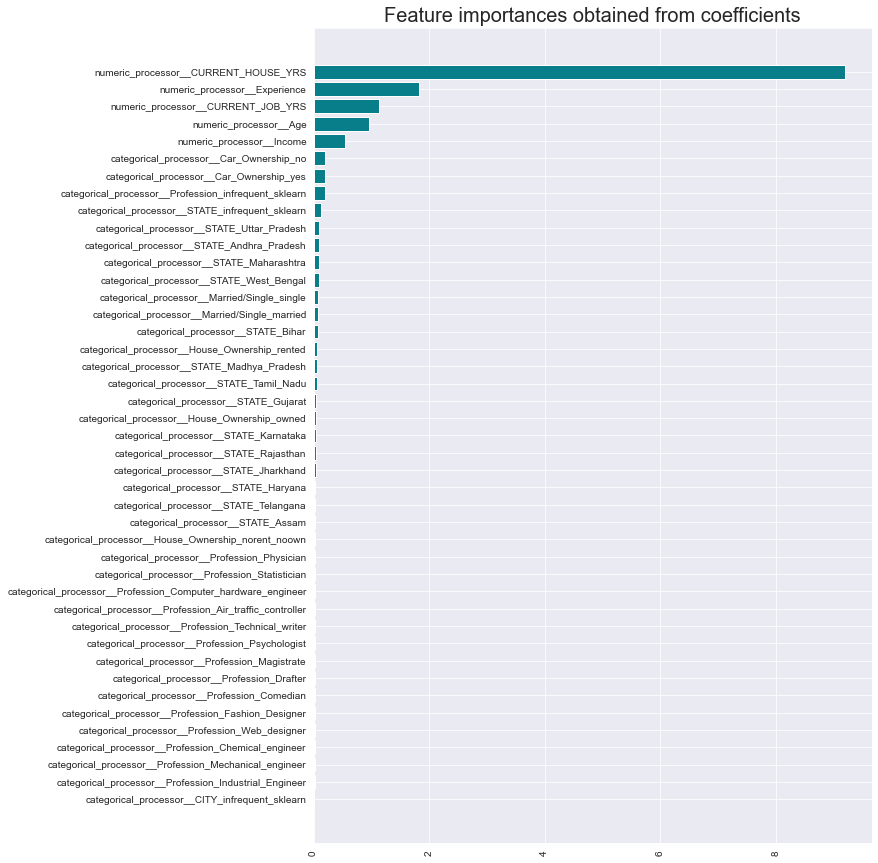

In [232]:
plt.figure(figsize = (10,15))
plt.barh(y=variances['Feature'], width=variances['variance'], color='#087E8B')
plt.title('Feature importances obtained from coefficients', size=20)
plt.xticks(rotation='vertical')
plt.show()

In [233]:
variances['Feature'].values[-5:].tolist()

['numeric_processor__Income',
 'numeric_processor__Age',
 'numeric_processor__CURRENT_JOB_YRS',
 'numeric_processor__Experience',
 'numeric_processor__CURRENT_HOUSE_YRS']

In [234]:
X_train_balanced[variances['Feature'].values[-5:].tolist()]

,numeric_processor__Income,numeric_processor__Age,numeric_processor__CURRENT_JOB_YRS,numeric_processor__Experience,numeric_processor__CURRENT_HOUSE_YRS
0,-0.853416,-1.270397,-0.582344,-0.781219,0.498371
1,0.519959,-0.333526,0.417656,0.000000,0.498371
2,-0.191501,0.550459,-0.350611,-0.637891,-4.834394
3,0.239849,-0.296938,-0.815872,-0.945122,0.000000
4,0.149439,-0.099882,-0.582344,0.087909,4.855438
...,...,...,...,...,...
434987,-1.296352,1.449560,0.000000,-0.398391,-0.501629
434988,0.649602,0.870605,-1.002866,-1.166676,0.498371
434989,-0.081851,0.783293,0.704337,0.416457,4.855438
434990,0.359789,-0.386123,0.128057,0.388056,0.000000


In [235]:
y_train_balanced

0         0
1         0
2         0
3         1
4         1
         ..
434987    1
434988    1
434989    1
434990    1
434991    1
Name: target, Length: 434992, dtype: int64

In [236]:
model = RandomForestClassifier()
model.fit(X_train_balanced[variances['Feature'].values[-5:].tolist()],y_train_balanced)

RandomForestClassifier()

In [237]:
model.feature_names_in_

array(['numeric_processor__Income', 'numeric_processor__Age',
       'numeric_processor__CURRENT_JOB_YRS',
       'numeric_processor__Experience',
       'numeric_processor__CURRENT_HOUSE_YRS'], dtype=object)

In [238]:
y_train_pred = model.predict(X_train_balanced[variances['Feature'].values[-5:].tolist()])
    
print(classification_report(y_train_balanced,y_train_pred))

              precision    recall  f1-score   support

           0       1.00      0.91      0.96    217496
           1       0.92      1.00      0.96    217496

    accuracy                           0.96    434992
   macro avg       0.96      0.96      0.96    434992
weighted avg       0.96      0.96      0.96    434992



In [239]:
y_val_pred = model.predict(X_val_FE[variances['Feature'].values[-5:].tolist()])
    
print(classification_report(y_val,y_val_pred))

              precision    recall  f1-score   support

           0       0.97      0.91      0.94      1745
           1       0.56      0.78      0.65       255

    accuracy                           0.90      2000
   macro avg       0.76      0.84      0.80      2000
weighted avg       0.91      0.90      0.90      2000



#### See with just 4 features having high variance we are able to get the 90 accurcy. using the technique VarianceThreshold

### Mutual Information for Classification

In [240]:
mutual_info = mutual_info_classif(X_train_balanced, y_train_balanced)
mutual_info

array([3.91585974e-01, 7.48421801e-02, 6.25599216e-02, 5.90396122e-02,
       2.22943214e-02, 3.66658576e-03, 3.98085162e-03, 1.55318434e-03,
       3.82812319e-03, 5.82692565e-03, 1.46403761e-02, 1.43178552e-02,
       1.57841343e-03, 1.35183333e-03, 8.21865265e-04, 1.74981565e-03,
       1.40164731e-03, 5.63516488e-04, 1.67523725e-03, 2.30531511e-03,
       1.51275865e-03, 1.93399663e-03, 1.91619428e-03, 2.09686128e-03,
       2.70474976e-04, 1.02213393e-03, 2.15172774e-02, 0.00000000e+00,
       2.57130828e-03, 0.00000000e+00, 2.08059157e-03, 9.51349609e-04,
       2.56687817e-03, 1.45962527e-03, 1.93985431e-03, 4.00983471e-03,
       3.50539581e-03, 1.80297008e-03, 2.60154577e-03, 1.49840532e-03,
       2.74036816e-03, 4.03899394e-03, 5.17686889e-03])

In [241]:
mutual_info_df = pd.DataFrame(data={
    'Feature': X_train_balanced.columns,
    'MI': mutual_info
})
mutual_info_df = mutual_info_df.sort_values(by='MI', ascending=True)

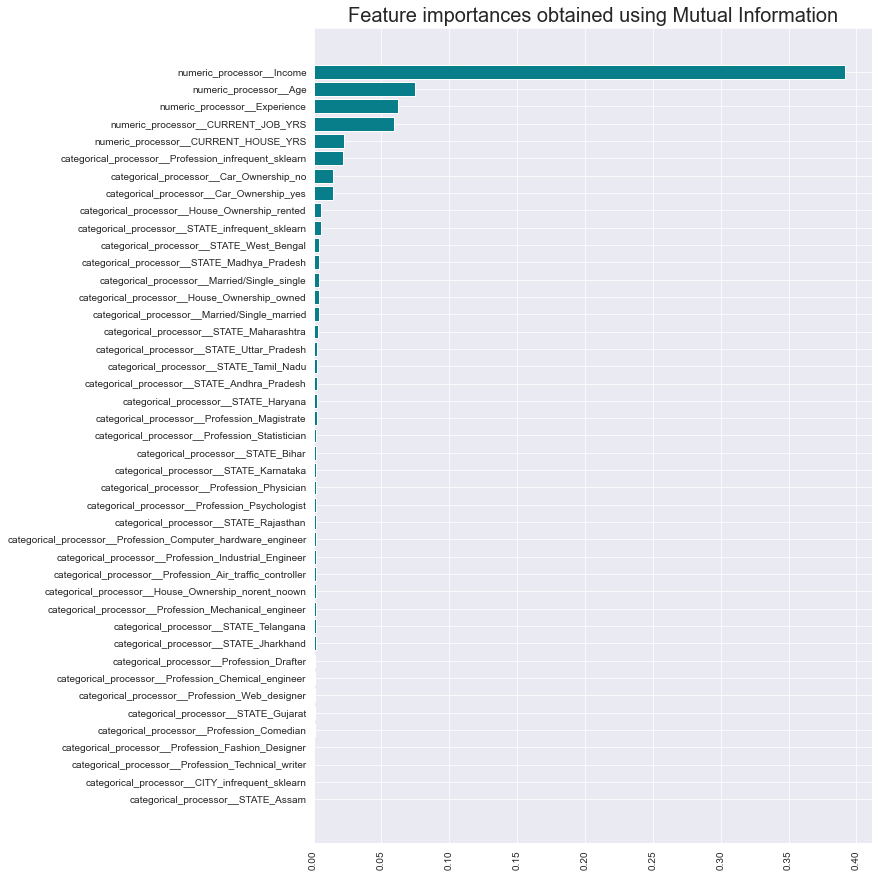

In [242]:
plt.figure(figsize = (10,15))
plt.barh(y=mutual_info_df['Feature'], width=mutual_info_df['MI'], color='#087E8B')
plt.title('Feature importances obtained using Mutual Information', size=20)
plt.xticks(rotation='vertical')
plt.show()

In [243]:
mutual_info_df

,Feature,MI
29,categorical_processor__STATE_Assam,0.000000
27,categorical_processor__CITY_infrequent_sklearn,0.000000
24,categorical_processor__Profession_Technical_wr...,0.000270
17,categorical_processor__Profession_Fashion_Desi...,0.000564
14,categorical_processor__Profession_Comedian,0.000822
31,categorical_processor__STATE_Gujarat,0.000951
25,categorical_processor__Profession_Web_designer,0.001022
13,categorical_processor__Profession_Chemical_eng...,0.001352
16,categorical_processor__Profession_Drafter,0.001402
33,categorical_processor__STATE_Jharkhand,0.001460


In [244]:
mutual_info_df['Feature'].values[-5:].tolist()

['numeric_processor__CURRENT_HOUSE_YRS',
 'numeric_processor__CURRENT_JOB_YRS',
 'numeric_processor__Experience',
 'numeric_processor__Age',
 'numeric_processor__Income']

In [245]:
#### We are seeing the same features as above.

## PCA

In [246]:
# we are not going to do PCA because we are having few features only.

## Building the final Model

In [247]:
X_train_balanced

,numeric_processor__Income,numeric_processor__Age,numeric_processor__Experience,numeric_processor__CURRENT_JOB_YRS,numeric_processor__CURRENT_HOUSE_YRS,categorical_processor__Married/Single_married,categorical_processor__Married/Single_single,categorical_processor__House_Ownership_norent_noown,categorical_processor__House_Ownership_owned,categorical_processor__House_Ownership_rented,categorical_processor__Car_Ownership_no,categorical_processor__Car_Ownership_yes,categorical_processor__Profession_Air_traffic_controller,categorical_processor__Profession_Chemical_engineer,categorical_processor__Profession_Comedian,categorical_processor__Profession_Computer_hardware_engineer,categorical_processor__Profession_Drafter,categorical_processor__Profession_Fashion_Designer,categorical_processor__Profession_Industrial_Engineer,categorical_processor__Profession_Magistrate,categorical_processor__Profession_Mechanical_engineer,categorical_processor__Profession_Physician,categorical_processor__Profession_Psychologist,categorical_processor__Profession_Statistician,categorical_processor__Profession_Technical_writer,categorical_processor__Profession_Web_designer,categorical_processor__Profession_infrequent_sklearn,categorical_processor__CITY_infrequent_sklearn,categorical_processor__STATE_Andhra_Pradesh,categorical_processor__STATE_Assam,categorical_processor__STATE_Bihar,categorical_processor__STATE_Gujarat,categorical_processor__STATE_Haryana,categorical_processor__STATE_Jharkhand,categorical_processor__STATE_Karnataka,categorical_processor__STATE_Madhya_Pradesh,categorical_processor__STATE_Maharashtra,categorical_processor__STATE_Rajasthan,categorical_processor__STATE_Tamil_Nadu,categorical_processor__STATE_Telangana,categorical_processor__STATE_Uttar_Pradesh,categorical_processor__STATE_West_Bengal,categorical_processor__STATE_infrequent_sklearn
0,-0.853416,-1.270397,-0.781219,-0.582344,0.498371,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,-1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.519959,-0.333526,0.000000,0.417656,0.498371,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
2,-0.191501,0.550459,-0.637891,-0.350611,-4.834394,1.0,-1.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,-1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
3,0.239849,-0.296938,-0.945122,-0.815872,0.000000,0.0,0.0,0.0,0.0,0.0,-1.000000,1.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
4,0.149439,-0.099882,0.087909,-0.582344,4.855438,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
434987,-1.296352,1.449560,-0.398391,0.000000,-0.501629,0.0,0.0,0.0,0.0,0.0,-1.000000,1.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
434988,0.649602,0.870605,-1.166676,-1.002866,0.498371,0.0,0.0,0.0,0.0,0.0,-1.000000,1.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
434989,-0.081851,0.783293,0.416457,0.704337,4.855438,0.0,0.0,0.0,0.0,0.0,-0.097272,0.097272,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,-1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
434990,0.359789,-0.386123,0.388056,0.128057,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0


In [248]:
y_train_balanced

0         0
1         0
2         0
3         1
4         1
         ..
434987    1
434988    1
434989    1
434990    1
434991    1
Name: target, Length: 434992, dtype: int64

In [249]:
final_pipe

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('numeric_processor',
                                                  Pipeline(steps=[('imputation_mean',
                                                                   SimpleImputer(add_indicator=True,
                                                                                 strategy='median')),
                                                                  ('quantiletransformer',
                                                                   QuantileTransformer(output_distribution='normal'))]),
                                                  ['Income', 'Age',
                                                   'Experience',
                                                   'CURRENT_JOB_YRS',
                                                   'CURRENT_HOUSE_YRS']),
                                                 ('categorical_processor',
                                                  Pipeline(steps=[('imputation_consatnt',
                                                                   SimpleImputer(fill_value='missing',
                                                                                 strategy='constant')),
                                                                  ('onehotencoder',
                                                                   OneHotEncoder(handle_unknown='ignore',
                                                                                 max_categories=15,
                                                                                 min_frequency=0.01,
                                                                                 sparse_output=False))]),
                                                  ['Married/Single',
                                                   'House_Ownership',
                                                   'Car_Ownership',
                                                   'Profession', 'CITY',
                                                   'STATE'])])),
                ('scaler', RobustScaler())])

In [250]:
model = RandomForestClassifier()

In [251]:
model.fit(X_train_balanced,y_train_balanced)

RandomForestClassifier()

In [252]:
X_val_FE

,numeric_processor__Income,numeric_processor__Age,numeric_processor__Experience,numeric_processor__CURRENT_JOB_YRS,numeric_processor__CURRENT_HOUSE_YRS,categorical_processor__Married/Single_married,categorical_processor__Married/Single_single,categorical_processor__House_Ownership_norent_noown,categorical_processor__House_Ownership_owned,categorical_processor__House_Ownership_rented,categorical_processor__Car_Ownership_no,categorical_processor__Car_Ownership_yes,categorical_processor__Profession_Air_traffic_controller,categorical_processor__Profession_Chemical_engineer,categorical_processor__Profession_Comedian,categorical_processor__Profession_Computer_hardware_engineer,categorical_processor__Profession_Drafter,categorical_processor__Profession_Fashion_Designer,categorical_processor__Profession_Industrial_Engineer,categorical_processor__Profession_Magistrate,categorical_processor__Profession_Mechanical_engineer,categorical_processor__Profession_Physician,categorical_processor__Profession_Psychologist,categorical_processor__Profession_Statistician,categorical_processor__Profession_Technical_writer,categorical_processor__Profession_Web_designer,categorical_processor__Profession_infrequent_sklearn,categorical_processor__CITY_infrequent_sklearn,categorical_processor__STATE_Andhra_Pradesh,categorical_processor__STATE_Assam,categorical_processor__STATE_Bihar,categorical_processor__STATE_Gujarat,categorical_processor__STATE_Haryana,categorical_processor__STATE_Jharkhand,categorical_processor__STATE_Karnataka,categorical_processor__STATE_Madhya_Pradesh,categorical_processor__STATE_Maharashtra,categorical_processor__STATE_Rajasthan,categorical_processor__STATE_Tamil_Nadu,categorical_processor__STATE_Telangana,categorical_processor__STATE_Uttar_Pradesh,categorical_processor__STATE_West_Bengal,categorical_processor__STATE_infrequent_sklearn
0,1.018711,-0.974656,-0.781219,-0.582344,0.000000,1.0,-1.0,0.0,0.0,0.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
1,-0.271478,-0.833138,-0.398391,0.000000,0.498371,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,2.012910,3.853889,1.165249,0.146243,-0.501629,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
3,0.568716,0.808381,0.489062,0.417656,4.855438,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
4,-1.520386,1.167875,-0.199580,-0.582344,4.855438,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1995,-0.159412,0.322163,-0.945122,-0.815872,-0.501629,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
1996,0.651639,0.052194,-1.166676,-1.002866,0.498371,0.0,0.0,0.0,0.0,0.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
1997,0.113988,-0.682045,0.279232,1.098198,-0.501629,0.0,0.0,0.0,0.0,0.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
1998,0.470737,0.249761,-0.945122,-0.815872,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,-1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0


In [253]:
y_val

0       0
1       0
2       0
3       1
4       1
       ..
1995    0
1996    0
1997    0
1998    1
1999    0
Name: target, Length: 2000, dtype: int64

In [254]:
y_train_pred = model.predict(X_train_balanced)
train_score = accuracy_score(y_train_balanced,y_train_pred)
    
precision = precision_score(y_train_balanced,y_train_pred,average='macro')
recall = recall_score(y_train_balanced,y_train_pred,average='macro')
f1 = f1_score(y_train_balanced,y_train_pred,average='macro')
    
print(classification_report(y_train_balanced,y_train_pred))
    
y_val_pred = model.predict(X_val_FE)

print(classification_report(y_val,y_val_pred))

              precision    recall  f1-score   support

           0       1.00      0.91      0.96    217496
           1       0.92      1.00      0.96    217496

    accuracy                           0.96    434992
   macro avg       0.96      0.96      0.96    434992
weighted avg       0.96      0.96      0.96    434992

              precision    recall  f1-score   support

           0       0.96      0.92      0.94      1745
           1       0.58      0.76      0.66       255

    accuracy                           0.90      2000
   macro avg       0.77      0.84      0.80      2000
weighted avg       0.92      0.90      0.91      2000



In [255]:
X_test_FE

,numeric_processor__Income,numeric_processor__Age,numeric_processor__Experience,numeric_processor__CURRENT_JOB_YRS,numeric_processor__CURRENT_HOUSE_YRS,categorical_processor__Married/Single_married,categorical_processor__Married/Single_single,categorical_processor__House_Ownership_norent_noown,categorical_processor__House_Ownership_owned,categorical_processor__House_Ownership_rented,categorical_processor__Car_Ownership_no,categorical_processor__Car_Ownership_yes,categorical_processor__Profession_Air_traffic_controller,categorical_processor__Profession_Chemical_engineer,categorical_processor__Profession_Comedian,categorical_processor__Profession_Computer_hardware_engineer,categorical_processor__Profession_Drafter,categorical_processor__Profession_Fashion_Designer,categorical_processor__Profession_Industrial_Engineer,categorical_processor__Profession_Magistrate,categorical_processor__Profession_Mechanical_engineer,categorical_processor__Profession_Physician,categorical_processor__Profession_Psychologist,categorical_processor__Profession_Statistician,categorical_processor__Profession_Technical_writer,categorical_processor__Profession_Web_designer,categorical_processor__Profession_infrequent_sklearn,categorical_processor__CITY_infrequent_sklearn,categorical_processor__STATE_Andhra_Pradesh,categorical_processor__STATE_Assam,categorical_processor__STATE_Bihar,categorical_processor__STATE_Gujarat,categorical_processor__STATE_Haryana,categorical_processor__STATE_Jharkhand,categorical_processor__STATE_Karnataka,categorical_processor__STATE_Madhya_Pradesh,categorical_processor__STATE_Maharashtra,categorical_processor__STATE_Rajasthan,categorical_processor__STATE_Tamil_Nadu,categorical_processor__STATE_Telangana,categorical_processor__STATE_Uttar_Pradesh,categorical_processor__STATE_West_Bengal,categorical_processor__STATE_infrequent_sklearn
0,-0.282442,-0.833138,0.489062,0.563263,-4.834394,0.0,0.0,0.0,0.0,0.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.719259,0.114092,-0.945122,-0.815872,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
2,-0.426136,-0.782954,-0.510938,-0.165490,-4.834394,0.0,0.0,0.0,0.0,0.0,-1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
3,-0.678908,0.148178,0.179098,0.887890,-4.834394,0.0,0.0,1.0,0.0,-1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,-0.135426,-0.296938,-0.199580,0.282236,-0.501629,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1995,-0.259331,-0.900792,1.165249,1.098198,-0.501629,0.0,0.0,0.0,0.0,0.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
1996,0.390078,3.853889,0.000000,-0.582344,4.855438,0.0,0.0,0.0,0.0,0.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
1997,-0.551327,-0.730070,-0.398391,0.000000,0.498371,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
1998,0.282545,-0.730070,0.000000,0.563263,-4.834394,0.0,0.0,0.0,0.0,0.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [256]:
y_test

0       0
1       1
2       0
3       0
4       0
       ..
1995    1
1996    0
1997    0
1998    0
1999    0
Name: target, Length: 2000, dtype: int64

In [257]:
y_test_pred = model.predict(X_test_FE)

print(classification_report(y_test,y_test_pred))

              precision    recall  f1-score   support

           0       0.97      0.90      0.93      1763
           1       0.51      0.77      0.61       237

    accuracy                           0.88      2000
   macro avg       0.74      0.84      0.77      2000
weighted avg       0.91      0.88      0.89      2000



#### We got 88% accuracy on test data with our final 'RandomForestClassifier' model

### Save Trained Model Using joblib

In [258]:
import joblib

In [259]:
joblib.dump(model, '../Models/indian_loan_default_prediction_model')

['../Models/indian_loan_default_prediction_model']

In [260]:
joblib.dump(final_pipe, '../Pipelines/indian_loan_default_prediction_pipeline')

['../Pipelines/indian_loan_default_prediction_pipeline']

### Load Saved Model

In [261]:
model = joblib.load('../Models/indian_loan_default_prediction_model')

In [262]:
final_pipe = joblib.load('../Pipelines/indian_loan_default_prediction_pipeline')

In [263]:
test = pd.DataFrame(columns=X_train.columns)
test.loc[0] = [1800000,25,4,'single','rented','no','Software_Developer','Hyderabad','Telangana',1,15]
test

,Income,Age,Experience,Married/Single,House_Ownership,Car_Ownership,Profession,CITY,STATE,CURRENT_JOB_YRS,CURRENT_HOUSE_YRS
0,1800000,25,4,single,rented,no,Software_Developer,Hyderabad,Telangana,1,15


In [264]:
final_pipe

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('numeric_processor',
                                                  Pipeline(steps=[('imputation_mean',
                                                                   SimpleImputer(add_indicator=True,
                                                                                 strategy='median')),
                                                                  ('quantiletransformer',
                                                                   QuantileTransformer(output_distribution='normal'))]),
                                                  ['Income', 'Age',
                                                   'Experience',
                                                   'CURRENT_JOB_YRS',
                                                   'CURRENT_HOUSE_YRS']),
                                                 ('categorical_processor',
                                                  Pipeline(steps=[('imputation_consatnt',
                                                                   SimpleImputer(fill_value='missing',
                                                                                 strategy='constant')),
                                                                  ('onehotencoder',
                                                                   OneHotEncoder(handle_unknown='ignore',
                                                                                 max_categories=15,
                                                                                 min_frequency=0.01,
                                                                                 sparse_output=False))]),
                                                  ['Married/Single',
                                                   'House_Ownership',
                                                   'Car_Ownership',
                                                   'Profession', 'CITY',
                                                   'STATE'])])),
                ('scaler', RobustScaler())])

In [265]:
final_pipe.transform(test)

array([[-0.6934767 , -1.05200751, -0.63789068, -1.00286628,  4.85543763,
         0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
         0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
         0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
         0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
         0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
         0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
         0.        ,  0.        ,  0.        ,  0.        ,  1.        ,
         0.        ,  0.        ,  0.        ]])

In [266]:
model.predict(final_pipe.transform(test))

array([1], dtype=int64)

In [267]:
X_test.head()

,Income,Age,Experience,Married/Single,House_Ownership,Car_Ownership,Profession,CITY,STATE,CURRENT_JOB_YRS,CURRENT_HOUSE_YRS
0,3486482,28,15,single,rented,yes,Industrial_Engineer,Vijayawada,Andhra_Pradesh,10,10
1,8356848,54,2,single,rented,no,Dentist,Nangloi_Jat,Delhi,2,12
2,2822929,29,5,single,rented,yes,Chemical_engineer,Tiruvottiyur,Tamil_Nadu,5,10
3,1850597,55,12,single,norent_noown,no,Consultant,Nandyal,Andhra_Pradesh,12,10
4,4277458,41,8,single,rented,no,Civil_engineer,Kumbakonam,Tamil_Nadu,8,11


In [268]:
final_pipe.transform(X_test.head())

array([[-0.28244229, -0.83313754,  0.48906222,  0.56326277, -4.83439431,
         0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        -1.        ,  1.        ,  0.        ,  0.        ,  0.        ,
         0.        ,  0.        ,  0.        ,  1.        ,  0.        ,
         0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
         0.        , -1.        ,  0.        ,  1.        ,  0.        ,
         0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
         0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
         0.        ,  0.        ,  0.        ],
       [ 0.71925932,  0.11409205, -0.9451219 , -0.81587209,  0.        ,
         0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
         0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
         0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
         0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
   

In [269]:
model.predict(final_pipe.transform(X_test.head()))

array([0, 1, 0, 0, 0], dtype=int64)

In [270]:
y_test[:5]

0    0
1    1
2    0
3    0
4    0
Name: target, dtype: int64

### ANN

In [ ]:
import tensorflow as tf
from tensorflow import keras

In [ ]:
model_ANN = keras.Sequential([
    keras.layers.Dense(100, input_shape=(43,),activation='relu'),
    keras.layers.Dense(50,activation='relu'),
    keras.layers.Dense(25,activation='relu'),
    keras.layers.Dense(10,activation='relu'),
    keras.layers.Dense(1,activation='sigmoid')
])

model_ANN.compile(optimizer='adam',
              loss='binary_crossentropy',
              metrics=['accuracy'])

model_ANN.fit(X_res,y_res,validation_data=(X_test_FE,y_test),epochs=100,batch_size=1000)

In [ ]:
model_ANN.evaluate(X_test_FE,y_test)

In [ ]:
y_test_pred = model_ANN.predict(X_test_FE)
y_test_pred[:5]

In [ ]:
y_pred = []
for element in y_test_pred:
    if element > 0.5:
        y_pred.append(1)
    else:
        y_pred.append(0)

In [ ]:
y_pred[:5]

In [ ]:
y_test[:5]

In [ ]:
from sklearn.metrics import confusion_matrix , classification_report

print(classification_report(y_test,y_pred))

In [ ]:
# The below is the sample code to deploy this model using Gradio. you can tweek the below code for this project needs and deploy it.

In [ ]:
X_train.columns

In [ ]:
1. num_preg - Number of times pregnant
2. glucose_conc - Plasma glucose concentration a 2 hours in an oral glucose tolerance test
3. diastolic_bp - Diastolic blood pressure (mm Hg)
4. thickness - Triceps skin fold thickness (mm)
5. insulin - 2-Hour serum insulin (mu U/ml)
6. bmi - Body mass index (weight in kg/(height in m)^2)
7. diab_pred - Diabetes pedigree function
8. age - Age (years)
9. skin - 
10. target - class

In [ ]:
train_df[['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin',
       'BMI', 'DiabetesPedigreeFunction', 'Age']].describe().T

## Gradio deployment

In [ ]:
import gradio as gr
import random
import matplotlib
import matplotlib.pyplot as plt
import pandas as pd
from datasets import load_dataset


matplotlib.use("Agg")
df = pd.read_csv('train_df.csv')
X_train = df.drop('target',axis=1)
y_train = df['target']



def predict(*args):
    df = pd.DataFrame([args], columns=X_train.columns)
    result = pipe_xgb.predict(final_pipe.transform(df))
    output = 'diabetic' if result[0]==1 else 'no diabetic' 
    return output



with gr.Blocks() as demo:
    gr.Markdown("""
    **Indian Loan Default Prediction **:  This demo uses an Random Forest classifier predicts loan default based on demographic factors.
    """)
    with gr.Row():
        with gr.Column():
            Pregnancies = gr.Slider(label="No.of Pregnensis", minimum=0, maximum=20, step=1, randomize=True)
            Glucose = gr.Slider(label="Glucose", minimum=0, maximum=400, step=1, randomize=True)
            BloodPressure = gr.Slider(label="blood pressure (mm Hg)", minimum=0, maximum=200, step=1, randomize=True)
            SkinThickness = gr.Slider(label="Triceps skin fold thickness (mm)", minimum=0, maximum=100, step=1, randomize=True)
            Insulin = gr.Slider(label="2-Hour serum insulin (mu U/ml)", minimum=0, maximum=1000, step=1, randomize=True)
            BMI = gr.Slider(label="Body mass index", minimum=0, maximum=100, step=0.5, randomize=True)
            DiabetesPedigreeFunction = gr.Slider(label="Diabetes pedigree function", minimum=0, maximum=10, step=0.5, randomize=True)
            Age = gr.Slider(label="Age", minimum=0, maximum=150, step=1, randomize=True)
            
            
        with gr.Column():
            label = gr.Label()
            with gr.Row():
                predict_btn = gr.Button(value="Predict")
            predict_btn.click(
                predict,
                inputs=[
                    Pregnancies,
                    Glucose,
                    BloodPressure,
                    SkinThickness,
                    Insulin,
                    BMI,
                    DiabetesPedigreeFunction,
                    Age,
                ],
                outputs=[label],
            )

demo.launch()

In [ ]:
demo.close()

### 1.Handling Missing values

### All the techniques of handling Missing values

### For Numerical Features
1. Mean, Median,Mode replacement
2. Random Sample Imputation
3. Capturing NAN values with a new feature
4. End of Distribution imputation
5. Arbitrary imputation

### For Categorical Features
6. Frequent categories imputation
7. If too many are missing, Impute with new category 'Missing'
8. Capturing NAN values with a new feature

In [ ]:
print(train_df[categorical_features].columns)
print(len(train_df[categorical_features].columns))

In [ ]:
print(train_df[numerical_features].columns)
print(len(train_df[numerical_features].columns))

In [ ]:
# prints the no.of null values in each feature
# prints the % of null values in each feature

df_cat = train_df[categorical_features]

total = df_cat.isnull().sum().sort_values(ascending=False)
percent = np.round_(((df_cat.isnull().sum()/df_cat.isnull().count())*100),decimals=2).sort_values(ascending=False)
missing_data = pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])
missing_data.head()

#### We dont have any null values in categorical_features (less work)

In [ ]:
df_num = train_df[numerical_features]

total = df_num.isnull().sum().sort_values(ascending=False)
percent = np.round_(((df_num.isnull().sum()/df_num.isnull().count())*100),decimals=2).sort_values(ascending=False)
missing_data = pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])
missing_data.head()

In [ ]:
# Drop only if NaN in 'Engine' column you know the reason

train_df = train_df.dropna(subset = ['Engine'])

In [ ]:
df_cat = train_df[categorical_features]

total = df_cat.isnull().sum().sort_values(ascending=False)
percent = np.round_(((df_cat.isnull().sum()/df_cat.isnull().count())*100),decimals=2).sort_values(ascending=False)
missing_data = pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])
missing_data.head()

In [ ]:
num_features_nan=[feature for feature in train_df.columns if train_df[feature].isnull().sum()>0 and train_df[feature].dtypes!='O']
print(num_features_nan)
print(len(num_features_nan))

In [ ]:
## Replacing the numerical Missing Values

for feature in num_features_nan:
    
    ## We will replace by using median since there are outliers
    median_value=train_df[feature].median()
    
    print(feature,train_df[feature].median())
    
    ## create a new feature to capture nan values
    train_df[feature+'_nan']=np.where(train_df[feature].isnull(),1,0)
    train_df[feature].fillna(median_value,inplace=True)
    
train_df[num_features_nan].isnull().sum()

In [ ]:
train_df.head(20)

### 2.Handling Rare Categorical Feature

We will remove categorical variables that are present less than 1% of the observations

In [ ]:
train_df[categorical_features].nunique()

In [ ]:
# We want to perform this operation only on 'Model' because there are too many models. we gonna keep the brands as they are.

In [ ]:
temp=train_df.groupby('Model')['Price'].count()/len(train_df)
temp_df=temp[temp>0.01].index
print(temp_df)
train_df['Model']=np.where(train_df['Model'].isin(temp_df),train_df['Model'],'Rare_var')

In [ ]:
train_df[categorical_features].nunique()

In [ ]:
for col in categorical_features:
    print(col,(train_df[col] == 'Rare_var').sum())

In [ ]:
train_df[categorical_features]

### 3.Handling Ouliers 

In [ ]:
continuous_features

In [ ]:
for col in continuous_features:
    print(col)
    #plt.figure(figsize = (35,8))
    #plt.subplot(1, 2, 1)
    sns.scatterplot(data=train_df, x=col,y='Price')
    plt.xlabel(col)
    plt.ylabel('Price')
    #plt.subplot(1, 2, 2)
    #sns.lineplot(data=train_df, x=train_df[col], y="Price",estimator=np.median)
    plt.show()

In [ ]:
for col in continuous_features:
    print(col)
    #plt.figure(figsize = (35,8))
    #plt.subplot(1, 2, 1)
    sns.boxplot(x=train_df[col])
    plt.xlabel(col)
    plt.ylabel('Price')
    #plt.subplot(1, 2, 2)
    #sns.lineplot(data=train_df, x=train_df[col], y="Price",estimator=np.median)
    plt.show()

In [ ]:
discrete_features

In [ ]:
for col in discrete_features:
    print(col)
    print('Skew :', round(train_df[col].skew(), 2))
    plt.figure(figsize = (18,5))
    plt.subplot(1, 2, 1)
    sns.scatterplot(data=train_df, x=col,y='Price')
    plt.xlabel(col)
    plt.ylabel('count')
    plt.subplot(1, 2, 2)
    sns.boxplot(x=train_df[col])
    plt.show()

#### Its not always a good idea to remove outliers because we lose the training data and our model wont be robust (thumb rule always our model should be generalized) to the test data when there are outliers in train data..
#### The best way is to handle them
#### Ofcourse Linear Models will be sensitive to outliers like Linear Regression,L1,L2,Polynomial ,SVM regressors but the non-linear models like DT,ensemble models are not sensitive to the outliers

#### We gonna remove very few oulier data point based on some conditions because we gonna try Linear models initially 

#### Out of all continuous features 'Mileage' is the one close to Normal distribution. the rest are skewed(['Kilometers_Driven','Engine','Power','Price'])

In [ ]:
uppper_boundary=train_df['Mileage'].mean() + 3* train_df['Mileage'].std()
lower_boundary=train_df['Mileage'].mean() - 3* train_df['Mileage'].std()
print(lower_boundary), print(uppper_boundary),print(train_df['Mileage'].mean())

In [ ]:
train_df.loc[train_df['Mileage']>=30.8]

In [ ]:
train_df.loc[train_df['Mileage']>=30.8].shape

In [ ]:
# From above we can see that there 13 instances falling out of 3rd standard deviation. 
# And these 13 also not so deviated all are under 34 so we gonna leave those. 

In [ ]:
for col in continuous_features:
    print(col)
    print('Skew :', round(train_df[col].skew(), 2))
    print('no.of zeros :',(train_df[col]==0).sum())
    print('% of zeros :',np.round_((train_df[col]==0).sum()/len(train_df)*100,decimals=2))
    print('no.of nulls :',train_df[col].isna().sum())
    print('% of nulls :',np.round_(train_df[col].isna().sum()/len(train_df)*100,decimals=2))
    plot_comparison(train_df, train_df[col], col)

In [ ]:
continuous_features

In [ ]:
#### Lets compute the Interquantile range to calculate the boundaries

for col in ['Kilometers_Driven', 'Engine', 'Power']:
    IQR=train_df[col].quantile(0.75)-train_df[col].quantile(0.25)
    lower_bridge=train_df[col].quantile(0.25)-(IQR*1.5)
    upper_bridge=train_df[col].quantile(0.75)+(IQR*1.5)
    print(col), print(train_df[col].median(), lower_bridge, upper_bridge)

In [ ]:
train_df['Power'].median()

In [ ]:
#### Extreme outliers

for col in ['Kilometers_Driven', 'Engine', 'Power', 'Price']:
    IQR=train_df[col].quantile(0.75)-train_df[col].quantile(0.25)
    lower_bridge=train_df[col].quantile(0.25)-(IQR*3)
    upper_bridge=train_df[col].quantile(0.75)+(IQR*3)
    print(col), print(train_df[col].median(), lower_bridge, upper_bridge)

In [ ]:
train_df.loc[(train_df['Kilometers_Driven']>=131551.75)].shape

In [ ]:
train_df.loc[(train_df['Kilometers_Driven']>=190103.5)].shape

In [ ]:
train_df.loc[(train_df['Kilometers_Driven']>=190103.5)].sort_values(by=['Kilometers_Driven'],ascending=False)

In [ ]:
train_df.loc[(train_df['Kilometers_Driven']>=190103.5), 'Kilometers_Driven'] = 190103.5

In [ ]:
train_df.loc[(train_df['Kilometers_Driven']>190103.5)].shape

In [ ]:
train_df['Engine'].hist()

In [ ]:
train_df.loc[(train_df['Engine']>=3163.0)].shape

In [ ]:
train_df.loc[(train_df['Engine']>=4342.0)].shape

In [ ]:
train_df.loc[(train_df['Engine']>=4342.0)].sort_values(by=['Engine'],ascending=False)

In [ ]:
train_df.loc[(train_df['Engine']>=4342.0),'Engine'] = 4342.0

In [ ]:
train_df.loc[(train_df['Engine']>4342.0)].shape

In [ ]:
train_df.loc[(train_df['Power']>=229.75)].shape

In [ ]:
train_df.loc[(train_df['Power']>=321.4)].shape

In [ ]:
train_df.loc[(train_df['Power']>=321.4)].sort_values(by=['Power'],ascending=False)

In [ ]:
train_df.loc[(train_df['Power']>=321.4),'Power'] = 321.4

In [ ]:
train_df.loc[(train_df['Power']>321.4)].shape

### 4.Feature transformation

#### Linear models assumes that the data is normally disrtibutes
#### The Goal of Feature transformation is to convert non-normal distributed features into normal distribution

In [ ]:
train_df[continuous_features].columns

In [ ]:
transform_features = ['Kilometers_Driven', 'Mileage', 'Engine', 'Power', 'Price']

In [ ]:
skew = []
for col in transform_features:
    print(col)
    print('Skew :', round(train_df[col].skew(), 2))
    skew.append(train_df[col].skew())
print('avg_skew : ',round(sum(skew)/len(skew), 2))

In [ ]:
train_df

In [ ]:
def get_avg_skew(df,features):
    skew = []
    for col in features:
        skew.append(np.absolute(df[col].skew()))   
    return round(sum(skew)/len(skew), 2)

In [ ]:
get_avg_skew(train_df,transform_features)

In [ ]:
def plot_data(train_df,feature):
    plt.figure(figsize=(18,6))
    plt.subplot(1,2,1)
    train_df[feature].hist()
    plt.subplot(1,2,2)
    stat.probplot(train_df[feature],dist='norm',plot=pylab)
    plt.show()

In [ ]:
#log transformation 
#log1p Calculates log(1 + x).

log_df = train_df.copy()
for col in transform_features:
    log_df[col]=np.log1p(log_df[col])
get_avg_skew(log_df,transform_features)

In [ ]:
#boxcox transformation

bc_df = train_df.copy()
for col in transform_features:
    bc_df[col],parameters=stat.boxcox(bc_df[col]+1)
get_avg_skew(bc_df,transform_features)

In [ ]:
#reciprocal transformation

rp_df = train_df.copy()
for col in transform_features:
    rp_df[col]=1/(rp_df[col]+1)
get_avg_skew(rp_df,transform_features)

In [ ]:
#square root transformation

sq_df = train_df.copy()
for col in transform_features:
    sq_df[col]=(sq_df[col]+1)**(1/2)
get_avg_skew(sq_df,transform_features)

In [ ]:
#exponential transformation

ex_df = train_df.copy()
for col in transform_features:
    ex_df[col]=(ex_df[col]+1)**(1/1.2)
get_avg_skew(ex_df,transform_features)

In [ ]:
for col in transform_features:
    print(col)
    print('Skew :', round(train_df[col].skew(), 2))
    plot_data(train_df,col)

In [ ]:
#From above boxcox seems giving the least avg skew of features.I am not sure is this a good practice to follow but it's working for now.

In [ ]:
for col in transform_features:
    print(col)
    print('Skew :', round(bc_df[col].skew(), 2))
    plot_data(bc_df,col)

In [ ]:
## seems boxcox is giving us the best transformation so will go with that
## boxcox only takes positive values and the +1 is to handle the zero's in the data

for col in transform_features:
    if col == 'Price':
        train_df[col],parameters=stat.boxcox(train_df[col]+1)
        Price_Lambda = parameters
        print('Price Lambda : ',Price_Lambda)
    else:
        train_df[col],parameters=stat.boxcox(train_df[col]+1)
    
train_df.head(20)

In [ ]:
skew = []
for col in transform_features:
    print(col)
    print('Skew :', round(train_df[col].skew(), 2))
    skew.append(train_df[col].skew())
print('avg_skew : ',round(sum(skew)/len(skew), 2))

### 5.Categorical Feature Encoding

1. One Hot Encoding
2. Frequent labels one hot encoding (10 or 15)
3. Label encoding
4. count or frequency encoding
5. Target Guided Ordinal Encoding
6. Target Mean Encoding

In [ ]:
print(categorical_features)
print(len(categorical_features))

In [ ]:
print(discrete_features)
print(len(discrete_features))

In [ ]:
## we gonna leave all the discrete variables as they are becoz all are ordinal variables means if the value is more it has a more effect on target variable
## here take ['Car_Age', 'Seats'] if these variable values are more there is a definite positive effect on Price. there is exception for Seats becoz high price 
## cars have 2 seats but thats ok the info will be there in other features like brand

## any way in feature scaling they all come under on scale

In [ ]:
train_df[categorical_features].nunique()

In [ ]:
train_df['Model'].value_counts().plot.bar()

In [ ]:
# We will not go with one hot encoding here becoz too many feature will get generated and its a curse of dimentionality

# i think its a good idea to go with Target Encoding becoz the individual categories will get the respective wieghts according to their predictive power
# initially i wanted to go with Mean encoding but it will become too spesific for train data rather Target encoding and model will overfit

### Target Guided Ordinal Encoding

In [ ]:
categorical_features

In [ ]:
for col in categorical_features:  
    ordinal_labels=train_df.groupby([col])['Price'].mean().sort_values().index
    ordinal_labels2={k:i for i,k in enumerate(ordinal_labels,1)}
    train_df[col]=train_df[col].map(ordinal_labels2)
train_df.head(20)

In [ ]:
train_df.shape

### 6.Feature scaling

In [ ]:
from sklearn.preprocessing import RobustScaler

In [ ]:
features_to_scale = [feature for feature in train_df.columns if feature not in ['Price']]
print(features_to_scale)

In [ ]:
scaler=RobustScaler()
train_df_robust_scaler=pd.DataFrame(scaler.fit_transform(train_df[features_to_scale]),columns=train_df[features_to_scale].columns)

In [ ]:
train_df_robust_scaler.head(20)

In [ ]:
train_df_robust_scaler.shape

In [ ]:
train_df = pd.concat([pd.DataFrame(scaler.transform(train_df[features_to_scale]), columns=features_to_scale),
                     train_df[['Price']].reset_index(drop=True)],
                     axis=1)

In [ ]:
train_df.head(20)

### 7.Imbalanced dataset

In [ ]:
## Its the one main issue in classification problems where target classes are imbalanced
## ex: heart attack classification dataset contains 5000 records/observation
## but in that 372 are positive(there is a Heart attack) class and the rest 4628 are negative class(there is no heart attack)
## in that case the model will more likely to predict the test record as false class means model is baised towards the majority class


## when it comes to regressin problems like price prediction we dont have that problem becoz we are predicting continuous value not a class label
## but we need to make sure that the Target variable here the Price must be close to Normal distribution becoz linear models assumes variables are Normally distributed

In [ ]:
from scipy.special import boxcox, inv_boxcox

df['SalePrice'].to_numpy()

In [ ]:
#y = boxcox(df['SalePrice'].to_numpy(), SalePrice_Lambda)
SalePrice_Lambda = -0.10000692036172426
inv_boxcox(df['SalePrice'].to_numpy(), SalePrice_Lambda)

In [ ]:
pd.DataFrame(inv_boxcox(df['SalePrice'].to_numpy(), SalePrice_Lambda), columns = ['SalePrice'])

In [ ]:
train_df.head()

In [ ]:
train_df.shape

In [ ]:
X_train = train_df.iloc[ : , :-1]
y_train = train_df.iloc[ : ,-1]

In [ ]:
X_train.head()

In [ ]:
X_train.shape

In [ ]:
y_train

In [ ]:
y_train.shape